In [ ]:
!pip install google-colab

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from google.colab import drive
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Concatenate, Multiply, Softmax
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler

drive.mount('/content/drive', force_remount=False)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.8 MB/s eta 0:00:00
Mounted at /content/drive


### Methods

In [ ]:
import os
import numpy as np
import tensorflow as tf
import random

# Set the seed for NumPy
np.random.seed(42)
# Set the seed for the Python built-in random module
random.seed(42)
# Set the seed for TensorFlow (and Keras)
tf.random.set_seed(42)

# Ensure deterministic behavior for TensorFlow
os.environ['TF_DETERMINISTIC_OPS'] = '1'  # Force TensorFlow to use deterministic ops
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'  # Ensure CuDNN uses deterministic algorithms (for GPU)

# Optionally disable GPU if complete reproducibility is a concern
os.environ['CUDA_VISIBLE_DEVICES'] = ''  # Disable GPU to ensure CPU-only computations


In [ ]:
import numpy as np
def wave(frequency: int, resolution:int , amplitude:int, fn=np.sin):
    length = np.pi * 2 * frequency
    my_wave = fn(np.arange(0, length, length / resolution))
    return my_wave * amplitude

In [ ]:
def fading_wave(frequency: int, resolution: int, amplitude: int, fn=np.sin, reverse=True):
    my_wave = wave(frequency, resolution, amplitude, fn)
    fading_amplitude = np.linspace(0, 1, resolution)
    if(reverse):
        fading_amplitude = np.flip(fading_amplitude)
    return my_wave * fading_amplitude

In [ ]:
def trend(length, c1 = 1.0, c2 = 0.0, amplitude = 1.0):
    xs = np.linspace(0, 1, length)
    ys = 1.0 / (1 + np.exp(-c1 * (xs - c2)))
    return ys * amplitude

In [ ]:
def noise(resolution, std, amplitude = 1):
    return np.random.normal(0, std, resolution) * amplitude

In [ ]:
def create_dataset(series, sequence_length, forecast_horizon = 1):
    X = []
    y = []
    for i in range(len(series) - sequence_length):
        X.append(series[i:(i + sequence_length)])
        y.append(series[i + sequence_length + forecast_horizon - 1])
    X = np.array(X)
    y = np.array(y)
    return X, y

# Testing to see if works
series = np.arange(10)

# Create the dataset with a sequence length of 3
sequence_length = 3
X, y = create_dataset(series, sequence_length)

print(f'Series: {series}\n')
print(f'X: {X}\n')
print(f'y: {y}\n')

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

Series: [0 1 2 3 4 5 6 7 8 9]

X: [[0 1 2]
 [1 2 3]
 [2 3 4]
 [3 4 5]
 [4 5 6]
 [5 6 7]
 [6 7 8]]

y: [3 4 5 6 7 8 9]

X shape: (7, 3)
y shape: (7,)


In [ ]:
def fourier_transform_layer(x):
    x = tf.squeeze(x, axis=-1)
    fft = tf.signal.rfft(x)     # Real Fourier Transform
    return tf.abs(fft)

In [ ]:
# Define the Fourier Transform Layer with peak detection and filtering
def fourier_transform_layer_v4(x):
    x = tf.squeeze(x, axis=-1)  # Remove last dimension if it's 1
    x_fft = tf.signal.rfft(x)  # Shape: (batch_size, fft_length)
    magnitude = tf.abs(x_fft)  # Amplitude spectrum
    # Exclude zero frequency
    magnitude_nonzero = magnitude[:, 1:]  # Shape: (batch_size, fft_length - 1)
    # Gather valid frequencies based on period range
    magnitude_filtered = tf.gather(magnitude_nonzero, valid_indices, axis=1)
    return magnitude_filtered  # Shape: (batch_size, num_valid_freqs)

In [ ]:
def divide_dataset(X, y, ratio):
  train_size = int(len(X) * ratio)
  X_train, X_test = X[:train_size], X[train_size:]
  y_train, y_test = y[:train_size], y[train_size:]

  return X_train, y_train, X_test, y_test

X_train, y_train, X_test, y_test = divide_dataset(X, y, 0.7)

print(f'X:\n{X}')
print(f'\ny:\n{y}')

print(f'\nX_train:\n{X_train}')
print(f'\ny_train:\n{y_train}')
print(f'\nX_test:\n{X_test}')
print(f'\ny_test:\n{y_test}')

X:
[[0 1 2]
 [1 2 3]
 [2 3 4]
 [3 4 5]
 [4 5 6]
 [5 6 7]
 [6 7 8]]

y:
[3 4 5 6 7 8 9]

X_train:
[[0 1 2]
 [1 2 3]
 [2 3 4]
 [3 4 5]]

y_train:
[3 4 5 6]

X_test:
[[4 5 6]
 [5 6 7]
 [6 7 8]]

y_test:
[7 8 9]


In [ ]:
def divide_dataset_validation(X, y, train_ratio = 0.7, validation_ratio = 0.5):
    train_size = int(len(X) * train_ratio)
    validation_size = int((len(X) - train_size) * validation_ratio)

    X_train, X_validation = X[:train_size], X[train_size:train_size + validation_size]
    y_train, y_validation = y[:train_size], y[train_size:train_size + validation_size]
    X_test, y_test = X[train_size + validation_size:], y[train_size + validation_size:]
    return X_train, y_train, X_validation, y_validation, X_test, y_test


# Print to see if it works
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y, validation_ratio=0.4)

print(f'X_train:\n{X_train}')
print(f'\ny_train:\n{y_train}')
print(f'\nX_validation:\n{X_validation}')
print(f'\ny_validation:\n{y_validation}')
print(f'\nX_test:\n{X_test}')
print(f'\ny_test:\n{y_test}')

X_train:
[[0 1 2]
 [1 2 3]
 [2 3 4]
 [3 4 5]]

y_train:
[3 4 5 6]

X_validation:
[[4 5 6]]

y_validation:
[7]

X_test:
[[5 6 7]
 [6 7 8]]

y_test:
[8 9]


In [ ]:
!pip install plotly
import plotly.graph_objects as go
from plotly.graph_objs import Scatter

# Using plot_px function to create an interactive plot with dropdown for multiple selections
def plot_px_dropdown(series: list, labels: list, title=''):
    # Create an empty figure
    fig = go.Figure(layout_title_text=title)

    # Add traces for each series
    for i, data in enumerate(series):
        data = pd.Series(data.flatten())
        fig.add_trace(Scatter(
            x=data.index,
            y=data,
            mode='lines',
            name=labels[i],
            visible=True  # Make all traces visible initially
        ))

    # Create buttons for dropdown
    buttons = []

    # Button for "All"
    all_visibility = [True] * len(labels)
    buttons.append(dict(label='All',
                        method='update',
                        args=[{'visible': all_visibility},
                              {'title': f"{title} - All"}]))

    # Button for each individual prediction
    for i, label in enumerate(labels):
        visibility = [False] * len(labels)
        visibility[i] = True
        buttons.append(dict(label=label,
                            method='update',
                            args=[{'visible': visibility},
                                  {'title': f"{title} - {label}"}]))

    # Add button for selecting "None"
    none_visibility = [False] * len(labels)
    buttons.append(dict(label='None',
                        method='update',
                        args=[{'visible': none_visibility},
                              {'title': f"{title} - None"}]))

    # Add dropdown to layout
    fig.update_layout(
        updatemenus=[{
            'buttons': buttons,
            'direction': 'down',
            'showactive': True,
            'x': 1.15,
            'y': 1.15
        }],
        title=title,
        xaxis_title='Time',
        yaxis_title='Value'
    )

    fig.show()

# Univariate series prediction

## Shared parameters


In [ ]:
# Parameters
resolution = 520
sequence_length = 30  # Window time size
forecast_horizon = 1  # Day(s) to predict

## Univariate input data

In [ ]:
import numpy as np
import tensorflow as tf
import random

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

sine_wave =  wave(10, resolution, 1) + wave(20, resolution, 3) + wave(5, resolution, 2, np.cos) + noise(resolution, 3) + trend(resolution)

plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Sales')
plt.xlabel('Time')
plt.ylabel('Value')
plt.show()

NameError: name 'plt' is not defined

## Pure LSTM

LSTM semplice per effettuare una baseline nel confronto finale

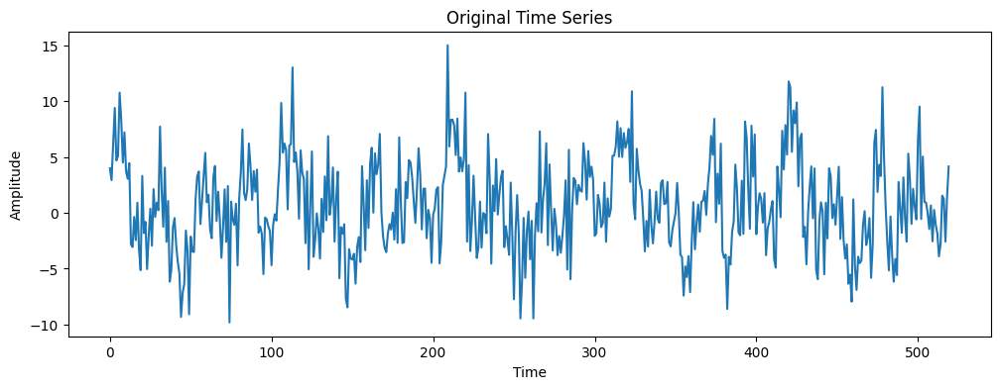

X shape: (490, 30)
y shape: (490,)

X_train_shape vs X_train_scaled_shape: (343, 30) -- (343, 30)
y_train_shape: (343,)

X_validation_shape vs X_validation_scaled_shape: (73, 30) -- (73, 30)
y_validation_shape: (73,)

X_test_shape vs X_test_scaled_shape: (74, 30) -- (74, 30)
y_test_shape: (74,)



Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 30, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 128)                 │          66,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 74,881 (292.50 KB)

 Trainable params: 74,881 (292.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 313ms/step - loss: 0.1504 - val_loss: 0.0345
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0252 - val_loss: 0.0318
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0242 - val_loss: 0.0315
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.0240 - val_loss: 0.0312
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0238 - val_loss: 0.0309
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0237 - val_loss: 0.0306
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0236 - val_loss: 0.0304
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0234 - val_loss: 0.0301
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0233 - val_loss: 0.0299
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0232 - val_loss: 0.0297
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0230 - val_loss: 0.0294
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0229 - val_l

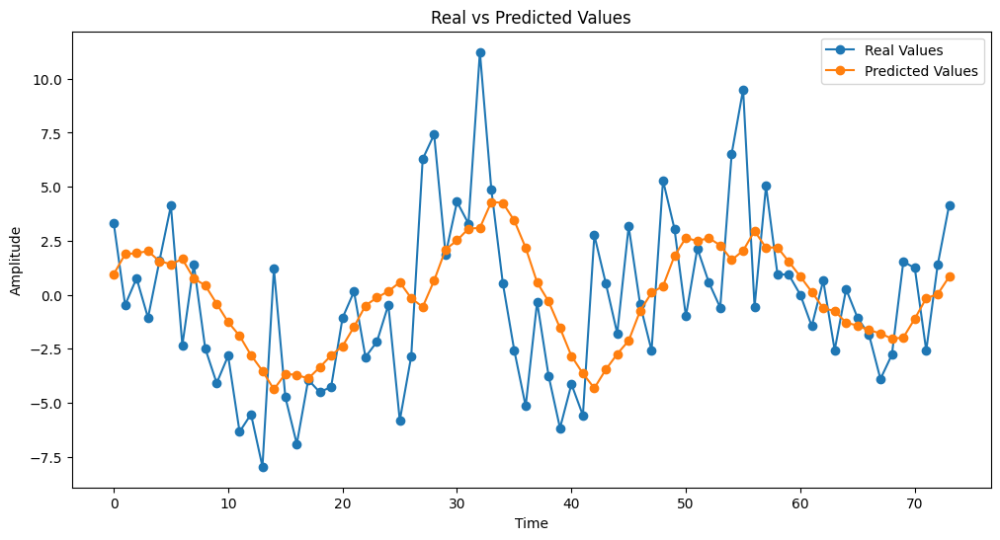

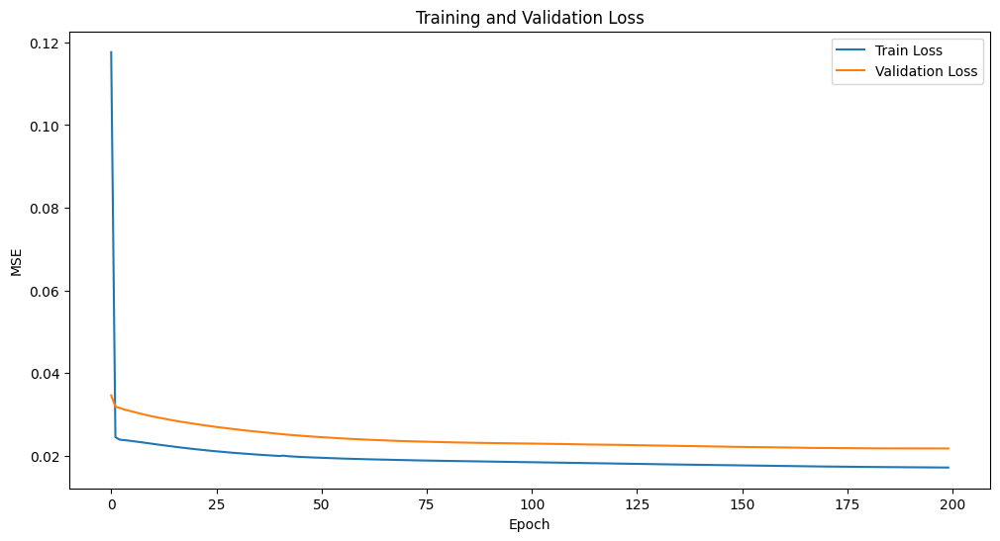

In [ ]:
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, Activation
from sklearn.metrics import mean_squared_error

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()


# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_base_lstm = '/content/drive/MyDrive/Tirocinio/LstmFourier/simpleLSTM.keras'

# Plot the initial signal
plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Original Time Series')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Divide dataset into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaling the input data (X)
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape in order to scale
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

# Scaler fit
scaler_X.fit(X_train_reshaped)

X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Verify the shape
print(f'\nX_train_shape vs X_train_scaled_shape: {X_train.shape} -- {X_train_scaled.shape}')
print(f'y_train_shape: {y_train.shape}\n')
print(f'X_validation_shape vs X_validation_scaled_shape: {X_validation.shape} -- {X_validation_scaled.shape}')
print(f'y_validation_shape: {y_validation.shape}\n')
print(f'X_test_shape vs X_test_scaled_shape: {X_test.shape} -- {X_test_scaled.shape}')
print(f'y_test_shape: {y_test.shape}\n')

# Target (y) scaling
scaler_y = MinMaxScaler(feature_range=(0, 1))

# Target reshape
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

scaler_y.fit(y_train_reshaped)

y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()


# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)

# Output layers
x_output = Dense(64, activation='relu')(x_time)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model with validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_base_lstm)

# Prediction
y_pred_scaled = model.predict(X_test_scaled)
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_inv = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Result
mse = mean_squared_error(y_test_inv, y_pred)
print(f'MSE: {mse}')

# Values plot
plt.figure(figsize=(12, 6))
plt.plot(y_test_inv, label='Real Values', marker='o')
plt.plot(y_pred, label='Predicted Values', marker='o')
plt.title('Real vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

# Loss graph during training
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

## Version 0

This version of the model focuses on forecasting based on a univariate time series, in this case represented by a sine wave, using a combination of time-domain (RNN/LSTM) and frequency-domain (Fourier Transform) approaches. Here’s a detailed explanation of its components:

### 1. **Data Loading and Visualization**
   - A sine wave is visualized, representing sales over time.
   - A dataset is created in a format suitable for network input (X, y).

### 2. **Dataset Preparation**
   - The data is split into training, validation, and test sets using the `divide_dataset_validation` function.
   - The length of the FFT is calculated to align the dimensions of the Fourier-transformed data with the length of the time sequence.

### 3. **Model Architecture**
   - **Input:** A univariate series of length 30.
   - **LSTM Layer:** An LSTM layer with 64 units is used for temporal analysis of the series. The output of this layer returns only the last hidden state (not sequences).
   - **FFT Layer:** A Lambda layer applies the Fourier Transform to the input data, allowing the examination of frequency components.
   - **Attention Mechanism:** An attention layer is applied to the frequency components to assign variable importance to different Fourier values.
   - **Concatenation and Final Layer:** The results from the temporal (LSTM) and frequency (FFT) analyses are combined and passed to a final dense layer to produce the future sales forecast.

### 4. **Compilation and Training**
   - The model is compiled with the Adam optimizer and the MSE (Mean Squared Error) loss function.
   - An **early stopping** mechanism is used to prevent overfitting, halting training if improvement stalls for 10 epochs.

### 5. **Evaluation and Saving**
   - After training, the model is saved and evaluated on the test set. The mean squared error (MSE) is calculated and displayed to quantify the quality of the forecasts.
   - Finally, the actual values and predictions, as well as the loss variation during training, are plotted.

### Key Elements:
- **Time-Frequency Combination:** The model utilizes both LSTM for capturing temporal dependencies and Fourier Transform for frequency analysis, allowing a richer analysis of the time series.
- **Attention Mechanism:** The introduction of attention to the frequency components improves the model's ability to select the most relevant frequencies for the forecast.

###Softmax

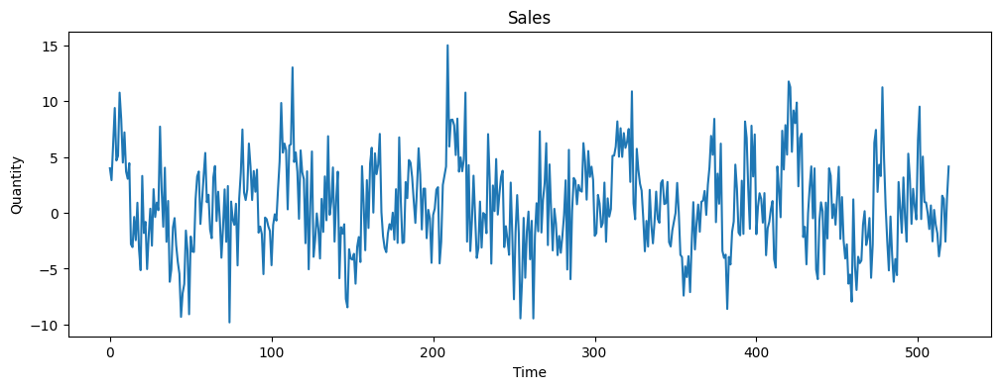

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda (Lambda)           │ (None, 16)             │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 16)             │            272 │ lambda[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ softmax (Softmax)         │ (None, 16)             │              0 │ dense_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply (Multiply)       │ (None, 16)             │              0 │ lambda[0][0],          │
│                           │                        │                │ softmax[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 64)             │         16,896 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 64)             │          1,088 │ multiply[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 128)            │              0 │ lstm_1[0][0],          │
│                           │                        │                │ dense_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 64)             │          8,256 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 1)              │             65 │ dense_4[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 26,577 (103.82 KB)

 Trainable params: 26,577 (103.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 16.1764 - val_loss: 19.8386
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 14.4778 - val_loss: 18.3363
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 13.3676 - val_loss: 17.0965
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 12.4390 - val_loss: 15.9787
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 11.6832 - val_loss: 14.9898
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 11.0871 - val_loss: 14.2190
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 10.6430 - val_loss: 13.7273
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 10.3582 - val_loss: 13.5434
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 10.1653 - val_loss: 13.5764
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 10.0130 - val_loss: 13.6368
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 9.8656 - val_loss: 13.6815
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step -

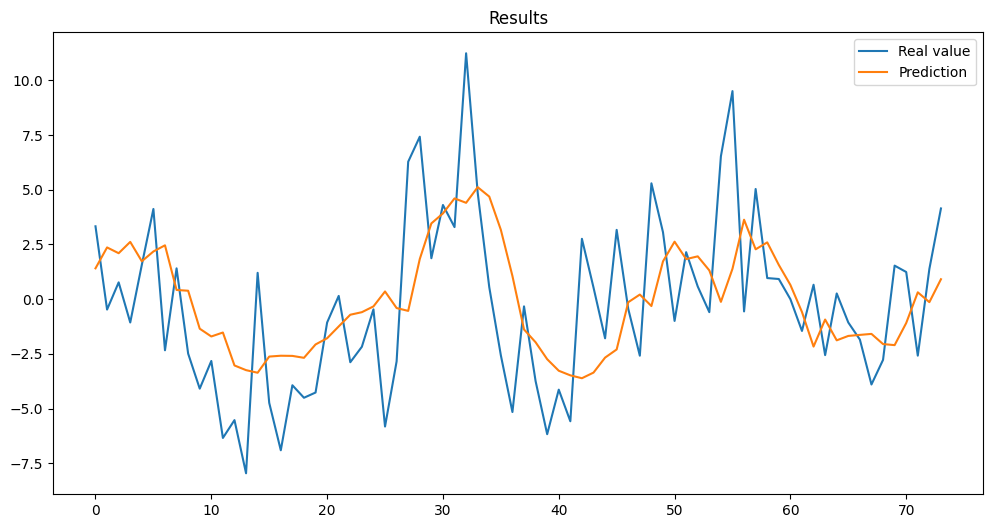



MSE: 11.0279




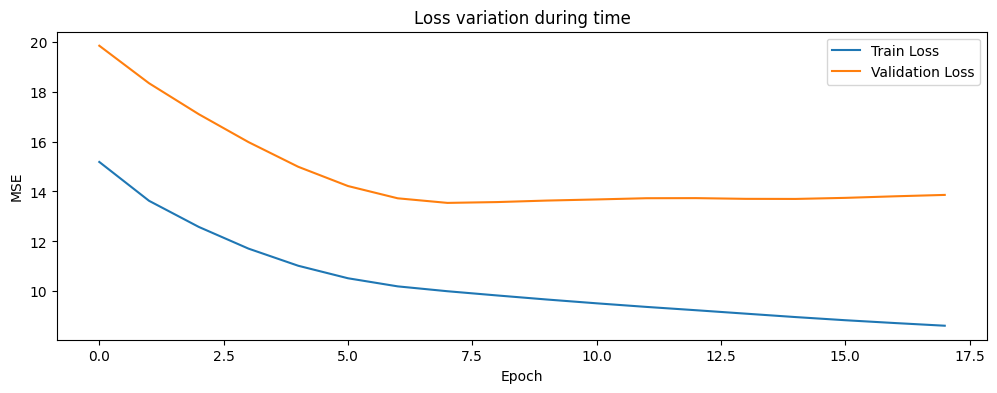

In [ ]:
import numpy as np
import tensorflow as tf
import random

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v0_softmax = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_0/SoftMax.keras'

plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Sales')
plt.xlabel('Time')
plt.ylabel('Quantity')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

# Divide the dataset
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Calculate fft sequence in order to match the dimensionality x_freq_attended = Multiply()([x_freq, attention_weights])
fft_length = sequence_length // 2 + 1

input_sales = Input(shape=(sequence_length, 1))

# Layer for time analysis
x_time = LSTM(64, return_sequences=False)(input_sales)

# fft
x_freq = Lambda(fourier_transform_layer)(input_sales)
attention_scores = Dense(fft_length, activation='tanh')(x_freq)

# Attention layer
attention_weights = Softmax()(attention_scores)
x_freq_attended = Multiply()([x_freq, attention_weights])

# Dense layer for frequencies
x_freq_dense = Dense(64, activation='relu')(x_freq_attended)

# Concatenate time and frequencies
x_combined = Concatenate()([x_time, x_freq_dense])

# Final dense layer
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)  # Future sales prediction

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Model optimizer setting
model.compile(optimizer='adam', loss='mse')

# Print summary of the net
model.summary()

# Definition of early stopping (stop if val_loss doesn't improve)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Model fit
history = model.fit(
    X_train, y_train,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation, y_validation),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model after the training in order to restore in a second time
model.save(path_v0_softmax)

# Test
y_pred = model.predict(X_test)

# Results printing
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Real value')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.title('Results')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Print of the loss
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss variation during time')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

### No Softmax

I decided not to use *Softmax(x)* for the attention values because there is a risk of losing very high values, as they would all be normalized to 1. This would reduce the impact of important values for highly significant frequencies.

Does it also work well with low values? Because if they are all low, the largest one would still be brought up to 1.

Moreover, if there were extremely negative values, *Softmax(x)* would make them positive, and the smallest value among them would be set to zero.

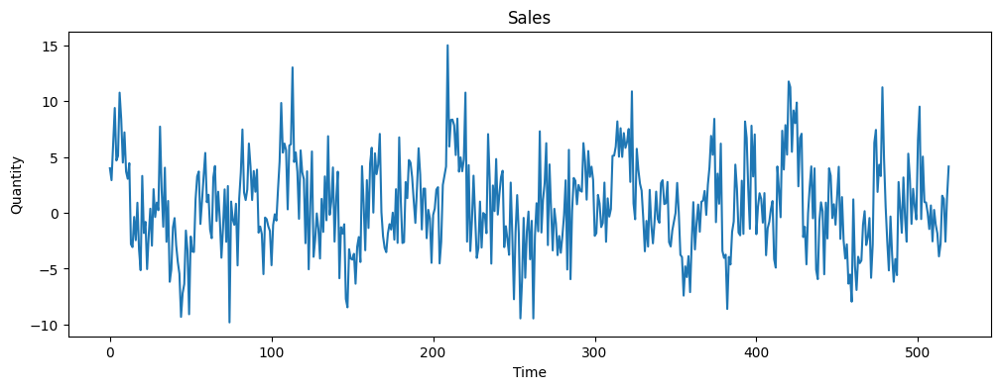

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_1 (Lambda)         │ (None, 16)             │              0 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_6 (Dense)           │ (None, 16)             │            272 │ lambda_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_1 (Multiply)     │ (None, 16)             │              0 │ lambda_1[0][0],        │
│                           │                        │                │ dense_6[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_2 (LSTM)             │ (None, 64)             │         16,896 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 64)             │          1,088 │ multiply_1[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 128)            │              0 │ lstm_2[0][0],          │
│ (Concatenate)             │                        │                │ dense_7[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_8 (Dense)           │ (None, 64)             │          8,256 │ concatenate_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_9 (Dense)           │ (None, 1)              │             65 │ dense_8[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 26,577 (103.82 KB)

 Trainable params: 26,577 (103.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 18.7749 - val_loss: 43.1031
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 13.4167 - val_loss: 37.1015
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 11.3702 - val_loss: 35.8041
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 10.7994 - val_loss: 33.8527
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 10.0448 - val_loss: 32.8624
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 9.5073 - val_loss: 31.8887
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 8.9552 - val_loss: 31.3795
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 8.5599 - val_loss: 30.9669
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 8.2170 - val_loss: 30.3299
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 7.9281 - val_loss: 30.2431
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 7.6750 - val_loss: 30.2315
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss:

1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


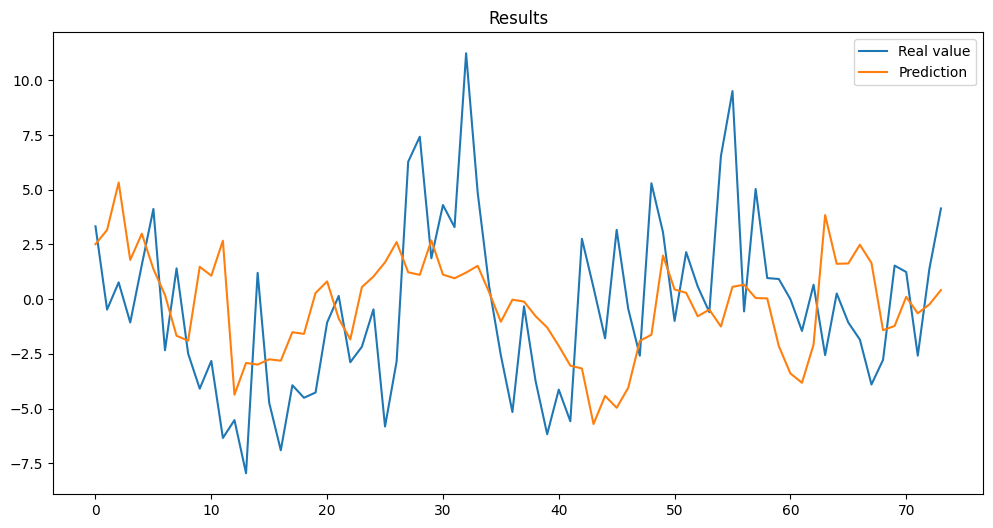



MSE: 16.3611




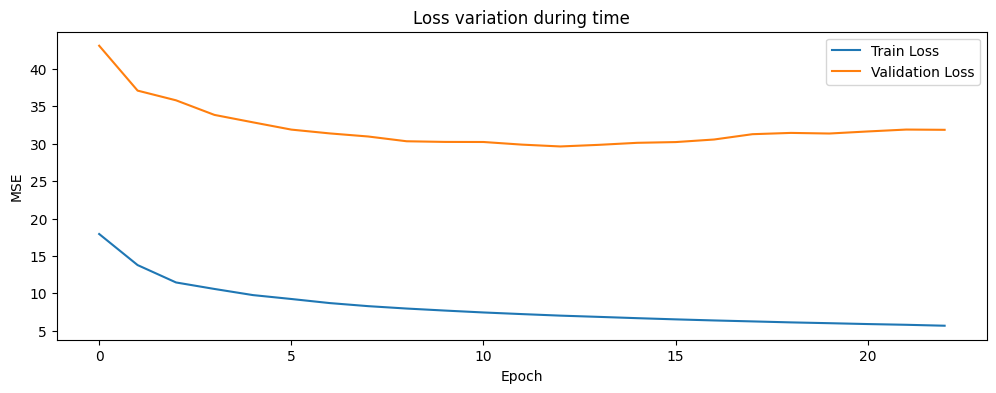

In [ ]:
import numpy as np
import tensorflow as tf
import random

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()


# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v0_no_softmax = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_0/No_SoftMax.keras'

plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Sales')
plt.xlabel('Time')
plt.ylabel('Quantity')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

# Divide the dataset
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Calculate fft sequence in order to match the dimensionality x_freq_attended = Multiply()([x_freq, attention_weights])
fft_length = sequence_length // 2 + 1

input_sales = Input(shape=(sequence_length, 1))

# Layer for time analysis
x_time = LSTM(64, return_sequences=False)(input_sales)

# fft
x_freq = Lambda(fourier_transform_layer)(input_sales)
attention_scores = Dense(fft_length, activation='tanh')(x_freq)

# Attention layer
x_freq_attended = Multiply()([x_freq, attention_scores])

# Dense layer for frequencies
x_freq_dense = Dense(64, activation='relu')(x_freq_attended)

# Concatenate time and frequencies
x_combined = Concatenate()([x_time, x_freq_dense])

# Final dense layer
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)  # Future sales prediction

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Model optimizer setting
model.compile(optimizer='adam', loss='mse')

# Print summary of the net
model.summary()

# Definition of early stopping (stop if val_loss doesn't improve)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Model fit
history = model.fit(
    X_train, y_train,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation, y_validation),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model after the training in order to restore in a second time
model.save(path_v0_no_softmax)

# Test
y_pred = model.predict(X_test)

# Result printing
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Real value')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.title('Results')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Print of the loss
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss variation during time')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

### Leaky relu

I want to try using a leaky ReLU as the activation function for the attention score values, as it should account for the weight of negative values. Here's an image illustrating the function. I'll be using it in place of `tanh(x)` as the activation function to see if it improves the model's performance.

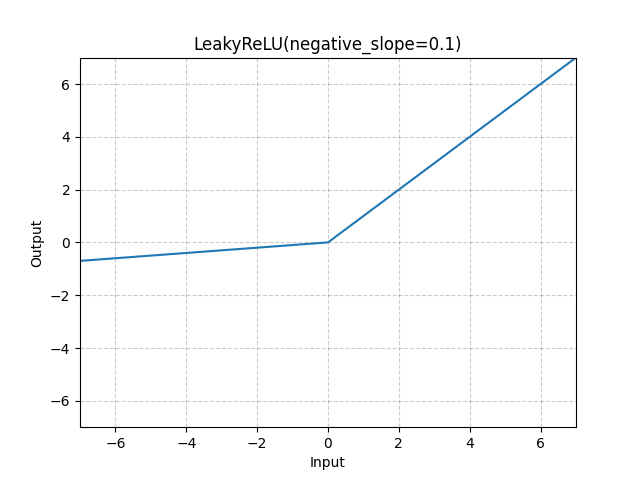

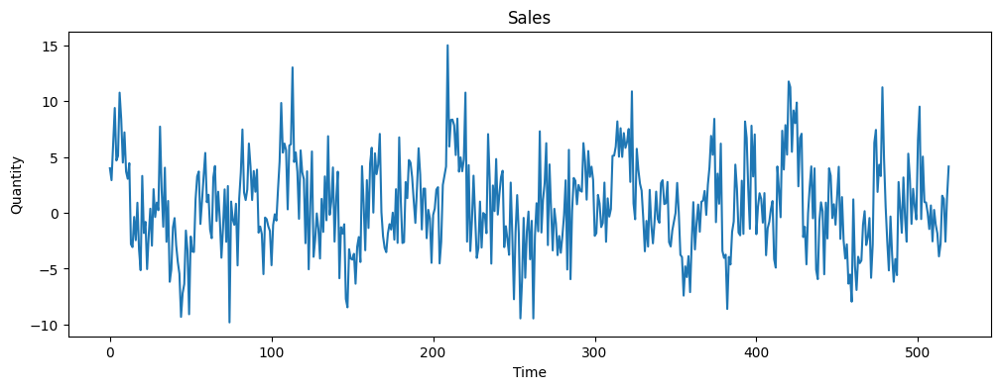

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda (Lambda)           │ (None, 16)             │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 16)             │            272 │ lambda[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ softmax (Softmax)         │ (None, 16)             │              0 │ dense_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply (Multiply)       │ (None, 16)             │              0 │ lambda[0][0],          │
│                           │                        │                │ softmax[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_1 (LSTM)             │ (None, 64)             │         16,896 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 64)             │          1,088 │ multiply[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 128)            │              0 │ lstm_1[0][0],          │
│                           │                        │                │ dense_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 64)             │          8,256 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 1)              │             65 │ dense_4[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 26,577 (103.82 KB)

 Trainable params: 26,577 (103.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 18.5205 - val_loss: 19.6698
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 15.4497 - val_loss: 17.6880
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 14.3894 - val_loss: 17.2682
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 13.1821 - val_loss: 17.3149
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 12.4826 - val_loss: 16.2989
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 11.8401 - val_loss: 15.1605
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 11.3207 - val_loss: 14.4843
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 10.9404 - val_loss: 14.0388
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 10.6635 - val_loss: 13.8579
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 10.4551 - val_loss: 13.6521
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 10.3347 - val_loss: 13.6767
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step -

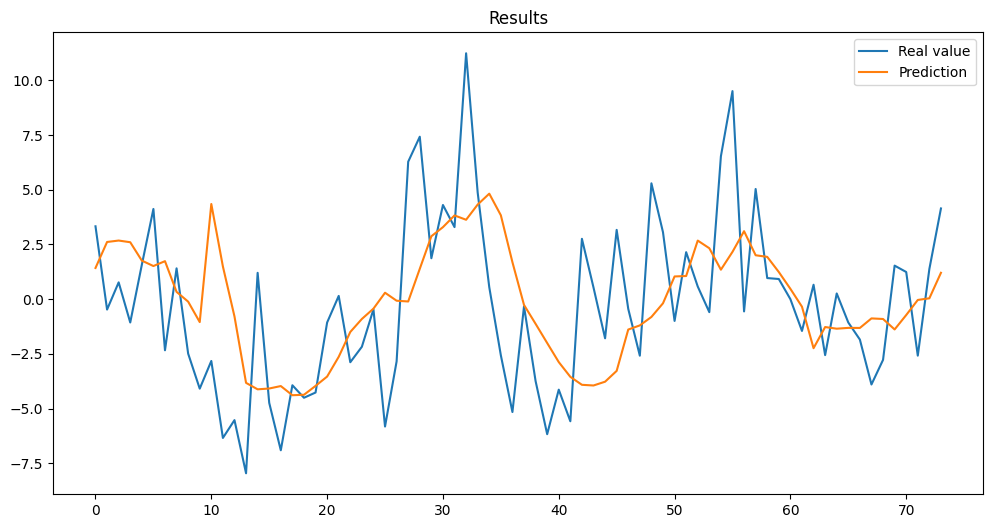



MSE: 12.6307




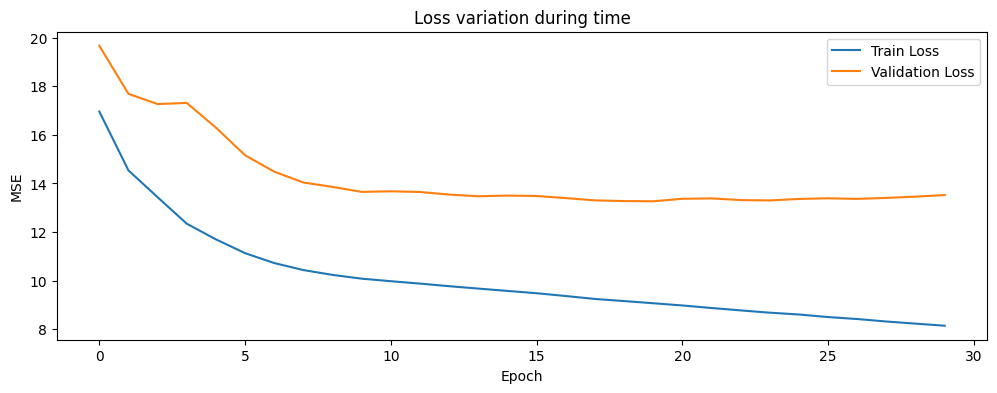

In [ ]:
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import LeakyReLU

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v0_leakyReLu = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_0/LeakyRelu.keras'

plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Sales')
plt.xlabel('Time')
plt.ylabel('Quantity')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

# Divide the dataset
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Calculate fft sequence in order to match the dimensionality
# x_freq_attended = Multiply()([x_freq, attention_weights])
fft_length = sequence_length // 2 + 1

input_sales = Input(shape=(sequence_length, 1))

# Layer for time analysis
x_time = LSTM(64, return_sequences=False)(input_sales)

# fft
x_freq = Lambda(fourier_transform_layer)(input_sales)
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_weights = Softmax()(attention_scores)

# Attention layer
x_freq_attended = Multiply()([x_freq, attention_weights])

# Dense layer for frequencies
x_freq_dense = Dense(64, activation='relu')(x_freq_attended)

# Concatenate time and frequencies
x_combined = Concatenate()([x_time, x_freq_dense])

# Final dense layer
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)  # Future sales prediction

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Model optimizer setting
model.compile(optimizer='adam', loss='mse')

# Print summary of the net
model.summary()

# Definition of early stopping (stop if val_loss doesn't improve)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Model fit
history = model.fit(
    X_train, y_train,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation, y_validation),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model after the training in order to restore in a second time
model.save(path_v0_leakyReLu)

# Test
y_pred = model.predict(X_test)

# Results printing
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Real value')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.title('Results')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Print of the loss
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss variation during time')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

#### Confronting the three version

In [ ]:
import pandas as pd
import tensorflow as tf

baseline_lstm = tf.keras.models.load_model(path_base_lstm)
model_v0_softmax = tf.keras.models.load_model(path_v0_softmax, custom_objects={'fourier_transform_layer': fourier_transform_layer})
model_v0_no_softmax = tf.keras.models.load_model(path_v0_no_softmax, custom_objects={'fourier_transform_layer': fourier_transform_layer})
model_v0_leakyReLu = tf.keras.models.load_model(path_v0_leakyReLu, custom_objects={'LeakyReLU': LeakyReLU,'fourier_transform_layer': fourier_transform_layer})

models = [baseline_lstm, model_v0_softmax, model_v0_no_softmax, model_v0_leakyReLu]

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

# Divide the dataset
_, _, _, _, X_test, y_test = divide_dataset_validation(X, y)

# Scale the test data
scaler_X = MinMaxScaler(feature_range=(0, 1))
X_test_scaled = scaler_X.fit_transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)

scaler_y = MinMaxScaler(feature_range=(0, 1))
y_test_scaled = scaler_y.fit_transform(y_test.reshape(-1, 1)).flatten()

# Prediction and MSE Calculation
y_pred_scaled = []
y_pred = []
mse_errors = []

for i, model in enumerate(models):
    pred_scaled = model.predict(X_test_scaled[..., np.newaxis])
    pred = scaler_y.inverse_transform(pred_scaled)

    # Append predictions
    y_pred_scaled.append(pred_scaled)
    y_pred.append(pred)

    # Calculate and print MSE
    mse = mean_squared_error(y_test, pred.flatten())
    mse_errors.append(mse)

# Transform mse_errors into a dataframe in which the row are named version and the index and the column is mse
mse_df = pd.DataFrame(mse_errors, index=['Baseline LSTM','Softmax', 'No Softmax', 'Leaky Relu'], columns=['MSE'])
print(mse_df)


# Plot using the dropdown feature
plot_px_dropdown(series=[y_test] + y_pred,
                 labels=['Actual values'] + list(mse_df.index),
                 title='Model Predictions vs Actual Values')

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
                     MSE
Baseline LSTM  11.458592
Softmax        21.027010
No Softmax     40.049862
Leaky Relu     27.358422


## Version 1

Here is the analysis and comparison between **Model 0** and **Model 1** you provided.

### Key Differences Between Model 0 and Model 1:

1. **Data Scaling:**
   - **Model 0:** Does not apply any scaling transformation to the data.
   - **Model 1:** Uses a **MinMaxScaler** to normalize the input data between 0 and 1. This is an important improvement, as LSTMs are sensitive to the scale of the data, and normalization can enhance model performance and convergence speed.

2. **LSTM Dimensions:**
   - **Model 0:** Uses an LSTM layer with 64 units for temporal analysis.
   - **Model 1:** Increases the number of LSTM units to **128** and changes the activation to **'relu'**. Increasing the units allows the model to capture more complex temporal dependencies, while the 'relu' activation replaces the default (which would be 'tanh'), potentially improving gradient saturation handling.

3. **Frequency Network Architecture:**
   - **Model 0:** The output from the FFT passes through a dense layer with `tanh` activation.
   - **Model 1:** Changes the activation of the dense layer for attention to **'relu'**, which can improve performance in certain contexts, especially with normalized data.

4. **Optimizer:**
   - **Model 0:** Uses the **Adam** optimizer.
   - **Model 1:** Switches to **RMSprop**, which is often preferred for recurrent networks like LSTM, as it handles gradient oscillations better.

5. **Data Shape:**
   - Although the data shape remains the same in both models, **Model 1** more carefully specifies the input shape for the LSTM using `input_shape=(X_train.shape[1], X_train.shape[2])`. This can be helpful when moving to a multi-feature context or making the model more robust.

### Similarities Between Model 0 and Model 1:

- Both use a combination of **temporal analysis (LSTM)** and **frequency analysis (Fourier Transform)**, with the application of an **attention mechanism** to the frequency components.
- Both models follow a similar approach for the **attention mechanism**, multiplying the frequencies derived from the FFT with attention weights to focus on the most relevant components.
- The use of **early stopping** is common to both, monitoring the validation loss to prevent overfitting.

### Expected Improvements:
- The data normalization and increased LSTM capacity in **Model 1** should improve performance, especially when there are more complex variations in the data.
- The switch from Adam to **RMSprop** should make gradient descent more stable in recurrent contexts, further improving the training process.

###Softmax

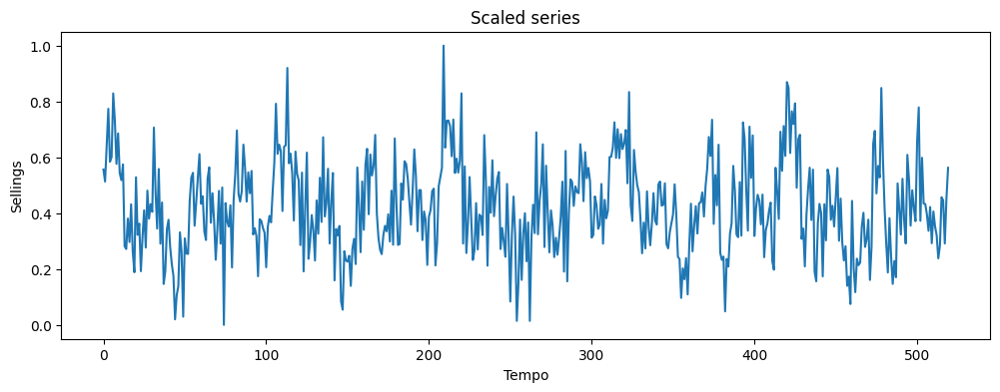

X shape: (490, 30, 1)
y shape: (490, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_3 (Lambda)         │ (None, 16)             │              0 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_14 (Dense)          │ (None, 16)             │            272 │ lambda_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ softmax_2 (Softmax)       │ (None, 16)             │              0 │ dense_14[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_3 (Multiply)     │ (None, 16)             │              0 │ lambda_3[0][0],        │
│                           │                        │                │ softmax_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_4 (LSTM)             │ (None, 128)            │         66,560 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_15 (Dense)          │ (None, 64)             │          1,088 │ multiply_3[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 192)            │              0 │ lstm_4[0][0],          │
│ (Concatenate)             │                        │                │ dense_15[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_16 (Dense)          │ (None, 64)             │         12,352 │ concatenate_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_17 (Dense)          │ (None, 1)              │             65 │ dense_16[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 80,337 (313.82 KB)

 Trainable params: 80,337 (313.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1098 - val_loss: 0.0262
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0284 - val_loss: 0.0256
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.0264 - val_loss: 0.0258
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.0252 - val_loss: 0.0260
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0245 - val_loss: 0.0262
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.0239 - val_loss: 0.0264
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0234 - val_loss: 0.0265
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0230 - val_loss: 0.0265
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0227 - val_loss: 0.0265
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0224 - val_loss: 0.0266
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0221 - val_loss: 0.0266
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0219 - 

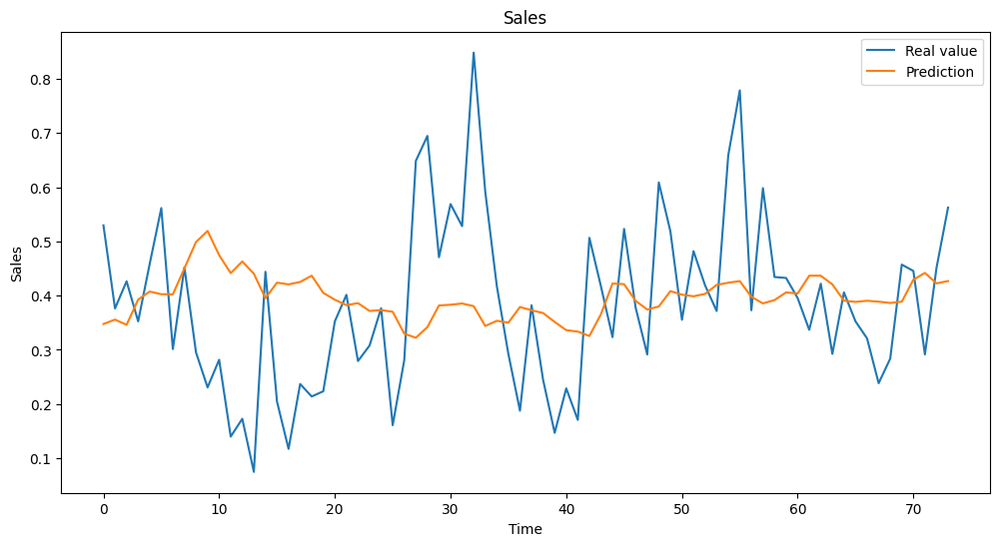



MSE: 0.0279




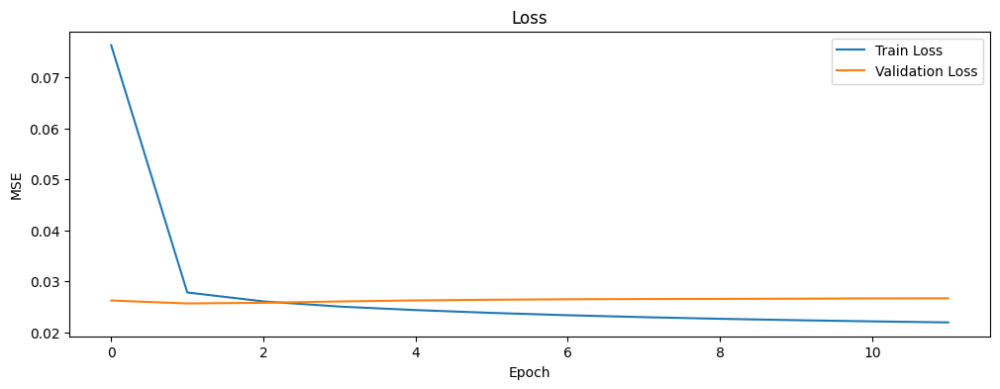

In [ ]:
import numpy as np
import tensorflow as tf
import random

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()


# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v1_softmax = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_1/Softmax.keras'

# LSTM are sensitive to the scale of input data, so it's important to scale the data
# before training the model. In order to make this use MinMaxScaler
scaler = MinMaxScaler(feature_range = (0,1))
sine_wave_sc_v1 = scaler.fit_transform(sine_wave.reshape(-1,1))

plt.figure(figsize=(12, 4))
plt.plot(sine_wave_sc_v1)
plt.title('Scaled series')
plt.xlabel('Tempo')
plt.ylabel('Sellings')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave_sc_v1, sequence_length)
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

fft_length = sequence_length // 2 + 1

# Input Layer with dimension equals to (sequence_lenght, 1)
input_sales = Input(shape=(sequence_length, 1))

# Branch for time, using LSTM
x_time = LSTM(128, activation='relu', return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2]))(input_sales)

# Branch for frequency study analysis
x_freq = Lambda(fourier_transform_layer)(input_sales)   # Apply FFT

attention_scores = Dense(fft_length, activation='relu')(x_freq)
attention_weights = Softmax()(attention_scores) # Use softmax

# Multiply attention weights with the frequencies found
x_freq_attended = Multiply()([x_freq, attention_weights])

x_freq_dense = Dense(64, activation='relu')(x_freq_attended)

# Concatenate
x_combined = Concatenate()([x_time, x_freq_dense])

# Final layers used to predict future
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Model compile
model.compile(optimizer='rmsprop', loss='mse')

# Print summary of the model
model.summary()

# Early stop (in order to prevent overfitting)
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Model fit
history = model.fit(
    X_train, y_train,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation,y_validation),
    callbacks=[early_stopping],
    verbose=1
)

# Saving the model
model.save(path_v1_softmax)

# Data prediction
y_pred = model.predict(X_test)

# Result visualization
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Real value')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.title('Sales')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

### No softmax

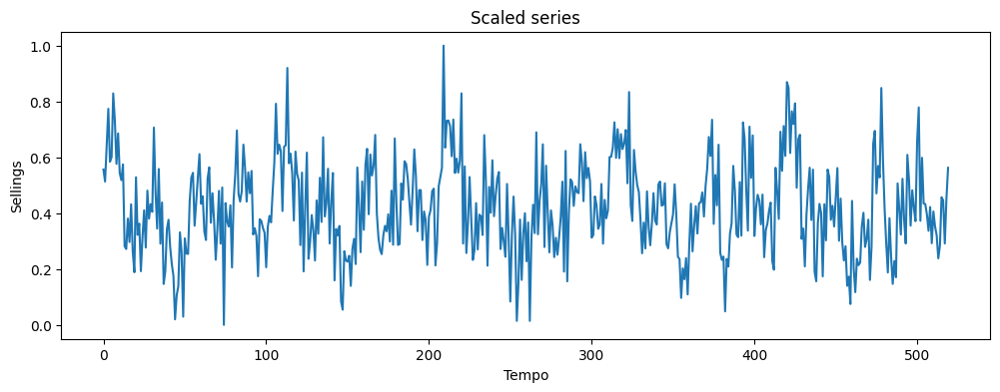

X shape: (490, 30, 1)
y shape: (490, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_4 (Lambda)         │ (None, 16)             │              0 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_18 (Dense)          │ (None, 16)             │            272 │ lambda_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_4 (Multiply)     │ (None, 16)             │              0 │ lambda_4[0][0],        │
│                           │                        │                │ dense_18[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_5 (LSTM)             │ (None, 128)            │         66,560 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_19 (Dense)          │ (None, 64)             │          1,088 │ multiply_4[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_4             │ (None, 192)            │              0 │ lstm_5[0][0],          │
│ (Concatenate)             │                        │                │ dense_19[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_20 (Dense)          │ (None, 64)             │         12,352 │ concatenate_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_21 (Dense)          │ (None, 1)              │             65 │ dense_20[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 80,337 (313.82 KB)

 Trainable params: 80,337 (313.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 170ms/step - loss: 2.1405 - val_loss: 0.0456
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0387 - val_loss: 0.0482
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0399 - val_loss: 0.1193
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - loss: 0.2540 - val_loss: 0.2626
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.1380 - val_loss: 0.1111
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 177ms/step - loss: 0.1101 - val_loss: 0.4378
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 554ms/step - loss: 0.2618 - val_loss: 0.1283
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0862 - val_loss: 0.2532
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.1989 - val_loss: 0.1663
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0966 - val_loss: 0.1597
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.1287 - val_loss: 0.2026
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step


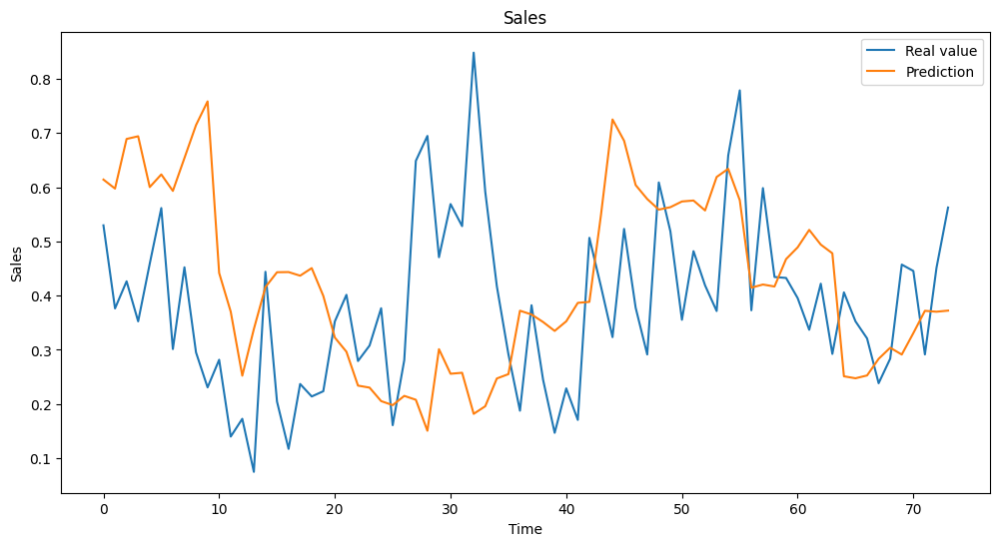



MSE: 0.0486




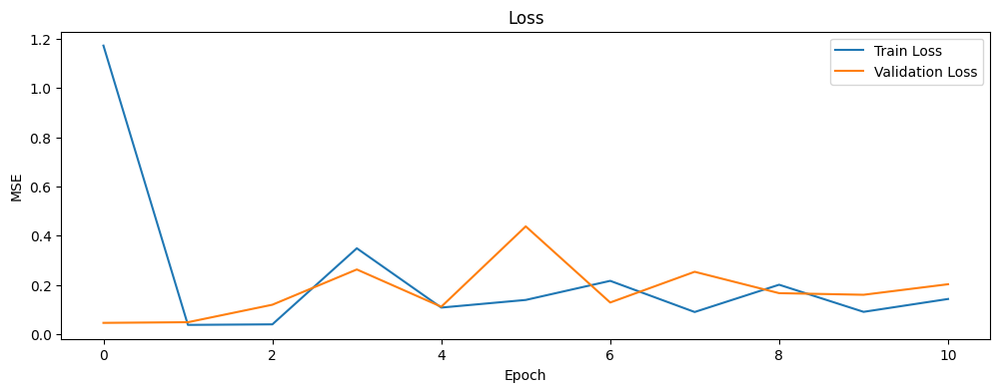

In [ ]:
import numpy as np
import tensorflow as tf
import random

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v1_no_softmax = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_1/No_Softmax.keras'

# LSTM are sensitive to the scale of input data, so it's important to scale the data
# before training the model. In order to make this use MinMaxScaler
scaler = MinMaxScaler(feature_range = (0,1))
sine_wave_sc_v1 = scaler.fit_transform(sine_wave.reshape(-1,1))

plt.figure(figsize=(12, 4))
plt.plot(sine_wave_sc_v1)
plt.title('Scaled series')
plt.xlabel('Tempo')
plt.ylabel('Sellings')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave_sc_v1, sequence_length)
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

fft_length = sequence_length // 2 + 1

# Input Layer with dimension equals to (sequence_lenght, 1)
input_sales = Input(shape=(sequence_length, 1))

# Branch for time, using LSTM
x_time = LSTM(128, activation='relu', return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2]))(input_sales)

# Branch for frequency study analysis
x_freq = Lambda(fourier_transform_layer)(input_sales)   # Apply FFT

attention_scores = Dense(fft_length, activation='relu')(x_freq)

# Multiply attention weights with the frequencies found
x_freq_attended = Multiply()([x_freq, attention_scores])

x_freq_dense = Dense(64, activation='relu')(x_freq_attended)

# Concatenate
x_combined = Concatenate()([x_time, x_freq_dense])

# Final layers used to predict future
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Model compile
model.compile(optimizer='rmsprop', loss='mse')

# Print summary of the model
model.summary()

# Early stop (in order to prevent overfitting)
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Model fit
history = model.fit(
    X_train, y_train,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation,y_validation),
    callbacks=[early_stopping],
    verbose=1
)

# Saving the model
model.save(path_v1_no_softmax)

# Data prediction
y_pred = model.predict(X_test)

# Result visualization
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Real value')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.title('Sales')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

### Leaky Relu

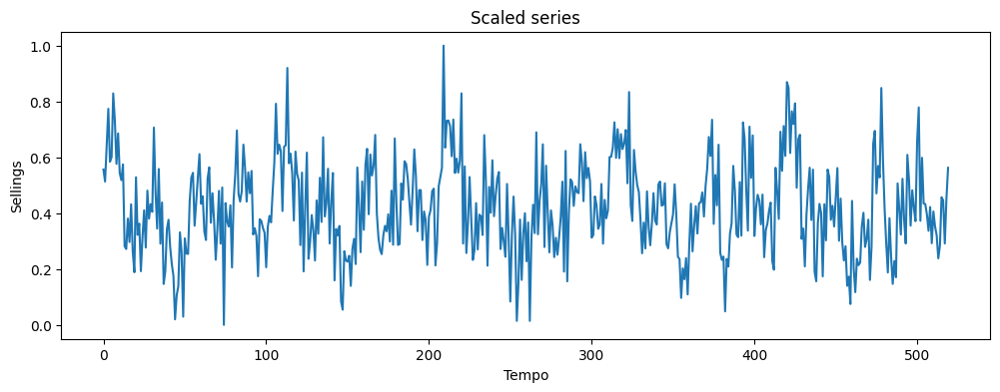

X shape: (490, 30, 1)
y shape: (490, 1)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_5 (Lambda)         │ (None, 16)             │              0 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_22 (Dense)          │ (None, 16)             │            272 │ lambda_5[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ softmax_3 (Softmax)       │ (None, 16)             │              0 │ dense_22[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_5 (Multiply)     │ (None, 16)             │              0 │ lambda_5[0][0],        │
│                           │                        │                │ softmax_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_6 (LSTM)             │ (None, 128)            │         66,560 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_23 (Dense)          │ (None, 64)             │          1,088 │ multiply_5[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_5             │ (None, 192)            │              0 │ lstm_6[0][0],          │
│ (Concatenate)             │                        │                │ dense_23[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_24 (Dense)          │ (None, 64)             │         12,352 │ concatenate_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_25 (Dense)          │ (None, 1)              │             65 │ dense_24[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 80,337 (313.82 KB)

 Trainable params: 80,337 (313.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.1097 - val_loss: 0.0262
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0285 - val_loss: 0.0257
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0264 - val_loss: 0.0258
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.0252 - val_loss: 0.0260
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step - loss: 0.0245 - val_loss: 0.0262
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.0239 - val_loss: 0.0264
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0234 - val_loss: 0.0265
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0230 - val_loss: 0.0265
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0227 - val_loss: 0.0265
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0224 - val_loss: 0.0266
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0221 - val_loss: 0.0266
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0219 - val

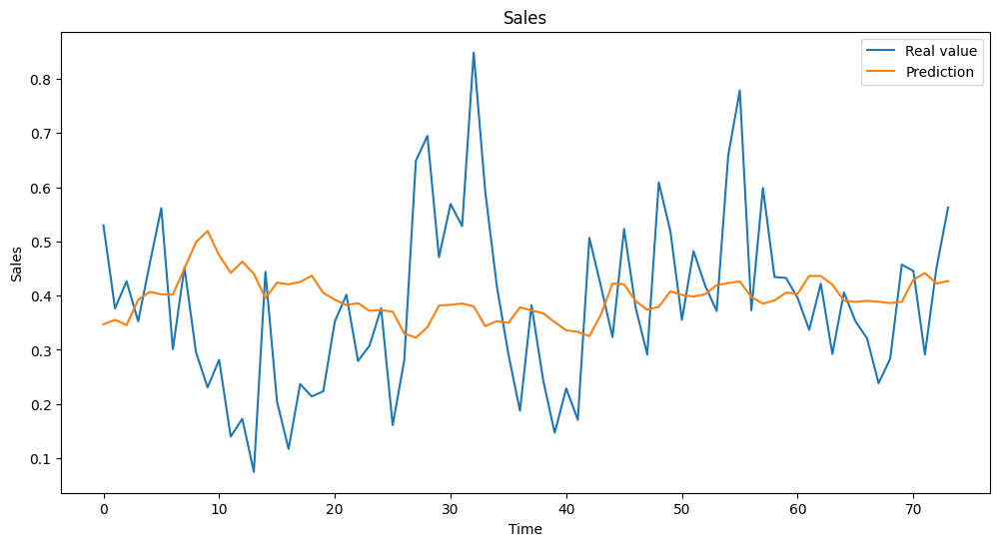



MSE: 0.0280




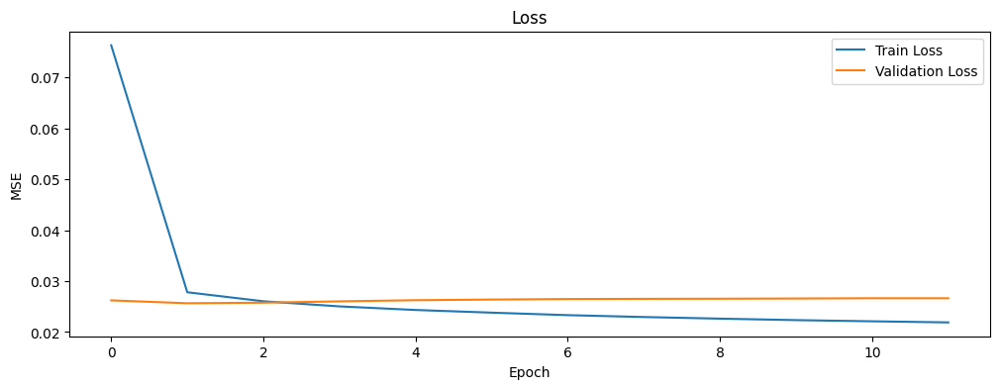

In [ ]:
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import LeakyReLU

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v1_leaky_relu = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_1/LeakyRelu.keras'

# LSTM are sensitive to the scale of input data, so it's important to scale the data
# before training the model. In order to make this use MinMaxScaler
scaler = MinMaxScaler(feature_range = (0,1))
sine_wave_sc_v1 = scaler.fit_transform(sine_wave.reshape(-1,1))

plt.figure(figsize=(12, 4))
plt.plot(sine_wave_sc_v1)
plt.title('Scaled series')
plt.xlabel('Tempo')
plt.ylabel('Sellings')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave_sc_v1, sequence_length)
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

fft_length = sequence_length // 2 + 1

# Input Layer with dimension equals to (sequence_lenght, 1)
input_sales = Input(shape=(sequence_length, 1))

# Branch for time, using LSTM
x_time = LSTM(128, activation='relu', return_sequences=False, input_shape=(X_train.shape[1], X_train.shape[2]))(input_sales)

# Branch for frequency study analysis
x_freq = Lambda(fourier_transform_layer)(input_sales)
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_weights = Softmax()(attention_scores)

# Attention layer
x_freq_attended = Multiply()([x_freq, attention_weights])

x_freq_dense = Dense(64, activation='relu')(x_freq_attended)

# Concatenate
x_combined = Concatenate()([x_time, x_freq_dense])

# Final layers used to predict future
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Model compile
model.compile(optimizer='rmsprop', loss='mse')

# Print summary of the model
model.summary()

# Early stop (in order to prevent overfitting)
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Model fit
history = model.fit(
    X_train, y_train,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation,y_validation),
    callbacks=[early_stopping],
    verbose=1
)

# Saving the model
model.save(path_v1_leaky_relu)

# Data prediction
y_pred = model.predict(X_test)

# Result visualization
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test)), y_test, label='Real value')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.title('Sales')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

#### Confronting the three version

In [ ]:
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.models import load_model

baseline_lstm = tf.keras.models.load_model(path_base_lstm)
model_v1_softmax = load_model(path_v1_softmax, custom_objects={'fourier_transform_layer': fourier_transform_layer})
model_v1_no_softmax = load_model(path_v1_no_softmax, custom_objects={'fourier_transform_layer': fourier_transform_layer})
model_v1_leakyReLu = load_model(path_v1_leaky_relu, custom_objects={'LeakyReLU': LeakyReLU, 'fourier_transform_layer': fourier_transform_layer})

models = [baseline_lstm, model_v1_softmax, model_v1_no_softmax, model_v1_leakyReLu]

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

# Divide the dataset
_, _, _, _, X_test, y_test = divide_dataset_validation(X, y)

# Scale the test data
scaler_X = MinMaxScaler(feature_range=(0, 1))
X_test_scaled = scaler_X.fit_transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)

scaler_y = MinMaxScaler(feature_range=(0, 1))
y_test_scaled = scaler_y.fit_transform(y_test.reshape(-1, 1)).flatten()

# Prediction and MSE Calculation
y_pred_scaled = []
y_pred = []
mse_errors = []

for i, model in enumerate(models):
    pred_scaled = model.predict(X_test_scaled[..., np.newaxis])
    pred = scaler_y.inverse_transform(pred_scaled)

    # Append predictions
    y_pred_scaled.append(pred_scaled)
    y_pred.append(pred)

    # Calculate and print MSE
    mse = mean_squared_error(y_test, pred.flatten())
    mse_errors.append(mse)

# Transform mse_errors into a dataframe in which the row are named version and the index and the column is mse
mse_df = pd.DataFrame(mse_errors, index=['Baseline LSTM','Softmax', 'No Softmax', 'Leaky Relu'], columns=['MSE'])
print(mse_df)


# Plot using the dropdown feature
plot_px_dropdown(series=[y_test] + y_pred,
                 labels=['Actual values'] + list(mse_df.index),
                 title='Model Predictions vs Actual Values')

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
                     MSE
Baseline LSTM  11.458592
Softmax        16.937117
No Softmax     54.045825
Leaky Relu     16.941830


##Version 2

**Data leakage** occurs when information from outside the training dataset is inadvertently used to create the model, leading to overly optimistic performance estimates.
In the previous version there was a data leakage during the scaling operation.

**Scaling Before Splitting**


1.  **Issue**: by fitting the scaler on the entire dataset, you allow information from the test set to influence the scaling parameters (i.e., the minimum and maximum values). This means that the model indirectly has access to information from the test set during training, which can lead to overly optimistic evaluation metrics.
2.  **Impact**: the model might perform better on the test set than it would on truly unseen data because the scaling process has already "seen" the test data.

When we normalize the input variables, this requires that we first calculate the minimum and maximum values for each variable before using these values to scale the variables. The dataset is then split into train and test datasets, but the examples in the training dataset know something about the data in the test dataset; they have been scaled by the global minimum and maximum values, so they know more about the global distribution of the variable then they should.

We get the same type of leakage with almost all data preparation techniques; for example, standardization estimates the mean and standard deviation values from the domain in order to scale the variables; even models that impute missing values using a model or summary statistics will draw on the full dataset to fill in values in the training dataset.

**Data preparation must be fit on the training dataset only**. That is, any coefficients or models prepared for the data preparation process must only use rows of data in the training dataset.

Once fit, the data preparation algorithms or models can then be applied to the training dataset, and to the test dataset.

1. Split Data.
2. Fit Data Preparation on Training Dataset.
3. Apply Data Preparation to Train and Test Datasets.
4. Evaluate Models.


---
---

**Key Differences Between Model 1 and Model 2**

1. **Data Scaling:**
   - **Model 1:** Normalizes only the input sine wave (`sine_wave`) using **MinMaxScaler** between 0 and 1, without applying scaling to the target (`y`).
   - **Model 2:** Normalizes both the input data (`X`) and the targets (`y`) using **MinMaxScaler**. This approach is more comprehensive because scaling both inputs and targets ensures proper mapping and facilitates more accurate model optimization.

2. **Reshaping Data Before Scaling:**
   - **Model 1:** No explicit reshaping step is mentioned before scaling.
   - **Model 2:** Before normalization, the data is reshaped into 1D vectors (`reshape(-1, 1)`) and then converted back to the original shape after scaling. This step ensures the scaler functions correctly on the data.

3. **Inverting Scaling on Results:**
   - **Model 1:** There is no "inversion" step to rescale the predicted data, so predictions remain in the normalized scale.
   - **Model 2:** After prediction, the model reverses the scaling of the output data using `scaler_y.inverse_transform`. This step is crucial to bring the data back to the original scale for accurate comparisons between predictions and actual values.

4. **LSTM Capacity and Network Structure:**
   - In terms of model architecture, **Model 2** remains similar to **Model 1**, maintaining 128 LSTM units, frequency analysis through FFT, and an attention mechanism. The main difference is the inclusion of scaling management, making the model more robust in practical contexts where data may vary significantly in scale.

5. **Attention Weights Usage Comparison:**
   - **Model 1:** Uses `relu` to compute attention scores on frequency components, followed by a softmax to normalize the weights.
   - **Model 2:** Keeps the same configuration for attention, using `relu` for the scores and `softmax` for weight normalization. There are no significant differences in this aspect.

6. **Prediction Process:**
   - **Model 1:** Prediction results are plotted directly after training, without scaling inversion.
   - **Model 2:** Prediction results are inverted through the scaler to be compared with the original data, providing more interpretable and accurate outcomes.

**Similarities Between Model 1 and Model 2:**
- **Model Architecture:** Both models use an LSTM-based architecture for temporal analysis, FFT for frequency analysis, and an attention mechanism to enhance the relevance of frequency components.
- **Optimizer:** Both use **RMSprop** as the optimizer and apply the **MSE** loss.
- **Early Stopping:** Present in both models to prevent overfitting.
- **Evaluation and Visualization:** Both models predict and evaluate performance using MSE, plotting both loss values and predictions against actual data.

**Expected Improvements:**
- **Model 2** should improve overall accuracy by normalizing both the inputs and the targets and then reversing the scaling afterward, providing more accurate and comparable predictions on the original scale.

### Softmax

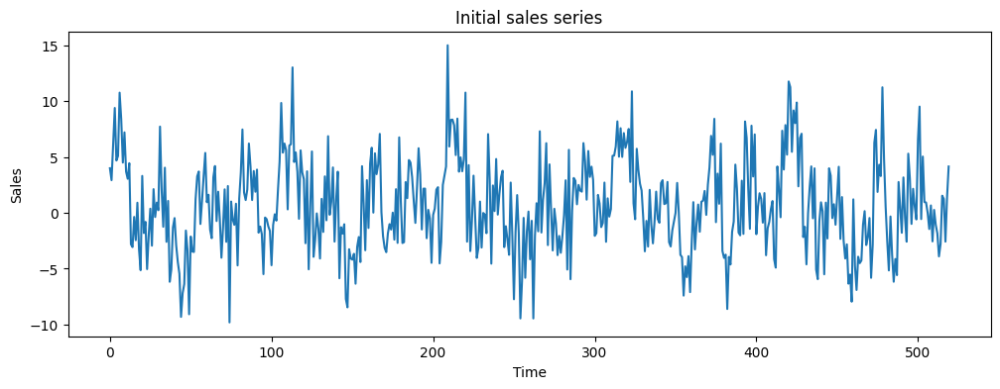

X shape: (490, 30)
y shape: (490,)


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7             │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_6 (Lambda)         │ (None, 16)             │              0 │ input_layer_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_26 (Dense)          │ (None, 16)             │            272 │ lambda_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ softmax_4 (Softmax)       │ (None, 16)             │              0 │ dense_26[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_6 (Multiply)     │ (None, 16)             │              0 │ lambda_6[0][0],        │
│                           │                        │                │ softmax_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_7 (LSTM)             │ (None, 128)            │         66,560 │ input_layer_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_27 (Dense)          │ (None, 64)             │          1,088 │ multiply_6[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_6             │ (None, 192)            │              0 │ lstm_7[0][0],          │
│ (Concatenate)             │                        │                │ dense_27[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_28 (Dense)          │ (None, 64)             │         12,352 │ concatenate_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_29 (Dense)          │ (None, 1)              │             65 │ dense_28[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 80,337 (313.82 KB)

 Trainable params: 80,337 (313.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 197ms/step - loss: 0.1098 - val_loss: 0.0262
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.0284 - val_loss: 0.0256
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step - loss: 0.0264 - val_loss: 0.0258
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0252 - val_loss: 0.0260
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0245 - val_loss: 0.0262
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0239 - val_loss: 0.0264
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0234 - val_loss: 0.0265
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0230 - val_loss: 0.0265
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0227 - val_loss: 0.0265
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0224 - val_loss: 0.0266
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0221 - val_loss: 0.0266
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0219 - val

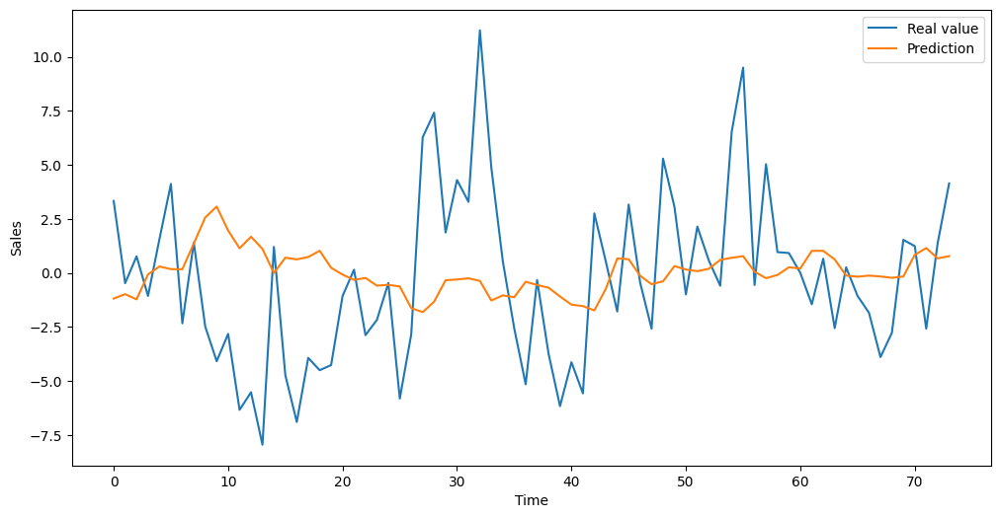



MSE: 17.1854




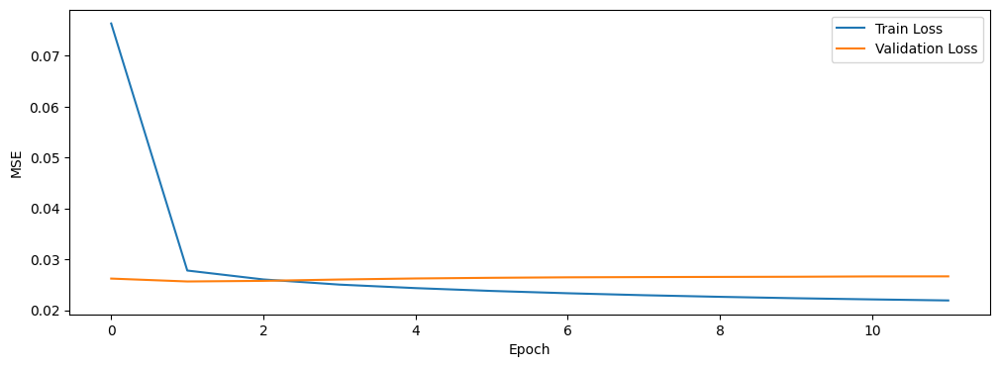

In [ ]:
import numpy as np
import tensorflow as tf
import random

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v2_softmax = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_2/Softmax.keras'

# Plot
plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Initial sales series')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Dataset split into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaler
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

scaler_X.fit(X_train_reshaped)
X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaler for y
scaler_y = MinMaxScaler(feature_range=(0, 1))
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Fit
scaler_y.fit(y_train_reshaped)
y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

fft_length = sequence_length // 2 + 1

# Model definition
input_sales = Input(shape=(sequence_length, 1))

# LSTM
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)

# FFT
x_freq = Lambda(fourier_transform_layer)(input_sales)

# Attention mechanism
attention_scores = Dense(fft_length, activation='relu')(x_freq)
attention_weights = Softmax()(attention_scores)

# Multiply attention weights with frequency
x_freq_attended = Multiply()([x_freq, attention_weights])
x_freq_dense = Dense(64, activation='relu')(x_freq_attended)

# Concatenate the two branches
x_combined = Concatenate()([x_time, x_freq_dense])

# Output
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Model compile
model.compile(optimizer='rmsprop', loss='mse')

# Model summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Training
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v2_softmax)

# Prediction
y_pred_scaled = model.predict(X_test_scaled)

# Invert the scaling
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Prediction plot
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Real value')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot della loss
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()


###No Softmax

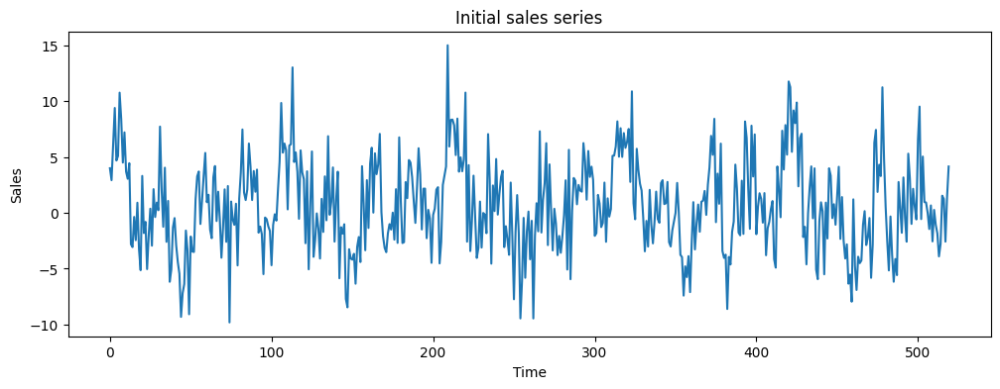

X shape: (490, 30)
y shape: (490,)


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_7 (Lambda)         │ (None, 16)             │              0 │ input_layer_8[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_30 (Dense)          │ (None, 16)             │            272 │ lambda_7[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_7 (Multiply)     │ (None, 16)             │              0 │ lambda_7[0][0],        │
│                           │                        │                │ dense_30[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_8 (LSTM)             │ (None, 128)            │         66,560 │ input_layer_8[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_31 (Dense)          │ (None, 64)             │          1,088 │ multiply_7[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_7             │ (None, 192)            │              0 │ lstm_8[0][0],          │
│ (Concatenate)             │                        │                │ dense_31[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_32 (Dense)          │ (None, 64)             │         12,352 │ concatenate_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_33 (Dense)          │ (None, 1)              │             65 │ dense_32[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 80,337 (313.82 KB)

 Trainable params: 80,337 (313.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 2.1405 - val_loss: 0.0456
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.0387 - val_loss: 0.0482
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.0399 - val_loss: 0.1193
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.2540 - val_loss: 0.2626
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1380 - val_loss: 0.1111
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1101 - val_loss: 0.4378
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.2618 - val_loss: 0.1283
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0862 - val_loss: 0.2532
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1989 - val_loss: 0.1663
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0966 - val_loss: 0.1597
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1287 - val_loss: 0.2026
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step


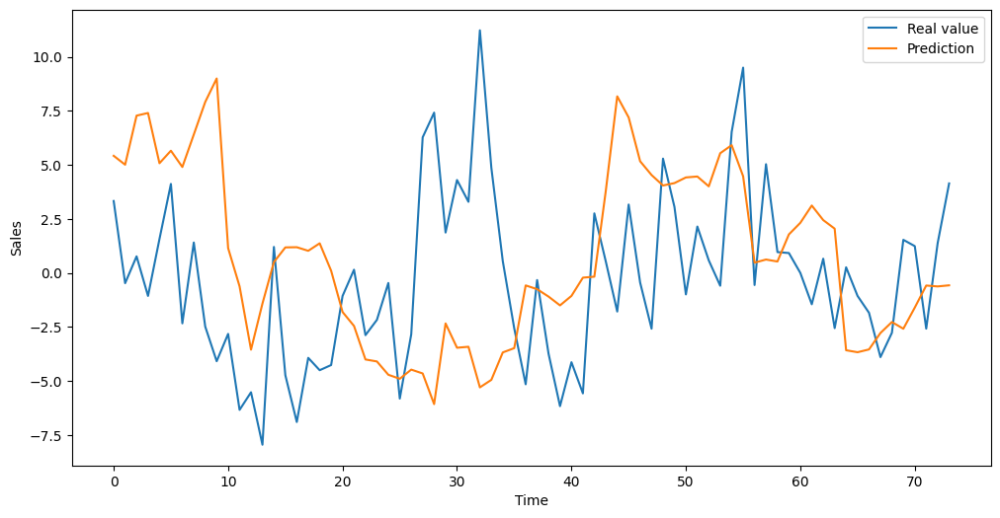



MSE: 29.8833




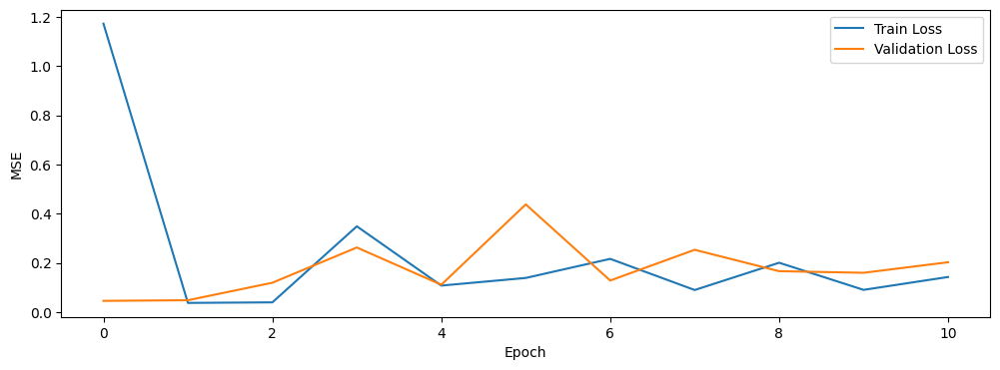

In [ ]:
import numpy as np
import tensorflow as tf
import random

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v2_no_softmax = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_2/No_Softmax.keras'

# Plot
plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Initial sales series')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Dataset split into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaler
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

scaler_X.fit(X_train_reshaped)
X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaler for y
scaler_y = MinMaxScaler(feature_range=(0, 1))
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Fit
scaler_y.fit(y_train_reshaped)
y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

fft_length = sequence_length // 2 + 1

# Model definition
input_sales = Input(shape=(sequence_length, 1))

# LSTM
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)

# FFT
x_freq = Lambda(fourier_transform_layer)(input_sales)

# Attention mechanism
attention_scores = Dense(fft_length, activation='relu')(x_freq)
attention_weights = Softmax()(attention_scores)

# Multiply attention weights with frequency
x_freq_attended = Multiply()([x_freq, attention_scores])
x_freq_dense = Dense(64, activation='relu')(x_freq_attended)

# Concatenate the two branches
x_combined = Concatenate()([x_time, x_freq_dense])

# Output
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Model compile
model.compile(optimizer='rmsprop', loss='mse')

# Model summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Training
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v2_no_softmax)

# Prediction
y_pred_scaled = model.predict(X_test_scaled)

# Invert the scaling
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Prediction plot
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Real value')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model valuation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot della loss
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()


###LeakyReLu

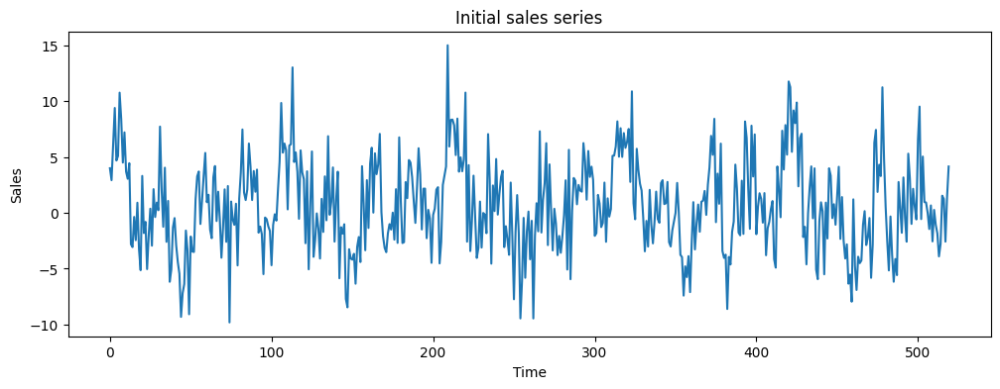

X shape: (490, 30)
y shape: (490,)


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9             │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_8 (Lambda)         │ (None, 16)             │              0 │ input_layer_9[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_34 (Dense)          │ (None, 16)             │            272 │ lambda_8[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ softmax_6 (Softmax)       │ (None, 16)             │              0 │ dense_34[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_8 (Multiply)     │ (None, 16)             │              0 │ lambda_8[0][0],        │
│                           │                        │                │ softmax_6[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_9 (LSTM)             │ (None, 128)            │         66,560 │ input_layer_9[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_35 (Dense)          │ (None, 64)             │          1,088 │ multiply_8[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_8             │ (None, 192)            │              0 │ lstm_9[0][0],          │
│ (Concatenate)             │                        │                │ dense_35[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_36 (Dense)          │ (None, 64)             │         12,352 │ concatenate_8[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_37 (Dense)          │ (None, 1)              │             65 │ dense_36[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 80,337 (313.82 KB)

 Trainable params: 80,337 (313.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1097 - val_loss: 0.0262
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0285 - val_loss: 0.0257
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0264 - val_loss: 0.0258
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0252 - val_loss: 0.0260
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0245 - val_loss: 0.0262
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0239 - val_loss: 0.0264
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.0234 - val_loss: 0.0265
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0230 - val_loss: 0.0265
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.0227 - val_loss: 0.0265
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0224 - val_loss: 0.0266
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0221 - val_loss: 0.0266
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0219 - v

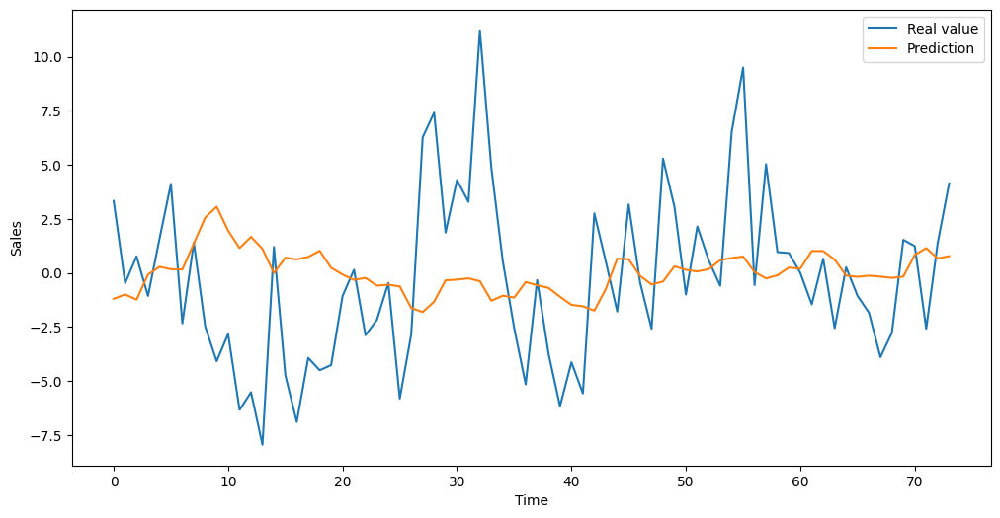



MSE: 17.1930




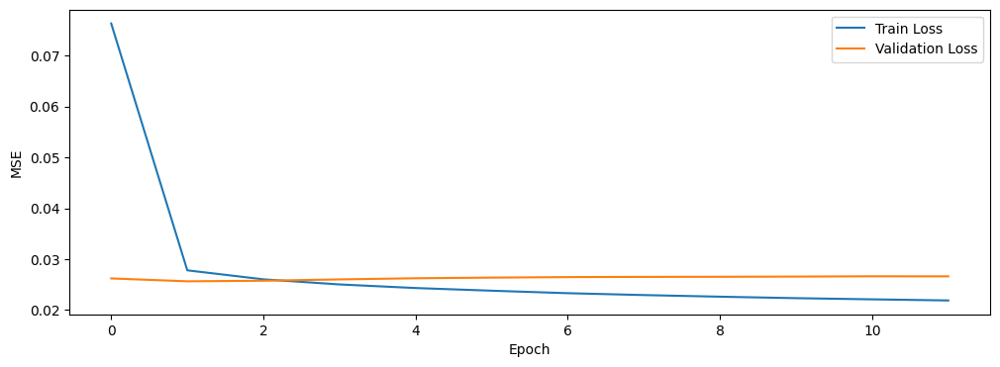

In [ ]:
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import LeakyReLU

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v2_leakyRelu = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_2/LeakyRelu.keras'

# Plot
plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Initial sales series')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Dataset split into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaler
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

scaler_X.fit(X_train_reshaped)
X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaler for y
scaler_y = MinMaxScaler(feature_range=(0, 1))
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Fit
scaler_y.fit(y_train_reshaped)
y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

fft_length = sequence_length // 2 + 1

# Model definition
input_sales = Input(shape=(sequence_length, 1))

# LSTM
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)

# FFT
x_freq = Lambda(fourier_transform_layer)(input_sales)
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_weights = Softmax()(attention_scores)

# Attention layer
x_freq_attended = Multiply()([x_freq, attention_weights])
x_freq_dense = Dense(64, activation='relu')(x_freq_attended)

# Concatenate the two branches
x_combined = Concatenate()([x_time, x_freq_dense])

# Output
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Model compile
model.compile(optimizer='rmsprop', loss='mse')

# Model summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Training
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v2_leakyRelu)

# Prediction
y_pred_scaled = model.predict(X_test_scaled)

# Invert the scaling
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Prediction plot
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Real value')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model valuation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Loss plot
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

####Confronting the three version




In [ ]:
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.models import load_model

baseline_lstm = tf.keras.models.load_model(path_base_lstm)
model_v2_softmax = load_model(path_v2_softmax, custom_objects={'fourier_transform_layer': fourier_transform_layer})
model_v2_no_softmax = load_model(path_v2_no_softmax, custom_objects={'fourier_transform_layer': fourier_transform_layer})
model_v2_leakyReLu = load_model(path_v2_leakyRelu, custom_objects={'LeakyReLU': LeakyReLU, 'fourier_transform_layer': fourier_transform_layer})

models = [baseline_lstm,model_v2_softmax, model_v2_no_softmax, model_v2_leakyReLu]

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

# Divide the dataset
_, _, _, _, X_test, y_test = divide_dataset_validation(X, y)

# Scale the test data
scaler_X = MinMaxScaler(feature_range=(0, 1))
X_test_scaled = scaler_X.fit_transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)

scaler_y = MinMaxScaler(feature_range=(0, 1))
y_test_scaled = scaler_y.fit_transform(y_test.reshape(-1, 1)).flatten()

# Prediction and MSE Calculation
y_pred_scaled = []
y_pred = []
mse_errors = []

for i, model in enumerate(models):
    pred_scaled = model.predict(X_test_scaled[..., np.newaxis])
    pred = scaler_y.inverse_transform(pred_scaled)

    # Append predictions
    y_pred_scaled.append(pred_scaled)
    y_pred.append(pred)

    # Calculate and print MSE
    mse = mean_squared_error(y_test, pred.flatten())
    mse_errors.append(mse)

# Transform mse_errors into a dataframe in which the row are named version and the index and the column is mse
mse_df = pd.DataFrame(mse_errors, index=['LSTM Baseline','Softmax', 'No Softmax', 'Leaky Relu'], columns=['MSE'])
print(mse_df)

# Plot using the dropdown feature
plot_px_dropdown(series=[y_test] + y_pred,
                 labels=['Actual values'] + list(mse_df.index),
                 title='Model Predictions vs Actual Values')

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step
                     MSE
LSTM Baseline  11.458592
Softmax        16.937117
No Softmax     54.045825
Leaky Relu     16.941830


## Version 3
**Differences from *Version 2***

* **Trainable Weights in FFT Attention**: By adjusting the attention mechanism, we ensure that the weights are trainable and effectively learn to focus on important frequency components.
* **Removing Attention from Temporal Batch**: By correctly specifying axes and reshaping tensors, we remove any unintended attention over temporal or batch dimensions.

---
---

**Key Differences Between Model 2 and Model 3**

1. **Attention Mechanism on Frequency Components:**
   - **Model 2:** Applies attention to the frequency components using a **Dense(fft_length, activation='relu')** layer followed by a **Softmax** to normalize the weights.
   - **Model 3:** Optimizes the attention approach. Instead of using `Dense(fft_length)`, it calculates the **attention scores** with a dense layer with a single node (`Dense(1, activation='relu')`) and then flattens the result (`Flatten()`) to apply **Softmax** over the entire frequency dimension. This approach allows for finer control over attention to relevant frequencies, improving selectivity.

2. **Flattening Frequency Features:**
   - **Model 2:** Does not flatten the frequency features after applying attention weights.
   - **Model 3:** After applying attention weights to the frequency components, the resulting frequency features are flattened using **Flatten()**. This step allows for better concatenation with the temporal results from the LSTM, facilitating the integration of frequency data into the model.

3. **Dense Layer Structure:**
   - **Model 2:** Uses a dense layer with 64 units after the attention mechanism, then combines the time and frequency results.
   - **Model 3:** Follows the same approach but adds flattening after attention. This change could enhance the processing of frequency data.

4. **Activation in the Attention Mechanism:**
   - **Model 2:** Uses `relu` to compute the attention scores.
   - **Model 3:** Retains `relu` for score calculation but leverages the single output of the dense layer to generate the attention scores, leading to a more compact architecture.

5. **Reduction in Attention Weight Complexity:**
   - **Model 3:** Using a dense layer with a single node for attention reduces the weight complexity compared to computing scores across all frequency components, making the attention more focused.

### Similarities Between Model 2 and Model 3:
- **General Architecture:** Both models follow a similar structure, combining an LSTM branch for temporal analysis with a frequency branch using FFT.
- **Data Scaling:** Both normalize input and target data before training and reverse the scaling for predicted results.
- **Optimization and Loss:** Both use **RMSprop** as the optimizer and **MSE** as the loss function.
- **Early Stopping Mechanism:** Both apply early stopping with a patience of 10 epochs.

### Expected Improvements:
- **Enhanced Attention Mechanism:** The improved attention on frequency components in **Model 3** should provide a more precise selection of relevant frequencies, increasing prediction accuracy.
- **Complexity Reduction:** The more compact approach using `Dense(1)` for attention scores reduces complexity, potentially making the model more computationally efficient and lowering the risk of overfitting.


###Softmax

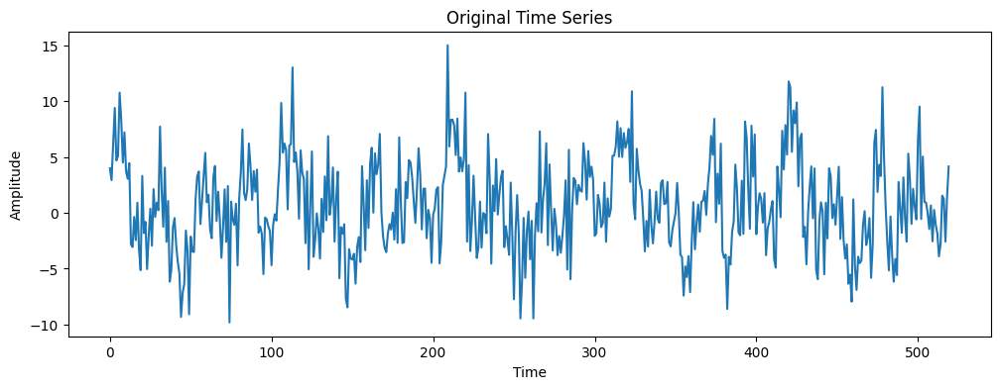

X shape: (490, 30)
y shape: (490,)


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10            │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_9 (Lambda)         │ (None, 16)             │              0 │ input_layer_10[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_38 (Dense)          │ (None, 1)              │             17 │ lambda_9[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 1)              │              0 │ dense_38[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ softmax_7 (Softmax)       │ (None, 1)              │              0 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_9 (Multiply)     │ (None, 16)             │              0 │ lambda_9[0][0],        │
│                           │                        │                │ softmax_7[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 16)             │              0 │ multiply_9[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_10 (LSTM)            │ (None, 128)            │         66,560 │ input_layer_10[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_39 (Dense)          │ (None, 64)             │          1,088 │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_9             │ (None, 192)            │              0 │ lstm_10[0][0],         │
│ (Concatenate)             │                        │                │ dense_39[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_40 (Dense)          │ (None, 64)             │         12,352 │ concatenate_9[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_41 (Dense)          │ (None, 1)              │             65 │ dense_40[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 80,082 (312.82 KB)

 Trainable params: 80,082 (312.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning:

You are using a softmax over axis 1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 209ms/step - loss: 0.2076 - val_loss: 0.0509
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0391 - val_loss: 0.0603
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0427 - val_loss: 0.1155
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0677 - val_loss: 0.0723
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0427 - val_loss: 0.0726
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0445 - val_loss: 0.0750
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0435 - val_loss: 0.0729
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0424 - val_loss: 0.0724
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0406 - val_loss: 0.0691
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0387 - val_loss: 0.0681
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0377 - val_loss: 0.0648


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning:

You are using a softmax over axis 1 of a tensor of shape (32, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step


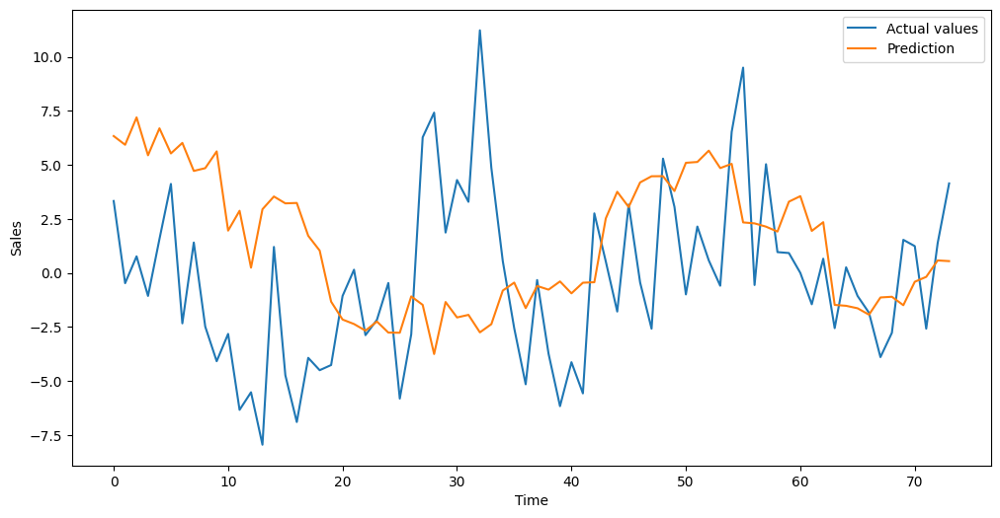



MSE: 25.6203




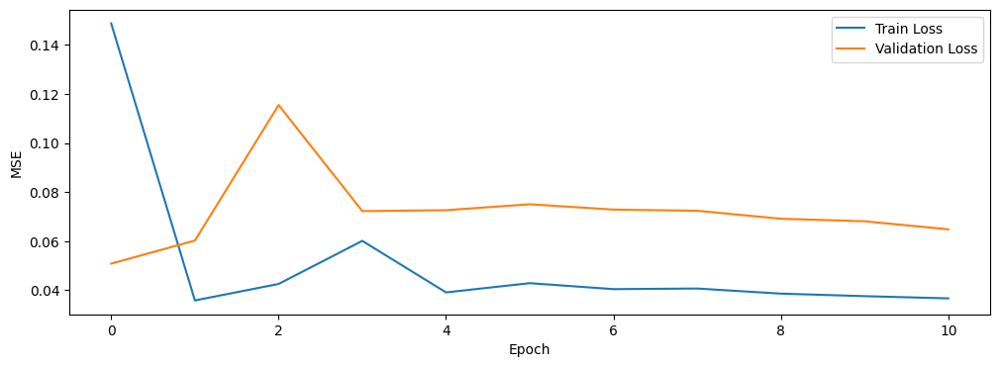

In [ ]:
import numpy as np
import tensorflow as tf
import random

from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape
# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v3_softmax = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_3/Softmax.keras'

# Plot the input signal
plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Original Time Series')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Divide into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaling the input data (X)
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape for the scaling
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

# Fit
scaler_X.fit(X_train_reshaped)

X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaling of the target
scaler_y = MinMaxScaler(feature_range=(0, 1))

# Target reshape
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Scaler fit
scaler_y.fit(y_train_reshaped)

y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

# FFT length calculation
fft_length = sequence_length // 2 + 1

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)

# Frequency domain branch (FFT)
x_freq = Lambda(fourier_transform_layer)(input_sales)  # FFT

# Attention mechanism over frequency components
attention_scores = Dense(1, activation='relu')(x_freq)  # Shape: (batch_size, fft_length, 1)
attention_scores = Flatten()(attention_scores)          # Shape: (batch_size, fft_length)
attention_weights = Softmax(axis=1)(attention_scores)   # Apply Softmax over frequency dimension

# Apply attention weights
x_freq_attended = Multiply()([x_freq, attention_weights])

# Flatten frequency features
x_freq_flat = Flatten()(x_freq_attended)

# Dense layer after attention
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)

# Combine time and frequency features
x_combined = Concatenate()([x_time, x_freq_dense])

# Output layers
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Model summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model, including validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v3_softmax)

# Prediction on the test set
y_pred_scaled = model.predict(X_test_scaled)

# Reverse scaling to get original values for prediction and test data
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Plot the predictions vs actual values
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Actual values')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation (MSE)
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot training and validation loss over epochs
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()


###No Softmax

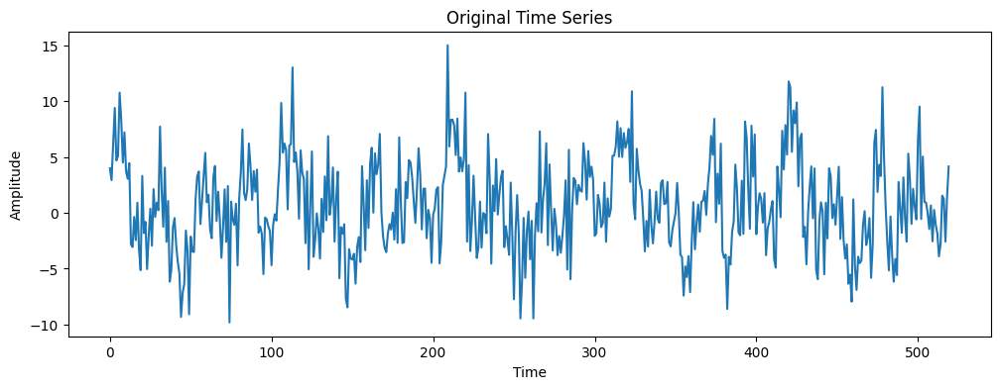

X shape: (490, 30)
y shape: (490,)


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11            │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_10 (Lambda)        │ (None, 16)             │              0 │ input_layer_11[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_42 (Dense)          │ (None, 1)              │             17 │ lambda_10[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_2 (Flatten)       │ (None, 1)              │              0 │ dense_42[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_10 (Multiply)    │ (None, 16)             │              0 │ lambda_10[0][0],       │
│                           │                        │                │ flatten_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_3 (Flatten)       │ (None, 16)             │              0 │ multiply_10[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_11 (LSTM)            │ (None, 128)            │         66,560 │ input_layer_11[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_43 (Dense)          │ (None, 64)             │          1,088 │ flatten_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_10            │ (None, 192)            │              0 │ lstm_11[0][0],         │
│ (Concatenate)             │                        │                │ dense_43[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_44 (Dense)          │ (None, 64)             │         12,352 │ concatenate_10[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_45 (Dense)          │ (None, 1)              │             65 │ dense_44[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 80,082 (312.82 KB)

 Trainable params: 80,082 (312.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 134ms/step - loss: 9.2781 - val_loss: 0.5115
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2506 - val_loss: 0.4743
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.2237 - val_loss: 0.4447
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.5152 - val_loss: 2.8038
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 1.2458 - val_loss: 0.4642
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2240 - val_loss: 1.0602
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 1.0725 - val_loss: 0.9031
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.3959 - val_loss: 0.6289
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.4819 - val_loss: 1.5110
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.7286 - val_loss: 0.5629
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.3117 - val_loss: 1.2854
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.7337 - v

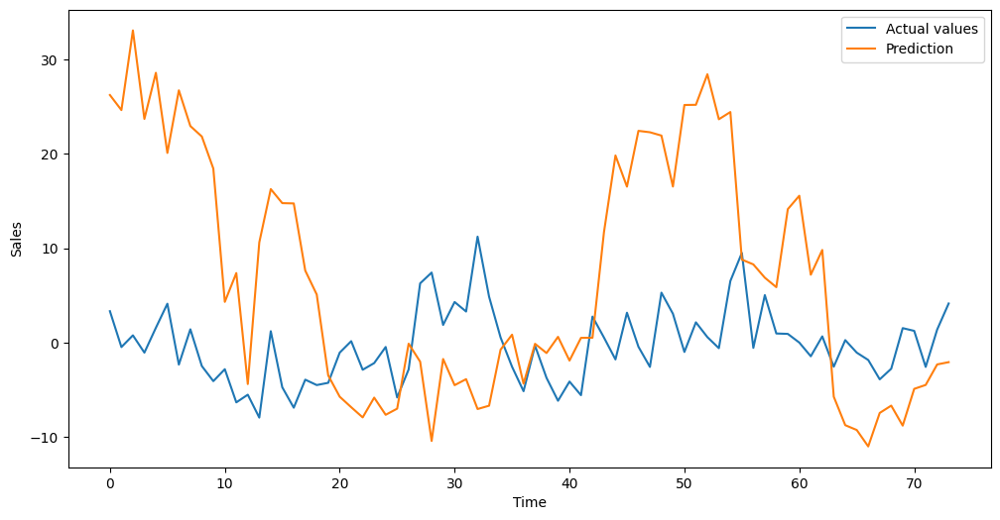



MSE: 213.5697




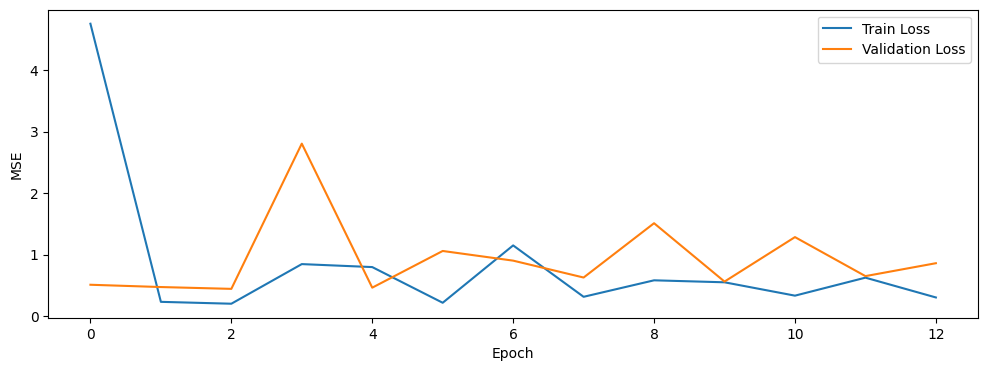

In [ ]:
import numpy as np
import tensorflow as tf
import random

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()


# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape

path_v3_no_softmax = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_3/No_Softmax.keras'

# Plot the initial signal
plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Original Time Series')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Train, validation e test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaling the input data (X)
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape for the scaling
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

# Fit
scaler_X.fit(X_train_reshaped)

X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaling of the target
scaler_y = MinMaxScaler(feature_range=(0, 1))

# Target reshape
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Scaler fit
scaler_y.fit(y_train_reshaped)

y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

# FFT length calculation
fft_length = sequence_length // 2 + 1

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)

# Frequency domain branch (FFT)
x_freq = Lambda(fourier_transform_layer)(input_sales)  # FFT

# Attention mechanism over frequency components
attention_scores = Dense(1, activation='relu')(x_freq)  # Shape: (batch_size, fft_length, 1)
attention_scores = Flatten()(attention_scores)          # Shape: (batch_size, fft_length)

# Apply attention weights
x_freq_attended = Multiply()([x_freq, attention_scores])

# Flatten frequency features
x_freq_flat = Flatten()(x_freq_attended)

# Dense layer after attention
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)

# Combine time and frequency features
x_combined = Concatenate()([x_time, x_freq_dense])

# Output layers
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Model summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model, including validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v3_no_softmax)

# Prediction on the test set
y_pred_scaled = model.predict(X_test_scaled)

# Reverse scaling to get original values for prediction and test data
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Plot the predictions vs actual values
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Actual values')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation (MSE)
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot training and validation loss over epochs
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()


###Leaky relu

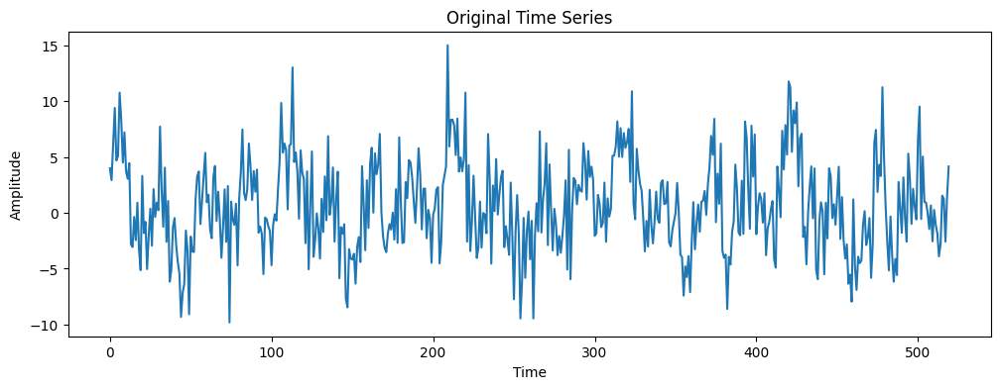

X shape: (490, 30)
y shape: (490,)


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12            │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_11 (Lambda)        │ (None, 16)             │              0 │ input_layer_12[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_46 (Dense)          │ (None, 16)             │            272 │ lambda_11[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_4 (Flatten)       │ (None, 16)             │              0 │ dense_46[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_11 (Multiply)    │ (None, 16)             │              0 │ lambda_11[0][0],       │
│                           │                        │                │ flatten_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_5 (Flatten)       │ (None, 16)             │              0 │ multiply_11[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_12 (LSTM)            │ (None, 128)            │         66,560 │ input_layer_12[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_47 (Dense)          │ (None, 64)             │          1,088 │ flatten_5[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_11            │ (None, 192)            │              0 │ lstm_12[0][0],         │
│ (Concatenate)             │                        │                │ dense_47[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_48 (Dense)          │ (None, 64)             │         12,352 │ concatenate_11[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_49 (Dense)          │ (None, 1)              │             65 │ dense_48[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 80,337 (313.82 KB)

 Trainable params: 80,337 (313.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 2.1452 - val_loss: 0.0455
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0386 - val_loss: 0.0480
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0398 - val_loss: 0.1184
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.2525 - val_loss: 0.2648
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1400 - val_loss: 0.1106
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1117 - val_loss: 0.4293
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.2601 - val_loss: 0.1257
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0877 - val_loss: 0.2515
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.2006 - val_loss: 0.1599
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - val_loss: 0.1594
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 309ms/step - loss: 0.1331 - val_loss: 0.1926
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step


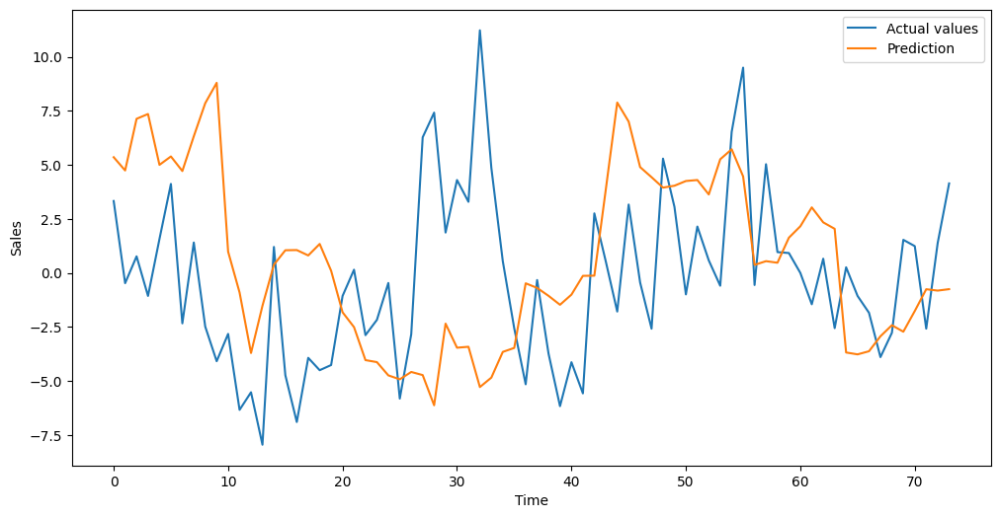



MSE: 29.3285




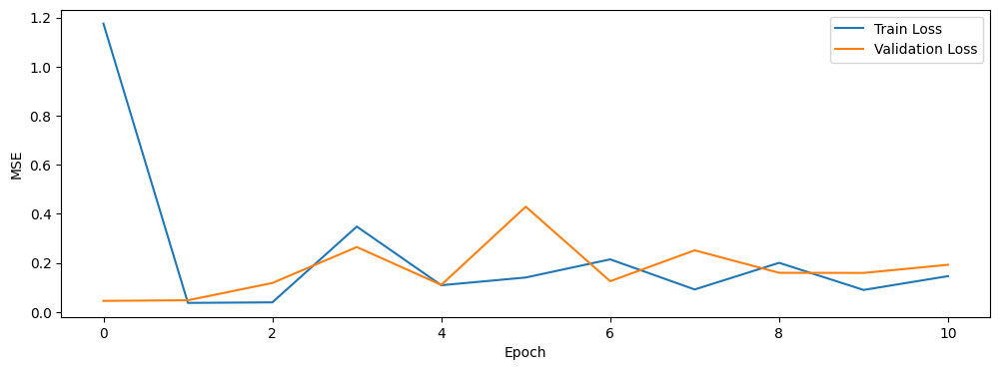

In [ ]:
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, LeakyReLU

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v3_leakyrelu = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_3/LeakyRelu.keras'

# Plot the initial signal
plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Original Time Series')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Divide into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaling the input data (X)
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape for the scaling
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

# Fit
scaler_X.fit(X_train_reshaped)

X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaling of the target
scaler_y = MinMaxScaler(feature_range=(0, 1))

# Target reshape
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Scaler fit
scaler_y.fit(y_train_reshaped)

y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

# FFT length calculation
fft_length = sequence_length // 2 + 1

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)

# Frequency domain branch (FFT)
x_freq = Lambda(fourier_transform_layer)(input_sales)  # FFT
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_scores = Flatten()(attention_scores)          # Shape: (batch_size, fft_length)
attention_weights = Softmax()(attention_scores)

# Attention mechanism over frequency components
# Apply attention weights
x_freq_attended = Multiply()([x_freq, attention_scores])

# Flatten frequency features
x_freq_flat = Flatten()(x_freq_attended)

# Dense layer after attention
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)

# Combine time and frequency features
x_combined = Concatenate()([x_time, x_freq_dense])

# Output layers
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Model summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model, including validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v3_leakyrelu)

# Prediction on the test set
y_pred_scaled = model.predict(X_test_scaled)

# Reverse scaling to get original values for prediction and test data
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Plot the predictions vs actual values
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Actual values')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation (MSE)
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot training and validation loss over epochs
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

####Confronting the three version

In [ ]:
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.models import load_model
import pandas as pd

baseline_lstm = tf.keras.models.load_model(path_base_lstm)
model_v3_softmax = load_model(path_v3_softmax, custom_objects={'fourier_transform_layer': fourier_transform_layer})
model_v3_no_softmax = load_model(path_v3_no_softmax, custom_objects={'fourier_transform_layer': fourier_transform_layer})
model_v3_leakyReLu = load_model(path_v3_leakyrelu, custom_objects={'LeakyReLU': LeakyReLU, 'fourier_transform_layer': fourier_transform_layer})

models = [baseline_lstm, model_v3_softmax, model_v3_no_softmax, model_v3_leakyReLu]

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

# Divide the dataset
_, _, _, _, X_test, y_test = divide_dataset_validation(X, y)

# Scale the test data
scaler_X = MinMaxScaler(feature_range=(0, 1))
X_test_scaled = scaler_X.fit_transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)

scaler_y = MinMaxScaler(feature_range=(0, 1))
y_test_scaled = scaler_y.fit_transform(y_test.reshape(-1, 1)).flatten()

# Prediction and MSE Calculation
y_pred_scaled = []
y_pred = []
mse_errors = []

for i, model in enumerate(models):
    pred_scaled = model.predict(X_test_scaled[..., np.newaxis])
    pred = scaler_y.inverse_transform(pred_scaled)

    # Append predictions
    y_pred_scaled.append(pred_scaled)
    y_pred.append(pred)

    # Calculate and print MSE
    mse = mean_squared_error(y_test, pred.flatten())
    mse_errors.append(mse)

# Transform mse_errors into a dataframe in which the row are named version and the index and the column is mse
mse_df = pd.DataFrame(mse_errors, index=['LSTM Baseline','Softmax', 'No Softmax', 'Leaky Relu'], columns=['MSE'])
print(mse_df)

# Plot using the dropdown feature
plot_px_dropdown(series=[y_test] + y_pred,
                 labels=['Actual values'] + list(mse_df.index),
                 title='Model Predictions vs Actual Values')

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning:

You are using a softmax over axis 1 of a tensor of shape (32, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning:

You are using a softmax over axis 1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 135ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 180ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 170ms/step
                      MSE
LSTM Baseline   11.458592
Softmax         29.334213
No Softmax     373.295309
Leaky Relu      51.933915


## Version 4

**Differences from Version 3**

* **Frequency Filtering in FFT Layer**: Introduced a frequency filtering mechanism in the Fourier Transform layer to focus on specific period ranges (periods between 10 and 100 units). This is achieved by computing the periods corresponding to FFT frequencies and selecting only those frequencies that fall within the desired range, effectively filtering out irrelevant frequency components.

* **Sigmoid Activation in Attention Mechanism**: Replaced the Softmax activation function with a Sigmoid activation in the attention mechanism over frequency components. This change allows the model to assign independent importance weights to each frequency component, rather than distributing a fixed amount of attention across all components as Softmax does.

* **Exclusion of Zero Frequency Component**: Excluded the zero frequency (DC component) from the FFT magnitude spectrum to avoid division by zero errors and to eliminate the influence of non-oscillatory components, ensuring the attention mechanism focuses solely on meaningful oscillatory frequencies.

* **Adjustments to Input Shapes**: Made necessary adjustments to the input data shapes by adding new axes when training and predicting (e.g., using X_train_scaled[..., np.newaxis]). This ensures compatibility with the modified layers and prevents unintended attention over batch or temporal dimensions.

---
---

**Key Differences Between Model 3 and Model 4**

1. **Range of Periods in the Fourier Transform:**
   - **Model 3:** Uses the Fourier Transform without explicitly selecting frequency components.
   - **Model 4:** Introduces a **range of periods** (minimum 10, maximum 100) and filters the frequency components that correspond to this period range. This allows the model to focus on the most relevant frequencies for long-term forecasting, improving its ability to ignore high-frequency noise or insignificant variations.

2. **Attention Mechanism with Sigmoid:**
   - **Model 3:** Uses **Softmax** to normalize attention weights, ensuring that the sum of weights is 1.
   - **Model 4:** Replaces **Softmax** with **Sigmoid** for calculating attention weights on the frequency components. **Sigmoid** allows for individual weights for each frequency without imposing a unit sum constraint, providing greater flexibility in assigning importance to various frequencies, especially when combined with frequency filtering.

3. **Frequency Filtering Application:**
   - **Model 4:** Utilizes a modified version of the Fourier Transform called `fourier_transform_layer_v4`, which integrates the period filter. This filter selects frequencies that fall within the desired period range, enhancing the model's ability to focus on relevant periodic patterns for forecasting.

4. **Model Architecture:**
   - **Model 3:** Uses a similar architecture for combining time and frequency components.
   - **Model 4:** Introduces a **Reshape** step to handle attention weights, ensuring that the shape of the expected frequencies is compatible with the attention weights. This step is important for the correct application of the attention mechanism.

5. **Attention Weights on Frequency Components:**
   - **Model 4:** Continues using `Dense(1)` to generate attention weights, but with **Sigmoid**, the approach is more flexible. Additionally, frequency filtering improves selectivity.

### Expected Improvements:
- **Frequency Filtering:** By focusing only on a specific range of relevant frequencies, the model reduces complexity and ignores noise or variations that are not useful for long-term forecasting.
- **Attention Weights with Sigmoid:** Replacing Softmax with Sigmoid allows the model to assign individual importance to each frequency without constraints, potentially improving performance when some frequencies are not correlated with others.

### Similarities Between Model 3 and Model 4:
- **Temporal Branch with LSTM:** Both models retain the same architecture for temporal analysis, using an LSTM with 128 units and `relu` activation.
- **Data Scaling:** Input and target data are normalized using **MinMaxScaler** before training, and predicted results are rescaled to the original scale using inverse scaling.
- **Overall Architecture:** Both models combine temporal and frequency features and use dense layers for the final output.

### Conclusions:
- **Model 4** introduces frequency component filters and a new attention mechanism based on Sigmoid, enhancing control over relevant frequencies and allowing the model to ignore noise and irrelevant frequencies. These changes are expected to improve the model's generalization ability and reduce forecast error.

###Sigmoid

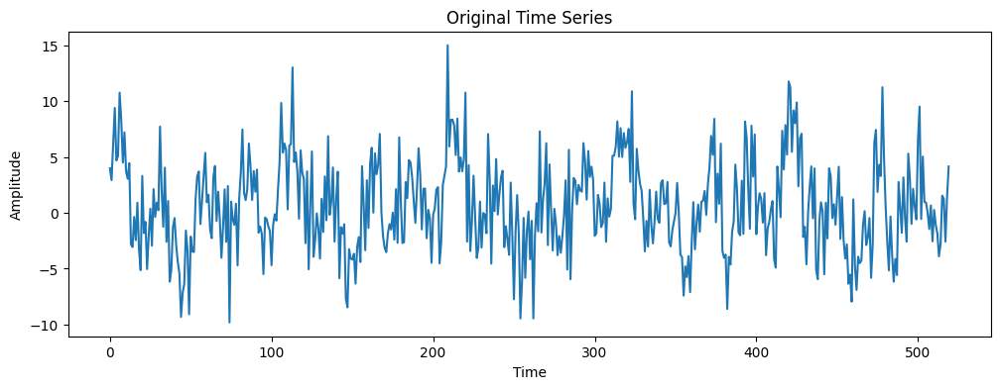

X shape: (490, 30)
y shape: (490,)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_2 (Lambda)         │ (None, 3)              │              0 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 1)              │              4 │ lambda_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 1)              │              0 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 1)              │              0 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape (Reshape)         │ (None, 1, 1)           │              0 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply (Multiply)       │ (None, 1, 3)           │              0 │ lambda_2[0][0],        │
│                           │                        │                │ reshape[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 3)              │              0 │ multiply[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_2 (LSTM)             │ (None, 128)            │         66,560 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 64)             │            256 │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 192)            │              0 │ lstm_2[0][0],          │
│                           │                        │                │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 64)             │         12,352 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 1)              │             65 │ dense_2[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 79,237 (309.52 KB)

 Trainable params: 79,237 (309.52 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 187ms/step - loss: 0.0828 - val_loss: 0.0491
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0306 - val_loss: 0.0459
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0287 - val_loss: 0.0433
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.0273 - val_loss: 0.0410
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0263 - val_loss: 0.0394
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.0257 - val_loss: 0.0380
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - loss: 0.0252 - val_loss: 0.0368
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0247 - val_loss: 0.0356
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 0.0243 - val_loss: 0.0348
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0240 - val_loss: 0.0340
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.0237 - val_loss: 0.0333
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.023

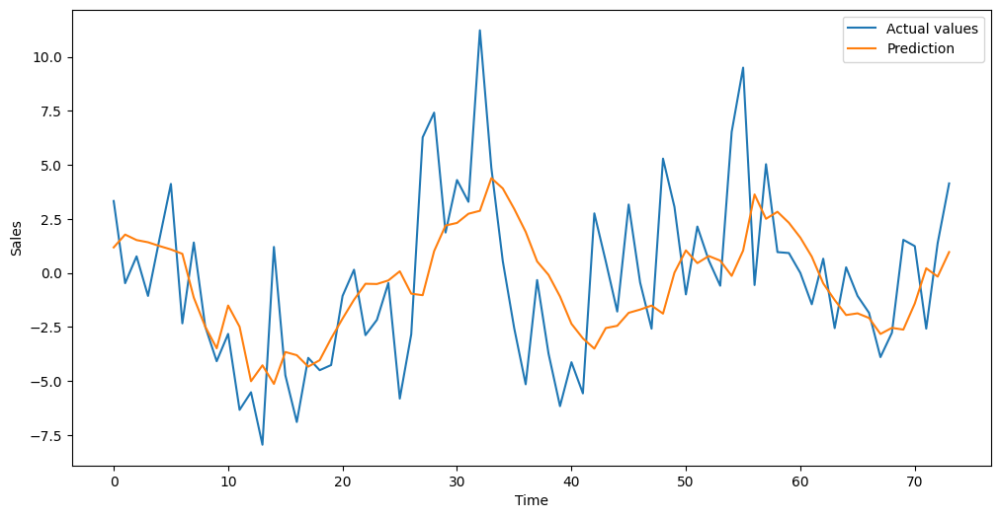



MSE: 11.3429




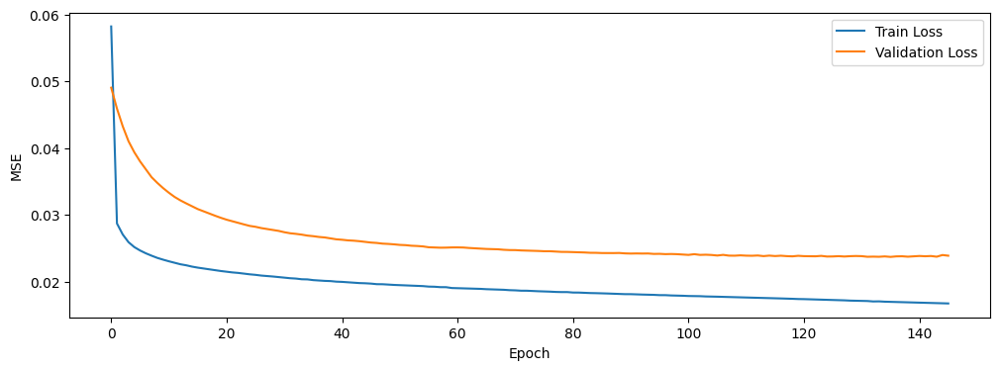

In [ ]:
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, Activation

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v4_sigmoid = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_4/Sigmoid.keras'

# Plot the initial signal
plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Original Time Series')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Divide into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaling the input data (X)
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape in order to scale
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

# Scaler fit
scaler_X.fit(X_train_reshaped)

X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaling of the target (y)
scaler_y = MinMaxScaler(feature_range=(0, 1))

# Target reshape
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Scaler fit on training, validation and test targets
scaler_y.fit(y_train_reshaped)

y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

fft_length = sequence_length // 2 + 1

# Define period range
period_min = 10  # Minimum period
period_max = 100  # Maximum period

# Compute frequencies corresponding to FFT bins
sampling_rate = 1  # Assuming unit sampling rate
freqs = np.fft.rfftfreq(sequence_length, d=1./sampling_rate)
periods = 1 / freqs[1:]  # Exclude the zero frequency to avoid division by zero

# Indices of frequencies within desired period range
valid_indices = np.where((periods >= period_min) & (periods <= period_max))[0]

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)

# Frequency domain branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)  # FFT with filtering

# Attention mechanism over frequency components
attention_scores = Dense(1, activation='sigmoid')(x_freq)  # Shape: (batch_size, num_valid_freqs, 1)
attention_scores = Flatten()(attention_scores)          # Shape: (batch_size, num_valid_freqs)
attention_weights = Activation('sigmoid')(attention_scores)   # Apply Sigmoid over frequency dimension
attention_weights = Reshape((-1, 1))(attention_weights)  # Shape: (batch_size, num_valid_freqs, 1)

# Apply attention weights
x_freq_attended = Multiply()([x_freq, attention_weights])  # Element-wise multiplication

# Flatten frequency features
x_freq_flat = Flatten()(x_freq_attended)

# Dense layer after attention
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)

# Combine time and frequency features
x_combined = Concatenate()([x_time, x_freq_dense])

# Output layers
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model with validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v4_sigmoid)

# Prediction
y_pred_scaled = model.predict(X_test_scaled[..., np.newaxis])

# Reverse scaling
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Plotting the predictions
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Actual values')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot training history
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()


### No Sigmoid

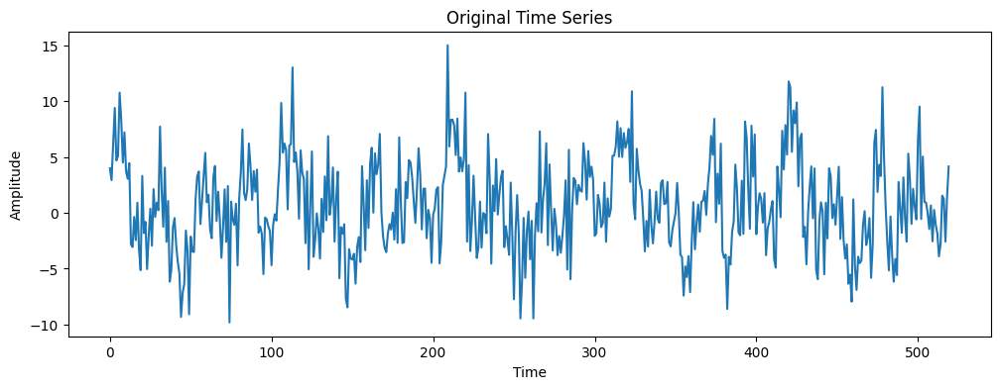

X shape: (490, 30)
y shape: (490,)


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14            │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_13 (Lambda)        │ (None, 3)              │              0 │ input_layer_14[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_54 (Dense)          │ (None, 1)              │              4 │ lambda_13[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_8 (Flatten)       │ (None, 1)              │              0 │ dense_54[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_13 (Multiply)    │ (None, 3)              │              0 │ lambda_13[0][0],       │
│                           │                        │                │ flatten_8[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_9 (Flatten)       │ (None, 3)              │              0 │ multiply_13[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_14 (LSTM)            │ (None, 128)            │         66,560 │ input_layer_14[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_55 (Dense)          │ (None, 64)             │            256 │ flatten_9[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_13            │ (None, 192)            │              0 │ lstm_14[0][0],         │
│ (Concatenate)             │                        │                │ dense_55[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_56 (Dense)          │ (None, 64)             │         12,352 │ concatenate_13[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_57 (Dense)          │ (None, 1)              │             65 │ dense_56[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 79,237 (309.52 KB)

 Trainable params: 79,237 (309.52 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0733 - val_loss: 0.0818
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - val_loss: 0.0589
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0355 - val_loss: 0.0441
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0314 - val_loss: 0.0388
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.0287 - val_loss: 0.0358
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0271 - val_loss: 0.0338
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0262 - val_loss: 0.0326
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0257 - val_loss: 0.0318
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0251 - val_loss: 0.0313
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0248 - val_loss: 0.0308
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0244 - val_loss: 0.0304
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0241 - v

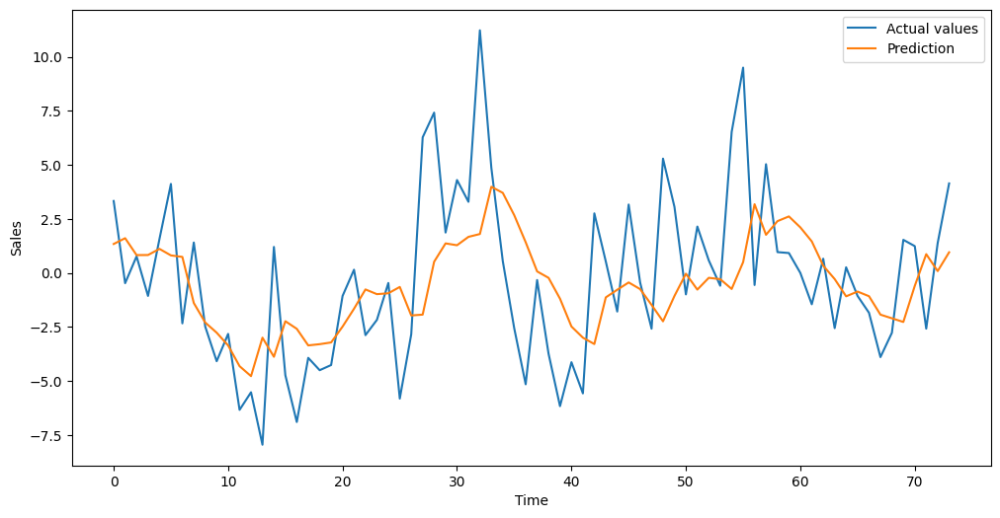



MSE: 11.8454




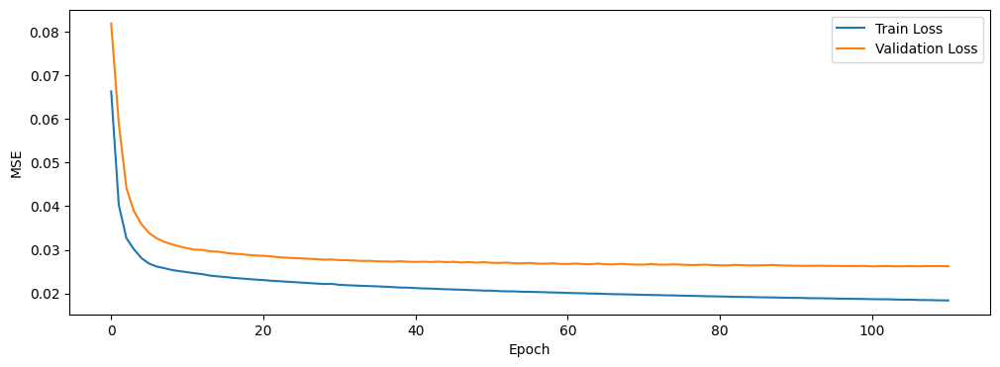

In [ ]:
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, Activation

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v4_no_sigmoid = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_4/No_Sigmoid.keras'

# Plot the initial signal
plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Original Time Series')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Divide into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaling the input data (X)
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape in order to scale
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

# Scaler fit
scaler_X.fit(X_train_reshaped)

X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaling of the target (y)
scaler_y = MinMaxScaler(feature_range=(0, 1))

# Target reshape
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Scaler fit on training, validation and test targets
scaler_y.fit(y_train_reshaped)

y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

# Scaler fit on training, validation and test targets
fft_length = sequence_length // 2 + 1

# Define period range
period_min = 10  # Minimum period
period_max = 100  # Maximum period

# Compute frequencies corresponding to FFT bins
sampling_rate = 1  # Assuming unit sampling rate
freqs = np.fft.rfftfreq(sequence_length, d=1./sampling_rate)
periods = 1 / freqs[1:]  # Exclude the zero frequency to avoid division by zero

# Indices of frequencies within desired period range
valid_indices = np.where((periods >= period_min) & (periods <= period_max))[0]

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)

# Frequency domain branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)  # FFT with filtering

# Attention mechanism over frequency components
attention_scores = Dense(1, activation='relu')(x_freq)  # Shape: (batch_size, num_valid_freqs, 1)
attention_scores = Flatten()(attention_scores)          # Shape: (batch_size, num_valid_freqs)

# Apply attention weights
x_freq_attended = Multiply()([x_freq, attention_scores])  # Element-wise multiplication

# Flatten frequency features
x_freq_flat = Flatten()(x_freq_attended)

# Dense layer after attention
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)

# Combine time and frequency features
x_combined = Concatenate()([x_time, x_freq_dense])

# Output layers
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model with validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v4_no_sigmoid)

# Prediction
y_pred_scaled = model.predict(X_test_scaled[..., np.newaxis])

# Reverse scaling
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Plotting the predictions
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Actual values')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot training history
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()


###Leaky relu

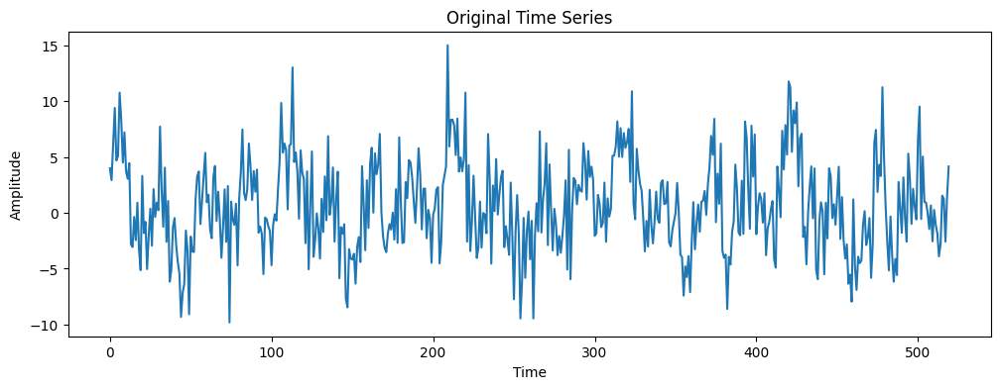

X shape: (490, 30)
y shape: (490,)


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_15            │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_14 (Lambda)        │ (None, 3)              │              0 │ input_layer_15[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_58 (Dense)          │ (None, 1)              │              4 │ lambda_14[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_10 (Flatten)      │ (None, 1)              │              0 │ dense_58[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_4 (LeakyReLU) │ (None, 1)              │              0 │ flatten_10[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_1 (Reshape)       │ (None, 1, 1)           │              0 │ leaky_re_lu_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_14 (Multiply)    │ (None, 1, 3)           │              0 │ lambda_14[0][0],       │
│                           │                        │                │ reshape_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_11 (Flatten)      │ (None, 3)              │              0 │ multiply_14[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_15 (LSTM)            │ (None, 128)            │         66,560 │ input_layer_15[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_59 (Dense)          │ (None, 64)             │            256 │ flatten_11[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_14            │ (None, 192)            │              0 │ lstm_15[0][0],         │
│ (Concatenate)             │                        │                │ dense_59[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_60 (Dense)          │ (None, 64)             │         12,352 │ concatenate_14[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_61 (Dense)          │ (None, 1)              │             65 │ dense_60[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 79,237 (309.52 KB)

 Trainable params: 79,237 (309.52 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 142ms/step - loss: 0.0750 - val_loss: 0.0556
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0335 - val_loss: 0.0507
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0303 - val_loss: 0.0461
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.0282 - val_loss: 0.0427
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.0269 - val_loss: 0.0403
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - loss: 0.0259 - val_loss: 0.0382
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0252 - val_loss: 0.0368
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0247 - val_loss: 0.0356
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.0243 - val_loss: 0.0347
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.0239 - val_loss: 0.0338
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0236 - val_loss: 0.0330
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.023

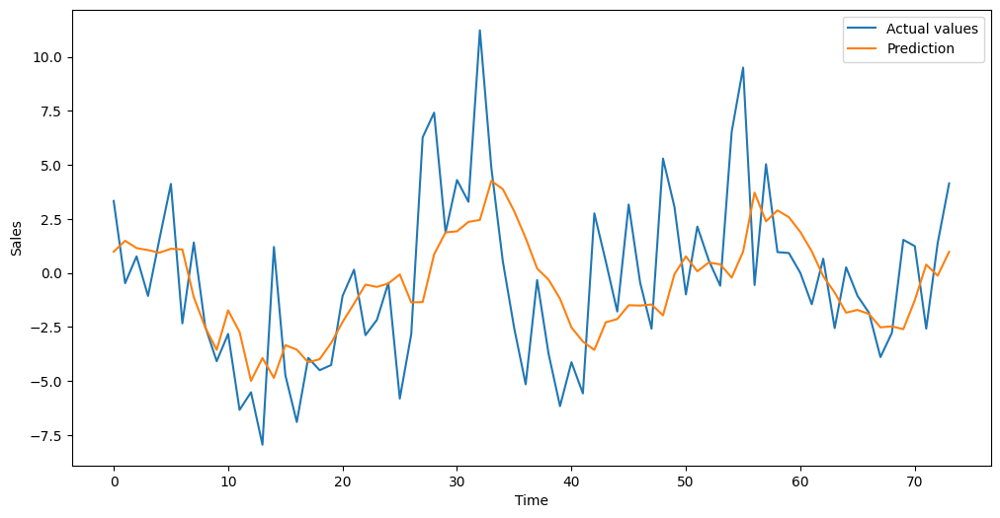



MSE: 11.4045




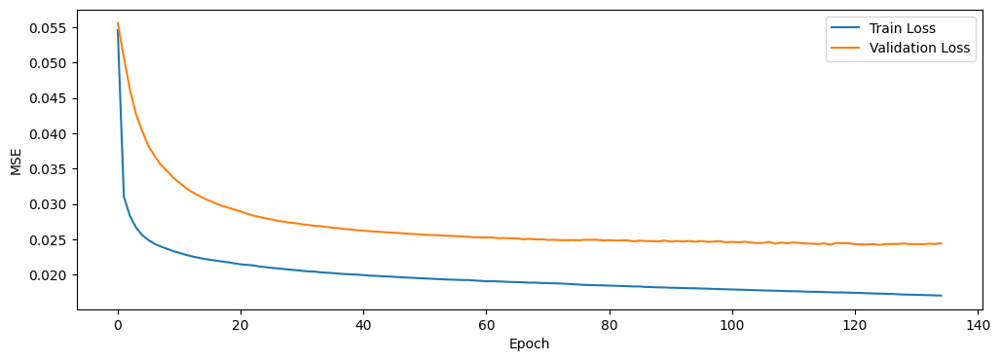

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, Activation

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()


# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v4_leakyrelu = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_4/LeakyRelu.keras'

# Plot the initial signal
plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Original Time Series')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Divide into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaling the input data (X)
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape in order to scale
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

# Scaler fit
scaler_X.fit(X_train_reshaped)

X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaling of the target (y)
scaler_y = MinMaxScaler(feature_range=(0, 1))

# Target reshape
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Scaler fit on training, validation and test targets
scaler_y.fit(y_train_reshaped)

y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

# Scaler fit on training, validation and test targets
fft_length = sequence_length // 2 + 1

# Define period range
period_min = 10  # Minimum period
period_max = 100  # Maximum period

# Compute frequencies corresponding to FFT bins
sampling_rate = 1  # Assuming unit sampling rate
freqs = np.fft.rfftfreq(sequence_length, d=1./sampling_rate)
periods = 1 / freqs[1:]  # Exclude the zero frequency to avoid division by zero

# Indices of frequencies within desired period range
valid_indices = np.where((periods >= period_min) & (periods <= period_max))[0]

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)

# Frequency domain branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)  # FFT with filtering
# Attention mechanism over frequency components
# Attention mechanism over frequency components
attention_scores = Dense(1, activation='sigmoid')(x_freq)  # LeakyReLU per i punteggi di attenzione
attention_scores = Flatten()(attention_scores)
attention_weights = LeakyReLU(negative_slope=0.03)(attention_scores)  # Sostituzione di Activation('sigmoid') con LeakyReLU
attention_weights = Reshape((-1, 1))(attention_weights)  # Mantieni la Reshape se necessario per allineare i pesi

# Apply attention weights
x_freq_attended = Multiply()([x_freq, attention_weights])  # Element-wise multiplication

# Flatten frequency features
x_freq_flat = Flatten()(x_freq_attended)

# Dense layer after attention
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)

# Combine time and frequency features
x_combined = Concatenate()([x_time, x_freq_dense])

# Output layers
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model with validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v4_leakyrelu)

# Prediction
y_pred_scaled = model.predict(X_test_scaled[..., np.newaxis])

# Reverse scaling
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Plotting the predictions
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Actual values')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot training history
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()


####Confronting the three version

In [ ]:
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.models import load_model

baseline_lstm = tf.keras.models.load_model(path_base_lstm)
model_v4_sigmoid = load_model(path_v4_sigmoid, custom_objects={'fourier_transform_layer_v4': fourier_transform_layer_v4})
model_v4_no_sigmoid = load_model(path_v4_no_sigmoid, custom_objects={'fourier_transform_layer_v4': fourier_transform_layer_v4})
model_v4_leakyReLu = load_model(path_v4_leakyrelu, custom_objects={'LeakyReLU': LeakyReLU, 'fourier_transform_layer_v4': fourier_transform_layer_v4})

models = [baseline_lstm, model_v4_sigmoid, model_v4_no_sigmoid, model_v4_leakyReLu]

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

# Divide the dataset
_, _, _, _, X_test, y_test = divide_dataset_validation(X, y)

# Scale the test data
scaler_X = MinMaxScaler(feature_range=(0, 1))
X_test_scaled = scaler_X.fit_transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)

scaler_y = MinMaxScaler(feature_range=(0, 1))
y_test_scaled = scaler_y.fit_transform(y_test.reshape(-1, 1)).flatten()

# Prediction and MSE Calculation
y_pred_scaled = []
y_pred = []
mse_errors = []

for i, model in enumerate(models):
    pred_scaled = model.predict(X_test_scaled[..., np.newaxis])
    pred = scaler_y.inverse_transform(pred_scaled)

    # Append predictions
    y_pred_scaled.append(pred_scaled)
    y_pred.append(pred)

    # Calculate and print MSE
    mse = mean_squared_error(y_test, pred.flatten())
    mse_errors.append(mse)

# Transform mse_errors into a dataframe in which the row are named version and the index and the column is mse
mse_df = pd.DataFrame(mse_errors, index=['Baseline LSTM', 'Sigmoid', 'No Sigmoid', 'Leaky Relu'], columns=['MSE'])
print(mse_df)


# Plot using the dropdown feature
plot_px_dropdown(series=[y_test] + y_pred,
                 labels=['Actual values'] + list(mse_df.index),
                 title='Model Predictions vs Actual Values')

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step
                     MSE
Baseline LSTM  11.458592
Sigmoid        12.093086
No Sigmoid     13.134867
Leaky Relu     12.178943


## Version 5

Here is the analysis of **Model 5** compared to **Model 4**, with a focus on the new changes introduced.

### Key Differences Between Model 4 and Model 5:

1. **Introduction of Dropout:**
   - **Model 4:** Does not use dropout, which can expose the model to the risk of overfitting, especially with smaller datasets.
   - **Model 5:** Introduces **dropout (0.3)** at various points in the model, including the temporal and frequency branches, as well as in the final dense layers. Dropout is a regularization technique that randomly disables a percentage of nodes during training, forcing the model to generalize better and reducing overfitting.

2. **Dropout in Temporal and Frequency Branches:**
   - **Temporal Branch:** A **Dropout(0.3)** layer is added after the LSTM output to improve regularization of the temporal output.
   - **Frequency Branch:** After applying the attention weights and flattening the frequency components, a **Dropout(0.3)** layer is applied to reduce overfitting to specific frequency features.
   - **Final Dense Layer:** Another **Dropout(0.3)** is applied after the final dense layer that combines the temporal and frequency features.

3. **Purpose of Dropout:**
   - The **dropout** in this model is used to reduce overfitting, which may have been present in previous versions without regularization. The model trains more robustly, learning to generalize better rather than fitting too closely to the training data.

4. **Expected Performance:**
   - Adding dropout should help prevent a decline in performance when the model is tested on new data. **Overfitting** is a common problem in complex models such as those with LSTM and frequency components, and dropout is one of the main techniques to counteract it.

### Similarities Between Model 4 and Model 5:
- **Model Architecture:** Both models use the same basic structure with temporal (LSTM) and frequency (FFT) branches, combined through an attention mechanism on filtered frequency components.
- **Attention Mechanism:** They continue to use **Sigmoid activation** for attention weights on frequency components, allowing the assignment of importance to specific relevant frequencies.
- **Loss Function and Optimization:** Both use **RMSprop** as the optimizer and **MSE** as the loss function.
- **Early Stopping:** They maintain the **early stopping** mechanism to prevent overfitting during training, halting the training process if validation improvement stops.

### Expected Improvements:
- **Better Generalization:** **Model 5**, with the addition of dropout, should demonstrate greater robustness when applied to new data. While previous models may have achieved good performance on training and validation data, they may have suffered from overfitting. Dropout reduces this tendency, enabling the model to perform better on test data.
- **Reduced Risk of Overfitting:** Thanks to the regularization introduced by dropout, the model should be less prone to "memorizing" the training data and more inclined to correctly generalize on test or future data.

### Conclusion:
The **addition of dropout** in **Model 5** represents a significant improvement in terms of robustness and generalization capability, especially for preventing overfitting in a complex model that combines both temporal and frequency information through attention mechanisms. This should lead to a reduction in error when the model is tested on new data.

###Sigmoid

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_16            │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_15 (Lambda)        │ (None, 3)              │              0 │ input_layer_16[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_62 (Dense)          │ (None, 1)              │              4 │ lambda_15[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_12 (Flatten)      │ (None, 1)              │              0 │ dense_62[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 1)              │              0 │ flatten_12[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_2 (Reshape)       │ (None, 1, 1)           │              0 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_15 (Multiply)    │ (None, 1, 3)           │              0 │ lambda_15[0][0],       │
│                           │                        │                │ reshape_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_13 (Flatten)      │ (None, 3)              │              0 │ multiply_15[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 3)              │              0 │ flatten_13[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_16 (LSTM)            │ (None, 128)            │         66,560 │ input_layer_16[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_63 (Dense)          │ (None, 64)             │            256 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 128)            │              0 │ lstm_16[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 64)             │              0 │ dense_63[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_15            │ (None, 192)            │              0 │ dropout[0][0],         │
│ (Concatenate)             │                        │                │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_64 (Dense)          │ (None, 64)             │         12,352 │ concatenate_15[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 64)             │              0 │ dense_64[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_65 (Dense)          │ (None, 1)              │             65 │ dropout_3[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 79,237 (309.52 KB)

 Trainable params: 79,237 (309.52 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.1387 - val_loss: 0.0380
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0824 - val_loss: 0.0361
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0669 - val_loss: 0.0344
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.0588 - val_loss: 0.0345
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0480 - val_loss: 0.0474
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0501 - val_loss: 0.0526
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step - loss: 0.0415 - val_loss: 0.0440
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0413 - val_loss: 0.0367
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0389 - val_loss: 0.0373
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0389 - val_loss: 0.0387
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0389 - val_loss: 0.0360
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0352 - 

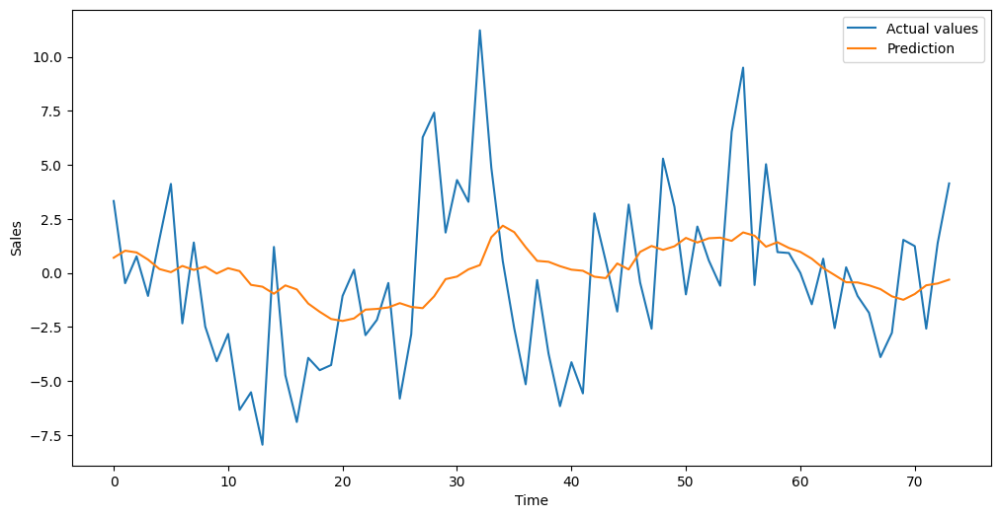



MSE: 13.7472




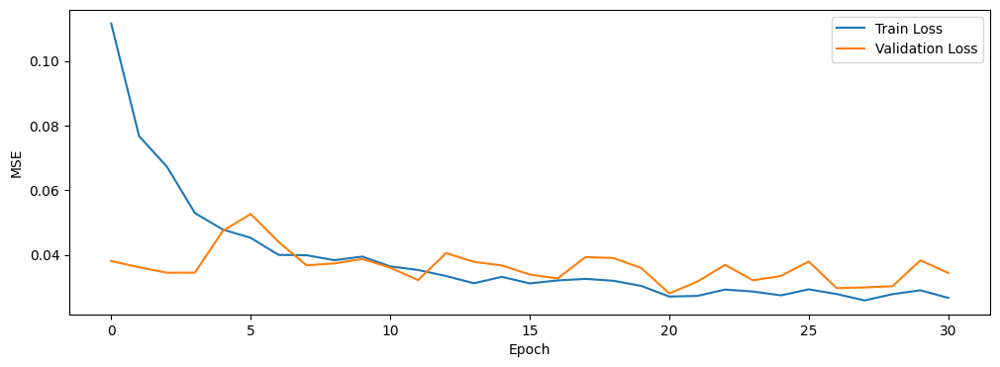

In [ ]:
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, Activation, Dropout

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v5_sigmoid = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_5/Sigmoid.keras'

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch with dropout
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)
x_time = Dropout(0.3)(x_time)  # Added dropout to prevent overfitting

# Frequency domain branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)  # FFT with filtering

# Attention mechanism over frequency components with dropout
attention_scores = Dense(1, activation='relu')(x_freq)  # Shape: (batch_size, num_valid_freqs, 1)
attention_scores = Flatten()(attention_scores)          # Shape: (batch_size, num_valid_freqs)
attention_weights = Activation('sigmoid')(attention_scores)   # Apply Sigmoid over frequency dimension
attention_weights = Reshape((-1, 1))(attention_weights)  # Shape: (batch_size, num_valid_freqs, 1)

# Apply attention weights
x_freq_attended = Multiply()([x_freq, attention_weights])  # Element-wise multiplication

# Flatten frequency features and add dropout
x_freq_flat = Flatten()(x_freq_attended)
x_freq_flat = Dropout(0.3)(x_freq_flat)  # Added dropout to prevent overfitting

# Dense layer after attention with dropout
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)
x_freq_dense = Dropout(0.3)(x_freq_dense)  # Added dropout to prevent overfitting

# Combine time and frequency features
x_combined = Concatenate()([x_time, x_freq_dense])

# Output layers with dropout
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dropout(0.3)(x_output)  # Added dropout to prevent overfitting
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model with validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v5_sigmoid)

# Prediction
y_pred_scaled = model.predict(X_test_scaled[..., np.newaxis])

# Reverse scaling
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Plotting the predictions
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Actual values')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot training history
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()


###No Sigmoid

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_17            │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_16 (Lambda)        │ (None, 3)              │              0 │ input_layer_17[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_66 (Dense)          │ (None, 1)              │              4 │ lambda_16[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_14 (Flatten)      │ (None, 1)              │              0 │ dense_66[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_16 (Multiply)    │ (None, 3)              │              0 │ lambda_16[0][0],       │
│                           │                        │                │ flatten_14[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_15 (Flatten)      │ (None, 3)              │              0 │ multiply_16[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_5 (Dropout)       │ (None, 3)              │              0 │ flatten_15[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_17 (LSTM)            │ (None, 128)            │         66,560 │ input_layer_17[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_67 (Dense)          │ (None, 64)             │            256 │ dropout_5[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 128)            │              0 │ lstm_17[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_6 (Dropout)       │ (None, 64)             │              0 │ dense_67[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_16            │ (None, 192)            │              0 │ dropout_4[0][0],       │
│ (Concatenate)             │                        │                │ dropout_6[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_68 (Dense)          │ (None, 64)             │         12,352 │ concatenate_16[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_7 (Dropout)       │ (None, 64)             │              0 │ dense_68[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_69 (Dense)          │ (None, 1)              │             65 │ dropout_7[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 79,237 (309.52 KB)

 Trainable params: 79,237 (309.52 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.4488 - val_loss: 0.0996
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.3681 - val_loss: 0.0458
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.1856 - val_loss: 0.0805
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1877 - val_loss: 0.0517
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.1329 - val_loss: 0.1178
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.1319 - val_loss: 0.1496
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.1142 - val_loss: 0.0739
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0860 - val_loss: 0.0634
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0928 - val_loss: 0.0670
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0620 - val_loss: 0.0750
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0747 - val_loss: 0.0574
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0597 - val

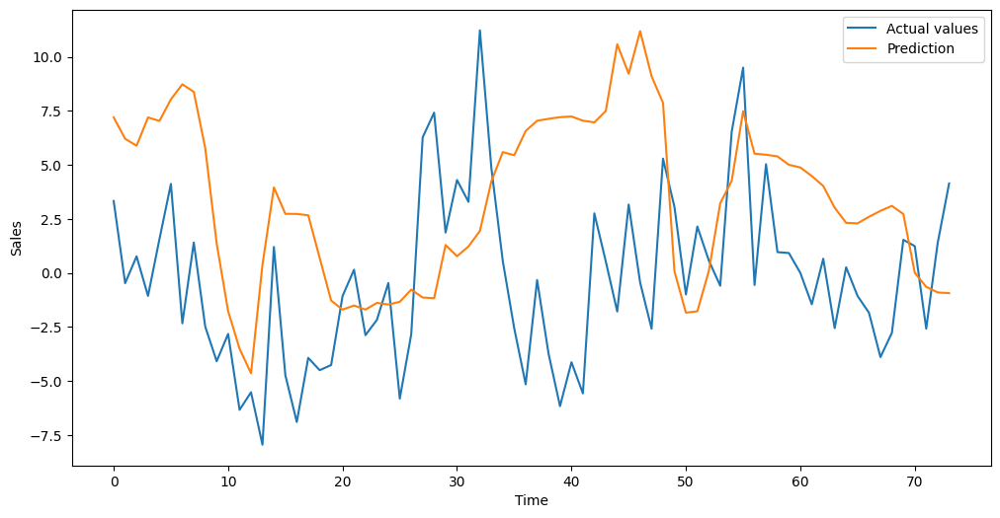



MSE: 38.1837




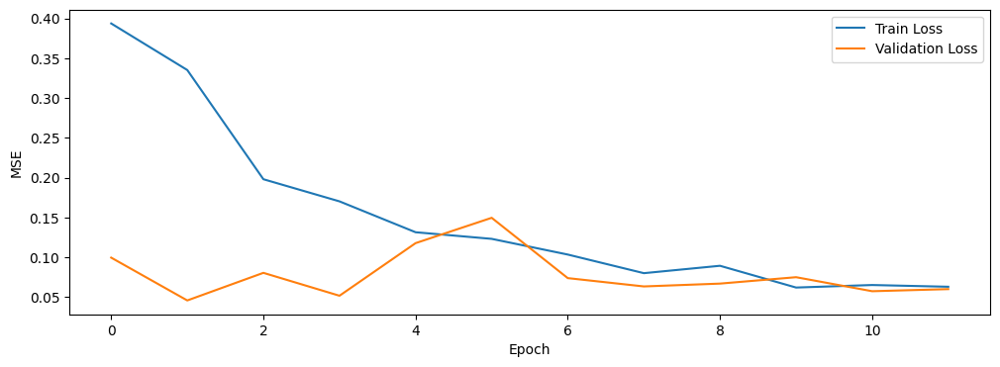

In [ ]:
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, Activation, Dropout

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v5_no_sigmoid = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_5/No_Sigmoid.keras'

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch with dropout
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)
x_time = Dropout(0.3)(x_time)  # Added dropout to prevent overfitting

# Frequency domain branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)  # FFT with filtering

# Attention mechanism over frequency components with dropout
attention_scores = Dense(1, activation='relu')(x_freq)  # Shape: (batch_size, num_valid_freqs, 1)
attention_scores = Flatten()(attention_scores)          # Shape: (batch_size, num_valid_freqs)

# Apply attention weights
x_freq_attended = Multiply()([x_freq, attention_scores])  # Element-wise multiplication

# Flatten frequency features and add dropout
x_freq_flat = Flatten()(x_freq_attended)
x_freq_flat = Dropout(0.3)(x_freq_flat)  # Added dropout to prevent overfitting

# Dense layer after attention with dropout
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)
x_freq_dense = Dropout(0.3)(x_freq_dense)  # Added dropout to prevent overfitting

# Combine time and frequency features
x_combined = Concatenate()([x_time, x_freq_dense])

# Output layers with dropout
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dropout(0.3)(x_output)  # Added dropout to prevent overfitting
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model with validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v5_no_sigmoid)

# Prediction
y_pred_scaled = model.predict(X_test_scaled[..., np.newaxis])

# Reverse scaling
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Plotting the predictions
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Actual values')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot training history
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

###Leaky relu

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_18            │ (None, 30, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_17 (Lambda)        │ (None, 3)              │              0 │ input_layer_18[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_70 (Dense)          │ (None, 16)             │             64 │ lambda_17[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_16 (Flatten)      │ (None, 16)             │              0 │ dense_70[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 16)             │              0 │ flatten_16[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_3 (Reshape)       │ (None, 16, 1)          │              0 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_17 (Multiply)    │ (None, 16, 3)          │              0 │ lambda_17[0][0],       │
│                           │                        │                │ reshape_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_17 (Flatten)      │ (None, 48)             │              0 │ multiply_17[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_9 (Dropout)       │ (None, 48)             │              0 │ flatten_17[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_18 (LSTM)            │ (None, 128)            │         66,560 │ input_layer_18[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_71 (Dense)          │ (None, 64)             │          3,136 │ dropout_9[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_8 (Dropout)       │ (None, 128)            │              0 │ lstm_18[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_10 (Dropout)      │ (None, 64)             │              0 │ dense_71[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_17            │ (None, 192)            │              0 │ dropout_8[0][0],       │
│ (Concatenate)             │                        │                │ dropout_10[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_72 (Dense)          │ (None, 64)             │         12,352 │ concatenate_17[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_11 (Dropout)      │ (None, 64)             │              0 │ dense_72[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_73 (Dense)          │ (None, 1)              │             65 │ dropout_11[0][0]       │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 82,177 (321.00 KB)

 Trainable params: 82,177 (321.00 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.4336 - val_loss: 0.0517
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1610 - val_loss: 0.0441
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.1096 - val_loss: 0.0666
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0927 - val_loss: 0.0524
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0687 - val_loss: 0.0570
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0548 - val_loss: 0.0468
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0595 - val_loss: 0.0645
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0561 - val_loss: 0.0618
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0506 - val_loss: 0.0529
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0507 - val_loss: 0.0436
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0527 - val_loss: 0.0571
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0455 - val_l

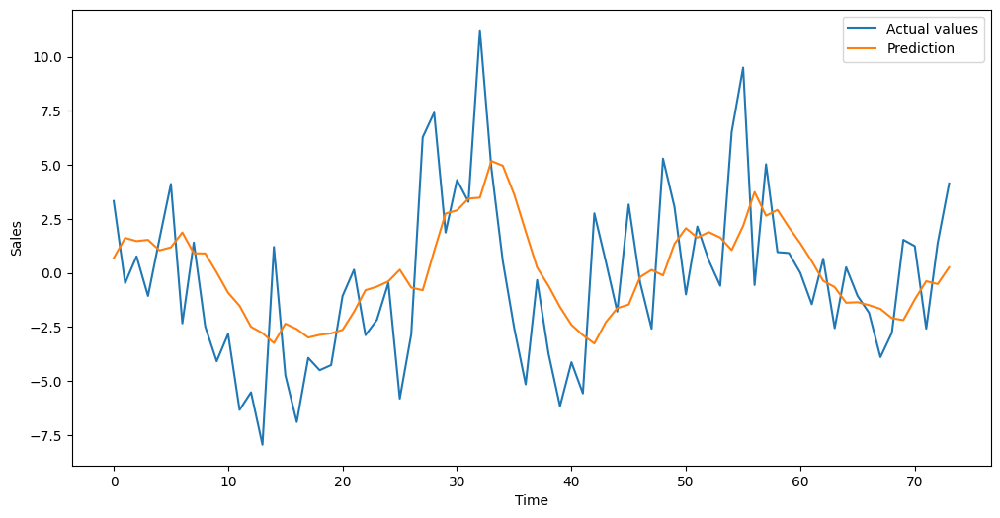



MSE: 11.3463




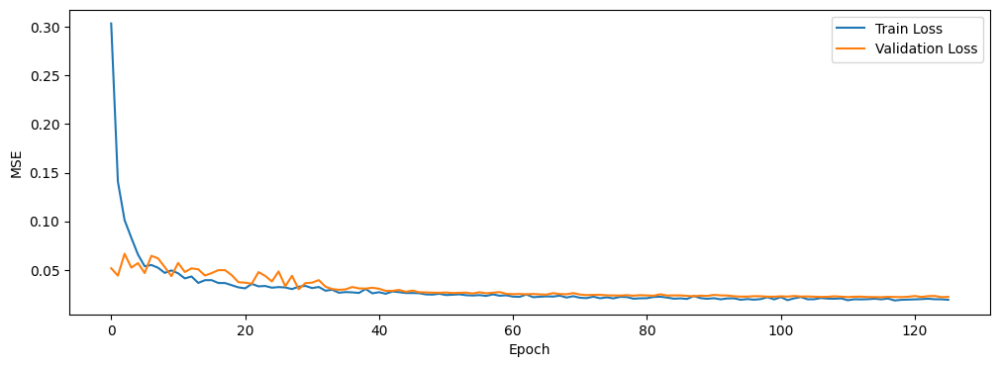

In [ ]:
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, Activation, Dropout, LeakyReLU

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_v5_leakyrelu = '/content/drive/MyDrive/Tirocinio/LstmFourier/Version_5/LeakyRelu.keras'

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch with dropout
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)
x_time = Dropout(0.3)(x_time)  # Added dropout to prevent overfitting

# Frequency domain branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)  # FFT with filtering
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_scores = Flatten()(attention_scores)          # Shape: (batch_size, num_valid_freqs)
attention_weights = Activation('sigmoid')(attention_scores)   # Apply Sigmoid over frequency dimension
attention_weights = Reshape((-1, 1))(attention_weights)  # Shape: (batch_size, num_valid_freqs, 1)

# Apply attention weights
x_freq_attended = Multiply()([x_freq, attention_weights])  # Element-wise multiplication

# Flatten frequency features and add dropout
x_freq_flat = Flatten()(x_freq_attended)
x_freq_flat = Dropout(0.3)(x_freq_flat)  # Added dropout to prevent overfitting

# Dense layer after attention with dropout
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)
x_freq_dense = Dropout(0.3)(x_freq_dense)  # Added dropout to prevent overfitting

# Combine time and frequency features
x_combined = Concatenate()([x_time, x_freq_dense])

# Output layers with dropout
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dropout(0.3)(x_output)  # Added dropout to prevent overfitting
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model with validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_v5_leakyrelu)

# Prediction
y_pred_scaled = model.predict(X_test_scaled[..., np.newaxis])

# Reverse scaling
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Plotting the predictions
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Actual values')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot training history
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()


####Confronting the three version

In [ ]:
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.models import load_model

baseline_lstm = tf.keras.models.load_model(path_base_lstm)
model_v5_sigmoid = load_model(path_v5_sigmoid, custom_objects={'fourier_transform_layer_v4': fourier_transform_layer_v4})
model_v5_no_sigmoid = load_model(path_v5_no_sigmoid, custom_objects={'fourier_transform_layer_v4': fourier_transform_layer_v4})
model_v5_leakyReLu = load_model(path_v5_leakyrelu, custom_objects={'LeakyReLU': LeakyReLU, 'fourier_transform_layer_v4': fourier_transform_layer_v4})

models = [baseline_lstm, model_v5_sigmoid, model_v5_no_sigmoid, model_v5_leakyReLu]

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

# Divide the dataset
_, _, _, _, X_test, y_test = divide_dataset_validation(X, y)

# Scale the test data
scaler_X = MinMaxScaler(feature_range=(0, 1))
X_test_scaled = scaler_X.fit_transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)

scaler_y = MinMaxScaler(feature_range=(0, 1))
y_test_scaled = scaler_y.fit_transform(y_test.reshape(-1, 1)).flatten()

# Prediction and MSE Calculation
y_pred_scaled = []
y_pred = []
mse_errors = []

for i, model in enumerate(models):
    pred_scaled = model.predict(X_test_scaled[..., np.newaxis])
    pred = scaler_y.inverse_transform(pred_scaled)

    # Append predictions
    y_pred_scaled.append(pred_scaled)
    y_pred.append(pred)

    # Calculate and print MSE
    mse = mean_squared_error(y_test, pred.flatten())
    mse_errors.append(mse)

# Transform mse_errors into a dataframe in which the row are named version and the index and the column is mse
mse_df = pd.DataFrame(mse_errors, index=['Baseline LSTM','Sigmoid', 'No Sigmoid', 'Leaky Relu'], columns=['MSE'])
print(mse_df)


# Plot using the dropdown feature
plot_px_dropdown(series=[y_test] + y_pred,
                 labels=['Actual values'] + list(mse_df.index),
                 title='Model Predictions vs Actual Values')

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 811ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step
                     MSE
Baseline LSTM  11.458592
Sigmoid        13.747238
No Sigmoid     38.183665
Leaky Relu     11.346280


# Improvement from the Best

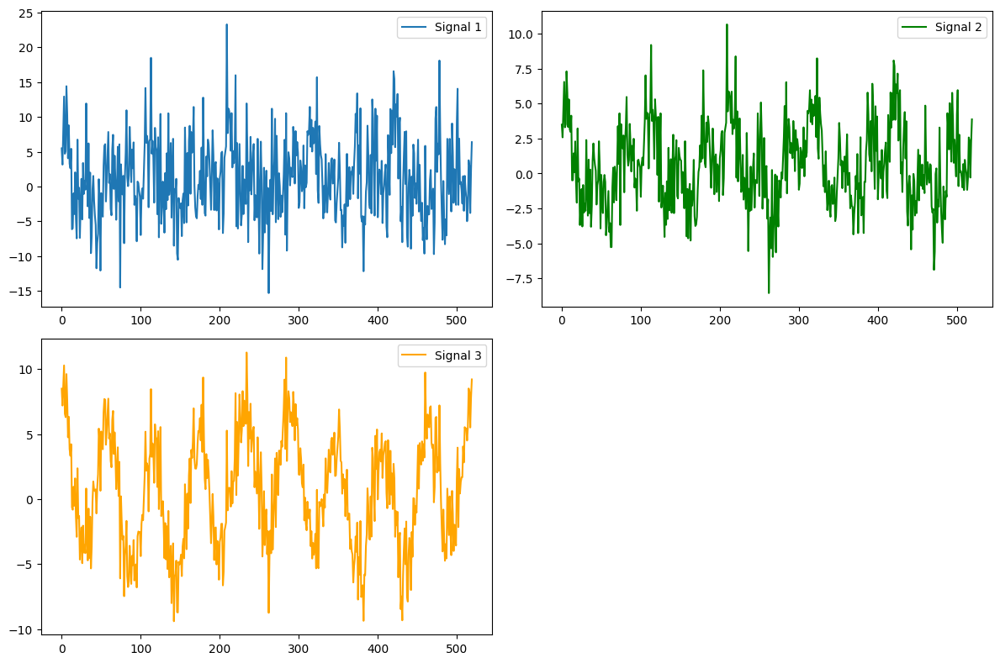

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, Activation, Dropout

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

set_seed(42)

# Data Preparation
resolution = 520

common_noise = noise(resolution, 2)
common_trend = trend(resolution)

signal_1 = sine_wave + common_trend + common_noise
signal_2 = wave(15, resolution, 2) + wave(5, resolution, 2, np.cos) + common_trend + common_noise
signal_3 = wave(9, resolution, 5, np.cos) + wave(2, resolution, 2, np.cos) + common_trend + common_noise

signals = [signal_1, signal_2, signal_3]

# Create a 2x2 grid of subplots
plt.figure(figsize=(12, 8))

# First plot in (0,0)
plt.subplot(2, 2, 1)  # 2 rows, 2 columns, 1st subplot
plt.plot(signal_1, label='Signal 1')
plt.legend()

# Second plot in (0,1)
plt.subplot(2, 2, 2)  # 2nd subplot
plt.plot(signal_2, label='Signal 2', color='green')
plt.legend()

# Third plot in (1,0)
plt.subplot(2, 2, 3)  # 3rd subplot
plt.plot(signal_3, label='Signal 3', color='orange')
plt.legend()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show all subplots
plt.show()

## Longer LSTM

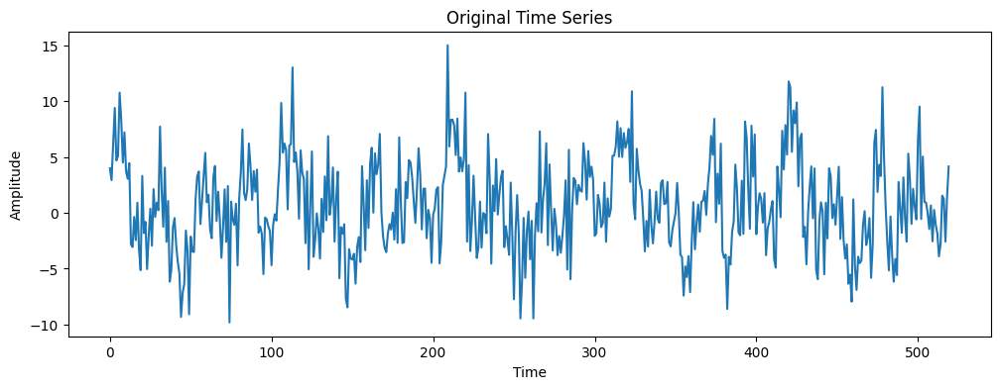

X shape: (490, 30)
y shape: (490,)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 30, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 128)                 │          66,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 74,881 (292.50 KB)

 Trainable params: 74,881 (292.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 109ms/step - loss: 0.1504 - val_loss: 0.0345
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0252 - val_loss: 0.0318
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0242 - val_loss: 0.0315
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0240 - val_loss: 0.0312
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0238 - val_loss: 0.0309
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0237 - val_loss: 0.0306
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0236 - val_loss: 0.0304
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0234 - val_loss: 0.0301
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0233 - val_loss: 0.0299
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0232 - val_loss: 0.0297
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0230 - val_loss: 0.0294
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0229 - val_l

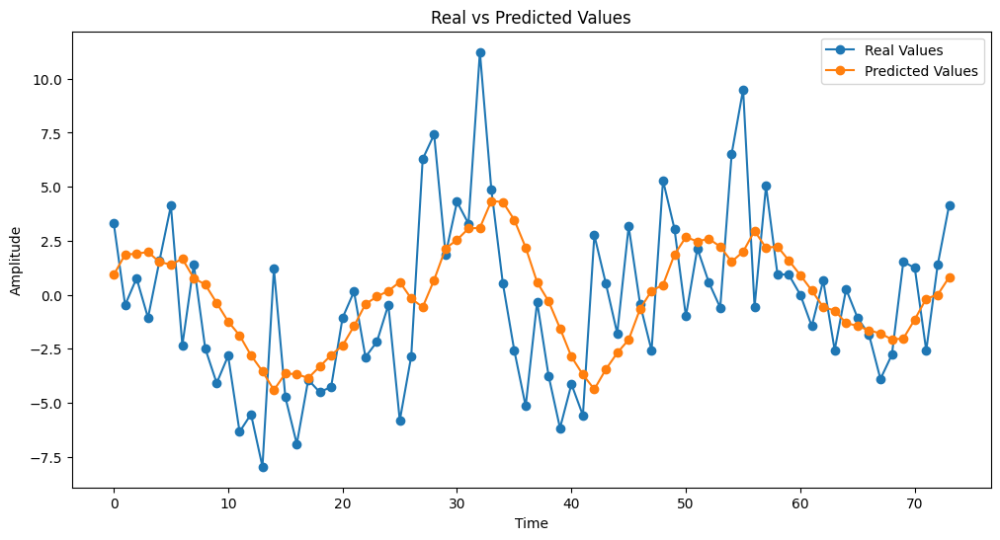

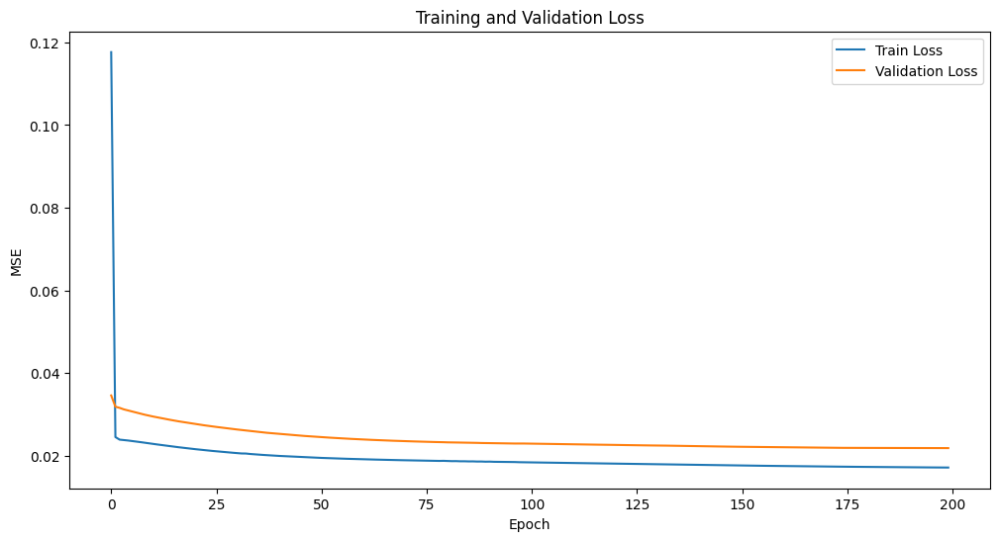

In [ ]:
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, Activation
from sklearn.metrics import mean_squared_error

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_longer_lstm = '/content/drive/MyDrive/Tirocinio/LstmFourier/longerLSTM.keras'

sine_wave =  wave(10, resolution, 1) + wave(20, resolution, 3) + wave(5, resolution, 2, np.cos) + noise(resolution, 3) + trend(resolution)

# Plot the initial signal
plt.figure(figsize=(12, 4))
plt.plot(sine_wave)
plt.title('Original Time Series')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

sequence_lenght = 90

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Divide into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaling the input data (X)
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape in order to scale
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

# Scaler fit
scaler_X.fit(X_train_reshaped)

X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaling of the target (y)
scaler_y = MinMaxScaler(feature_range=(0, 1))

# Target reshape
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Scaler fit on training, validation and test targets
scaler_y.fit(y_train_reshaped)

y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)

# Output layers
x_output = Dense(64, activation='relu')(x_time)
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model with validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_longer_lstm)

y_pred_scaled = model.predict(X_test_scaled)
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_inv = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Result confrontation
mse = mean_squared_error(y_test_inv, y_pred)
print(f'MSE: {mse}')

# Plot of the results
plt.figure(figsize=(12, 6))
plt.plot(y_test_inv, label='Real Values', marker='o')
plt.plot(y_pred, label='Predicted Values', marker='o')
plt.title('Real vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

# Loss value during training
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

## BiLSTM

###Sequence = 60

X shape: (460, 60)
y shape: (460,)


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 60, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_3 (Lambda)         │ (None, 3)              │              0 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_6 (Dense)           │ (None, 16)             │             64 │ lambda_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_2 (Flatten)       │ (None, 16)             │              0 │ dense_6[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 16)             │              0 │ flatten_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_1 (Reshape)       │ (None, 16, 1)          │              0 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_1 (Multiply)     │ (None, 16, 3)          │              0 │ lambda_3[0][0],        │
│                           │                        │                │ reshape_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_3 (Flatten)       │ (None, 48)             │              0 │ multiply_1[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 48)             │              0 │ flatten_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_2           │ (None, 256)            │        133,120 │ input_layer_5[0][0]    │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 64)             │          3,136 │ dropout_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 256)            │              0 │ bidirectional_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 64)             │              0 │ dense_7[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 320)            │              0 │ dropout_2[0][0],       │
│ (Concatenate)             │                        │                │ dropout_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_8 (Dense)           │ (None, 64)             │         20,544 │ concatenate_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_5 (Dropout)       │ (None, 64)             │              0 │ dense_8[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_9 (Dense)           │ (None, 1)              │             65 │ dropout_5[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 156,929 (613.00 KB)

 Trainable params: 156,929 (613.00 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 250ms/step - loss: 0.3382 - val_loss: 0.0896
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0893 - val_loss: 0.0337
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0898 - val_loss: 0.0249
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0953 - val_loss: 0.1402
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0942 - val_loss: 0.0296
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 254ms/step - loss: 0.0565 - val_loss: 0.0224
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 275ms/step - loss: 0.0561 - val_loss: 0.0258
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - loss: 0.0502 - val_loss: 0.0309
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0477 - val_loss: 0.0274
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0416 - val_loss: 0.0529
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0486 - val_loss: 0.0299
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0

1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step


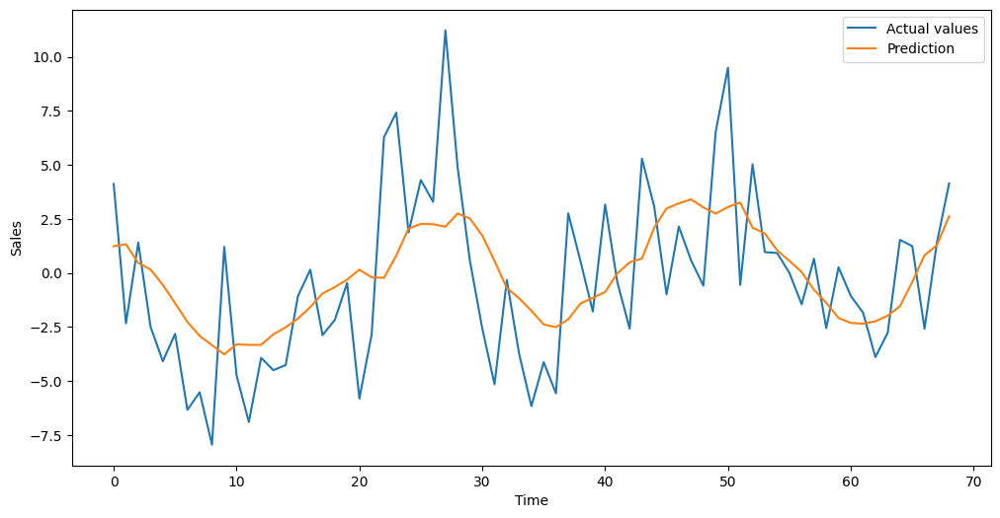



MSE: 10.0960




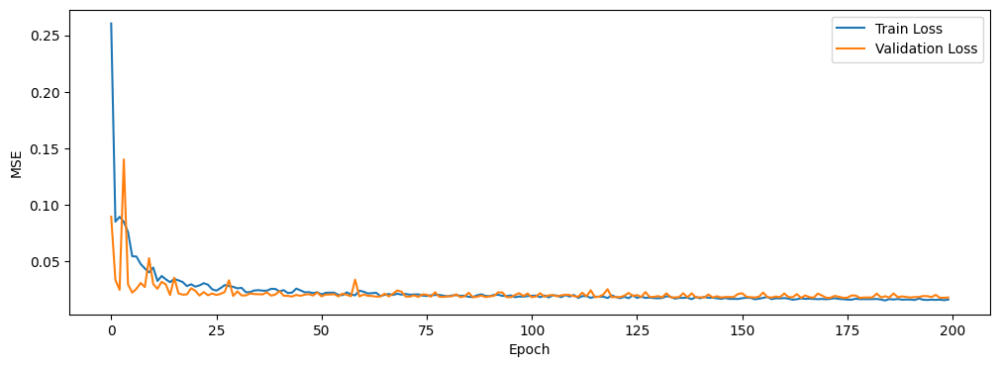

In [ ]:
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, Activation, Dropout, LeakyReLU, Bidirectional

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

sequence_length = 60

# Call the seed function before model training
set_seed(42)

path_improv_BiLSTM_60 = '/content/drive/MyDrive/Tirocinio/LstmFourier/Improving/BiLSTM_60.keras'

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Divide into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaling the input data (X)
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape in order to scale
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

# Scaler fit
scaler_X.fit(X_train_reshaped)

X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaling of the target (y)
scaler_y = MinMaxScaler(feature_range=(0, 1))

# Target reshape
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Scaler fit on training, validation and test targets
scaler_y.fit(y_train_reshaped)

y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch using Bidirectional LSTM
x_time = Bidirectional(LSTM(128, activation='relu', return_sequences=False))(input_sales)
x_time = Dropout(0.1)(x_time)  # Added dropout to prevent overfitting

# Frequency domain branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)  # FFT with filtering
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_scores = Flatten()(attention_scores)          # Shape: (batch_size, num_valid_freqs)
attention_weights = Activation('sigmoid')(attention_scores)   # Apply Sigmoid over frequency dimension
attention_weights = Reshape((-1, 1))(attention_weights)  # Shape: (batch_size, num_valid_freqs, 1)

# Apply attention weights
x_freq_attended = Multiply()([x_freq, attention_weights])  # Element-wise multiplication

# Flatten frequency features and add dropout
x_freq_flat = Flatten()(x_freq_attended)
x_freq_flat = Dropout(0.1)(x_freq_flat)  # Added dropout to prevent overfitting

# Dense layer after attention with dropout
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)
x_freq_dense = Dropout(0.1)(x_freq_dense)  # Added dropout to prevent overfitting

# Combine time and frequency features
x_combined = Concatenate()([x_time, x_freq_dense])

# Output layers with dropout
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dropout(0.1)(x_output)  # Added dropout to prevent overfitting
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=30,
    restore_best_weights=True
)

# Train the model with validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_improv_BiLSTM_60)

# Prediction
y_pred_scaled = model.predict(X_test_scaled[..., np.newaxis])

# Reverse scaling
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Plotting the predictions
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Actual values')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot training history
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()


###Sequence = 90

X shape: (430, 90)
y shape: (430,)


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 90, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_4 (Lambda)         │ (None, 3)              │              0 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_10 (Dense)          │ (None, 16)             │             64 │ lambda_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_4 (Flatten)       │ (None, 16)             │              0 │ dense_10[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 16)             │              0 │ flatten_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_2 (Reshape)       │ (None, 16, 1)          │              0 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_2 (Multiply)     │ (None, 16, 3)          │              0 │ lambda_4[0][0],        │
│                           │                        │                │ reshape_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_5 (Flatten)       │ (None, 48)             │              0 │ multiply_2[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_7 (Dropout)       │ (None, 48)             │              0 │ flatten_5[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_3           │ (None, 256)            │        133,120 │ input_layer_6[0][0]    │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_11 (Dense)          │ (None, 64)             │          3,136 │ dropout_7[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_6 (Dropout)       │ (None, 256)            │              0 │ bidirectional_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_8 (Dropout)       │ (None, 64)             │              0 │ dense_11[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 320)            │              0 │ dropout_6[0][0],       │
│ (Concatenate)             │                        │                │ dropout_8[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_12 (Dense)          │ (None, 64)             │         20,544 │ concatenate_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_9 (Dropout)       │ (None, 64)             │              0 │ dense_12[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_13 (Dense)          │ (None, 1)              │             65 │ dropout_9[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 156,929 (613.00 KB)

 Trainable params: 156,929 (613.00 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 635ms/step - loss: 1.6060 - val_loss: 0.0502
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 390ms/step - loss: 0.6695 - val_loss: 0.0620
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 516ms/step - loss: 0.5899 - val_loss: 0.0605
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 427ms/step - loss: 0.4728 - val_loss: 0.0733
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 552ms/step - loss: 0.3421 - val_loss: 0.1261
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 401ms/step - loss: 228779343872.0000 - val_loss: 0.1802
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 380ms/step - loss: 0.2128 - val_loss: 0.1310
Epoch 8/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 368ms/step - loss: 0.2089 - val_loss: 0.1304
Epoch 9/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 390ms/step - loss: 0.2230 - val_loss: 0.1286
Epoch 10/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 513ms/step - loss: 0.2149 - val_loss: 0.1358
Epoch 11/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 595ms/step - loss: 0.1976 - val_loss: 0.1371
Epoch 12/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 404ms/step

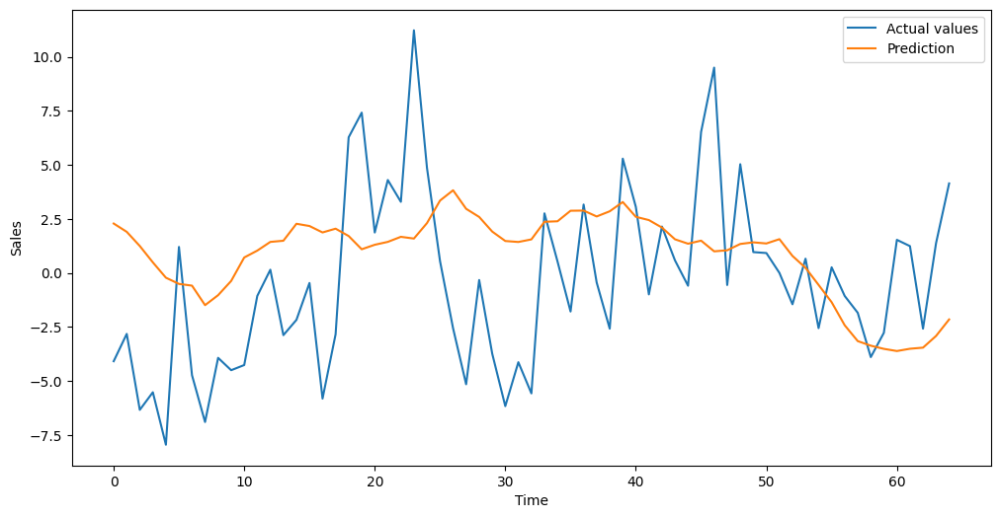



MSE: 19.1368




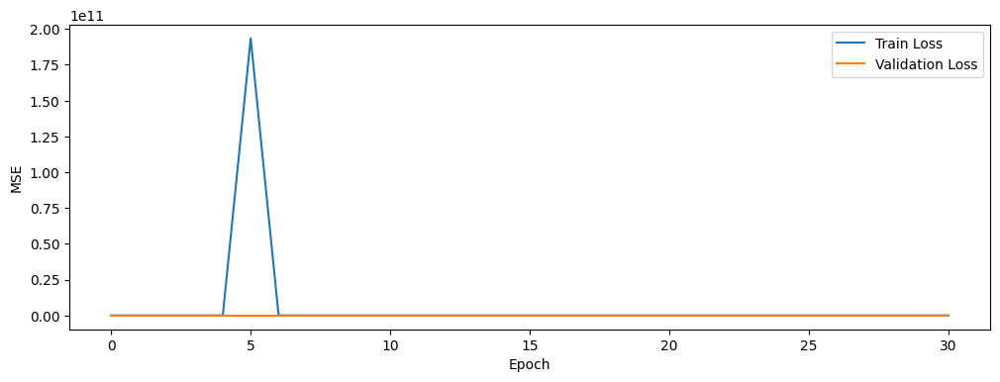

In [ ]:
import numpy as np
import tensorflow as tf
import random
from tensorflow.keras.layers import Input, LSTM, Dense, Lambda, Multiply, Concatenate, Softmax, Flatten, Reshape, Activation, Dropout, LeakyReLU, Bidirectional

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

sequence_length = 90

# Call the seed function before model training
set_seed(42)

path_improv_BiLSTM_90 = '/content/drive/MyDrive/Tirocinio/LstmFourier/Improving/BiLSTM_90.keras'

# Dataset creation
X, y = create_dataset(sine_wave, sequence_length)

print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Divide into train, validation and test
X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

# Scaling the input data (X)
scaler_X = MinMaxScaler(feature_range=(0, 1))

# Reshape in order to scale
X_train_reshaped = X_train.reshape(-1, 1)
X_validation_reshaped = X_validation.reshape(-1, 1)
X_test_reshaped = X_test.reshape(-1, 1)

# Scaler fit
scaler_X.fit(X_train_reshaped)

X_train_scaled = scaler_X.transform(X_train_reshaped).reshape(X_train.shape)
X_validation_scaled = scaler_X.transform(X_validation_reshaped).reshape(X_validation.shape)
X_test_scaled = scaler_X.transform(X_test_reshaped).reshape(X_test.shape)

# Scaling of the target (y)
scaler_y = MinMaxScaler(feature_range=(0, 1))

# Target reshape
y_train_reshaped = y_train.reshape(-1, 1)
y_validation_reshaped = y_validation.reshape(-1, 1)
y_test_reshaped = y_test.reshape(-1, 1)

# Scaler fit on training, validation and test targets
scaler_y.fit(y_train_reshaped)

y_train_scaled = scaler_y.transform(y_train_reshaped).flatten()
y_validation_scaled = scaler_y.transform(y_validation_reshaped).flatten()
y_test_scaled = scaler_y.transform(y_test_reshaped).flatten()

# Input layer
input_sales = Input(shape=(sequence_length, 1))

# Time domain branch using Bidirectional LSTM
x_time = Bidirectional(LSTM(128, activation='relu', return_sequences=False))(input_sales)
x_time = Dropout(0.3)(x_time)  # Added dropout to prevent overfitting

# Frequency domain branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)  # FFT with filtering
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_scores = Flatten()(attention_scores)          # Shape: (batch_size, num_valid_freqs)
attention_weights = Activation('sigmoid')(attention_scores)   # Apply Sigmoid over frequency dimension
attention_weights = Reshape((-1, 1))(attention_weights)  # Shape: (batch_size, num_valid_freqs, 1)

# Apply attention weights
x_freq_attended = Multiply()([x_freq, attention_weights])  # Element-wise multiplication

# Flatten frequency features and add dropout
x_freq_flat = Flatten()(x_freq_attended)
x_freq_flat = Dropout(0.3)(x_freq_flat)  # Added dropout to prevent overfitting

# Dense layer after attention with dropout
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)
x_freq_dense = Dropout(0.3)(x_freq_dense)  # Added dropout to prevent overfitting

# Combine time and frequency features
x_combined = Concatenate()([x_time, x_freq_dense])

# Output layers with dropout
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dropout(0.3)(x_output)  # Added dropout to prevent overfitting
x_output = Dense(1)(x_output)

# Model definition
model = Model(inputs=input_sales, outputs=x_output)

# Compile the model
model.compile(optimizer='rmsprop', loss='mse')

# Summary
model.summary()

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=30,
    restore_best_weights=True
)

# Train the model with validation data
history = model.fit(
    X_train_scaled, y_train_scaled,
    epochs=200,
    batch_size=64,
    validation_data=(X_validation_scaled, y_validation_scaled),
    callbacks=[early_stopping],
    verbose=1
)

# Save the model
model.save(path_improv_BiLSTM_90)

# Prediction
y_pred_scaled = model.predict(X_test_scaled[..., np.newaxis])

# Reverse scaling
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

# Plotting the predictions
plt.figure(figsize=(12, 6))
plt.plot(range(len(y_test_original)), y_test_original, label='Actual values')
plt.plot(range(len(y_pred)), y_pred.flatten(), label='Prediction')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

# Model evaluation
mse = tf.keras.losses.MeanSquaredError()
test_mse = mse(y_test_original, y_pred).numpy()
print(f'\n\nMSE: {test_mse:.4f}\n\n')

# Plot training history
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.legend()
plt.show()

## Multiple sequence = 3

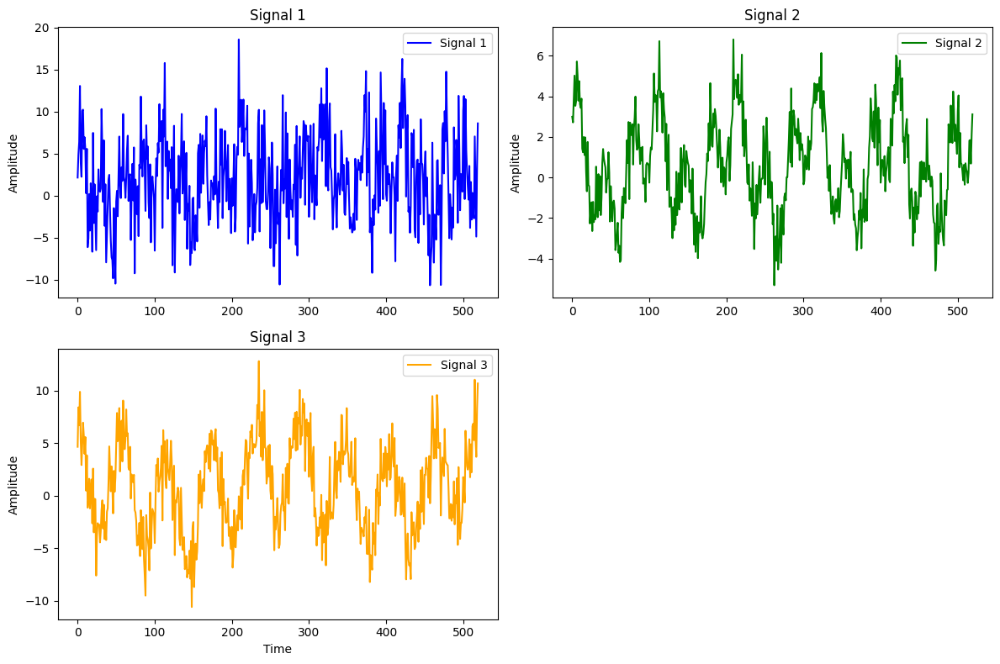

In [ ]:
import matplotlib.pyplot as plt

resolution = 520

common_noise_1 = noise(resolution, 1)
common_noise_2 = noise(resolution, 2)
common_trend_1 = trend(resolution)
common_trend_2 = trend(resolution, c1 = 2)

signal_1 = sine_wave + common_trend_1 + common_noise_1 + common_trend_2 + common_noise_2
signal_2 = wave(15, resolution, 2) + wave(5, resolution, 2, np.cos) + common_trend_1 + common_noise_1
signal_3 = wave(9, resolution, 5, np.cos) + wave(2, resolution, 2, np.cos) + common_noise_1 + common_trend_2 + common_noise_2

signals = [signal_1, signal_2, signal_3]

# Set up a 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Define colors for each subplot
colors = ["blue", "green", "orange"]

# Plot each signal in the specified grid position with legends
axs[0, 0].plot(signals[0], color=colors[0], label="Signal 1")
axs[0, 0].set_title("Signal 1")
axs[0, 0].set_ylabel("Amplitude")
axs[0, 0].legend()

axs[0, 1].plot(signals[1], color=colors[1], label="Signal 2")
axs[0, 1].set_title("Signal 2")
axs[0, 1].set_ylabel("Amplitude")
axs[0, 1].legend()

axs[1, 0].plot(signals[2], color=colors[2], label="Signal 3")
axs[1, 0].set_title("Signal 3")
axs[1, 0].set_ylabel("Amplitude")
axs[1, 0].set_xlabel("Time")
axs[1, 0].legend()

# Turn off the fourth subplot (bottom-right)
axs[1, 1].axis("off")

# Adjust layout
plt.tight_layout()
plt.show()

### Multiple LSTM baseline


--- Training on Signal 1 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 110ms/step - loss: 0.1564 - val_loss: 0.0414
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0281 - val_loss: 0.0397
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0279 - val_loss: 0.0395
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0277 - val_loss: 0.0392
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0277 - val_loss: 0.0390
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0275 - val_loss: 0.0387
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0275 - val_loss: 0.0385
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0274 - val_loss: 0.0383
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0273 - val_loss: 0.0382
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0273 - val_loss: 0.0380
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0272 - val_loss: 0.0379
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 10

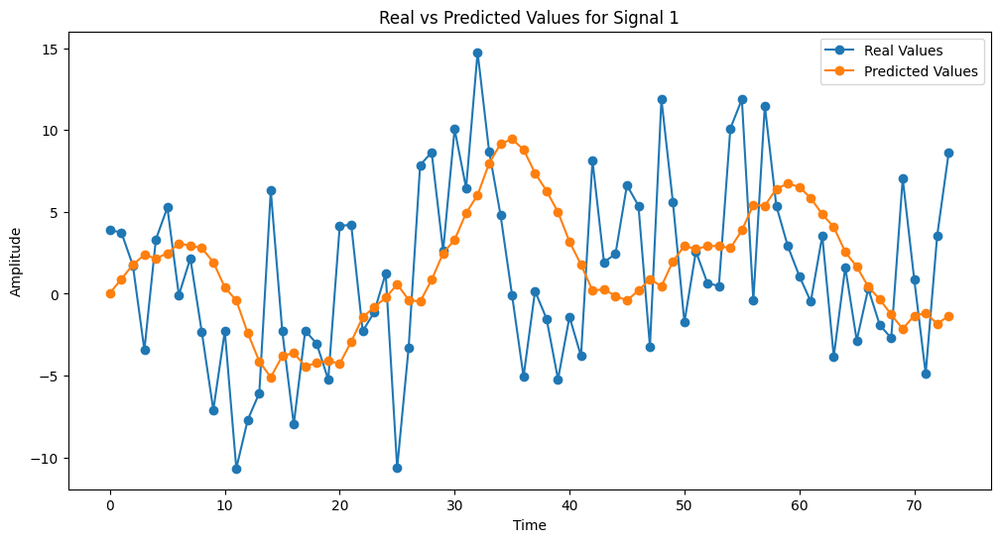


--- Prediction for Signal 2 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
MSE for Signal 2: 2.67039673957745


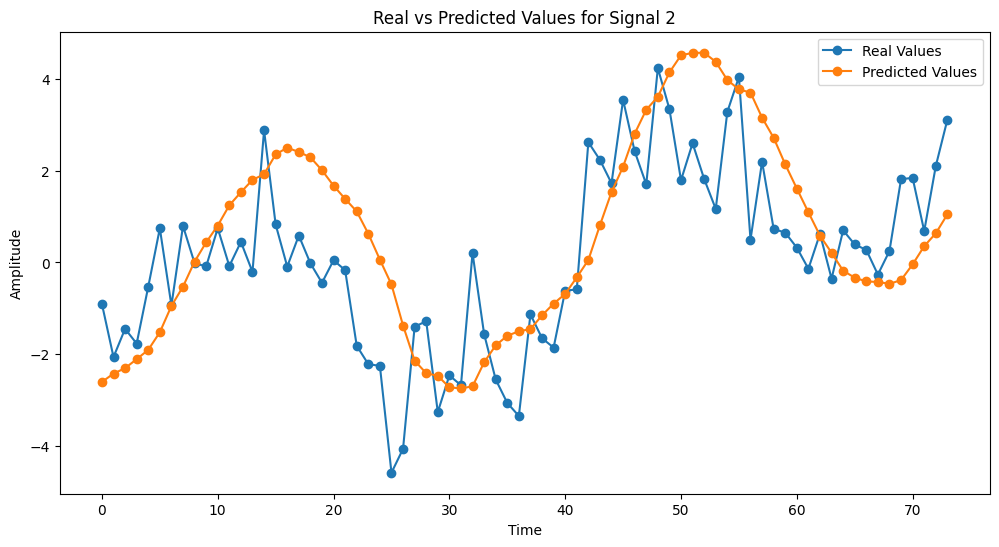


--- Prediction for Signal 3 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
MSE for Signal 3: 6.8302590984267315


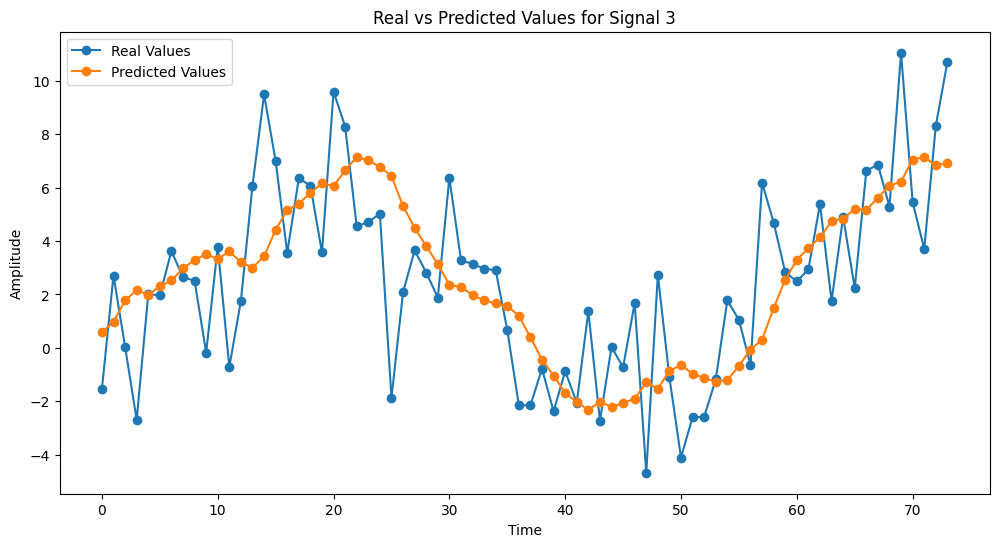

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.losses import MeanSquaredError
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

path_multiple_lstm = '/content/drive/MyDrive/Tirocinio/LstmFourier/Improving/Multiple/SimpleLSTM.keras'

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

# Set signals as a list
signals = [signal_1, signal_2, signal_3]
X_test_list = []
y_test_list = []
sequence_length = 30

# Model creation
input_sales = Input(shape=(sequence_length, 1))
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)
x_output = Dense(64, activation='relu')(x_time)
x_output = Dense(1)(x_output)
model = Model(inputs=input_sales, outputs=x_output)
model.compile(optimizer='rmsprop', loss='mse')

# Training loop on each signal
for i, signal in enumerate(signals):
    print(f"\n--- Training on Signal {i+1} ---")

    # Dataset creation per il segnale attuale
    X, y = create_dataset(signal, sequence_length)
    X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

    # Save data test for final prediction
    X_test_list.append(X_test)
    y_test_list.append(y_test)

    # Scaling del dataset
    scaler_X = MinMaxScaler(feature_range=(0, 1))
    scaler_y = MinMaxScaler(feature_range=(0, 1))

    X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, 1)).reshape(X_train.shape)
    X_validation_scaled = scaler_X.transform(X_validation.reshape(-1, 1)).reshape(X_validation.shape)
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)

    y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
    y_validation_scaled = scaler_y.transform(y_validation.reshape(-1, 1)).flatten()

    # Early stopping
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Fit
    model.fit(
        X_train_scaled, y_train_scaled,
        epochs=200,
        batch_size=64,
        validation_data=(X_validation_scaled, y_validation_scaled),
        callbacks=[early_stopping],
        verbose=1
    )

# Save the model
model.save(path_multiple_lstm)

# Final prediction
predictions = []
for i, X_test in enumerate(X_test_list):
    print(f"\n--- Prediction for Signal {i+1} ---")

    # Scale on test set
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)
    y_test_scaled = scaler_y.transform(y_test_list[i].reshape(-1, 1)).flatten()

    # Prediction
    y_pred_scaled = model.predict(X_test_scaled)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_test_inv = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

    predictions.append(y_pred)  # Save the predict

    # MSE per il segnale attuale
    mse = mean_squared_error(y_test_inv, y_pred)
    print(f'MSE for Signal {i+1}: {mse}')

    # Grafico dei risultati
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_inv, label='Real Values', marker='o')
    plt.plot(y_pred, label='Predicted Values', marker='o')
    plt.title(f'Real vs Predicted Values for Signal {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()


### Multiple BiLSTM - lenght 30


--- Training on Signal 1 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 174ms/step - loss: 0.1802 - val_loss: 0.0472
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0531 - val_loss: 0.0499
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0497 - val_loss: 0.0516
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0502 - val_loss: 0.0467
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - loss: 0.0414 - val_loss: 0.0462
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0381 - val_loss: 0.0457
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0352 - val_loss: 0.0443
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0343 - val_loss: 0.0497
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0388 - val_loss: 0.0416
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0391 - val_loss: 0.0406
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.0334 - val_loss: 0.0408
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1

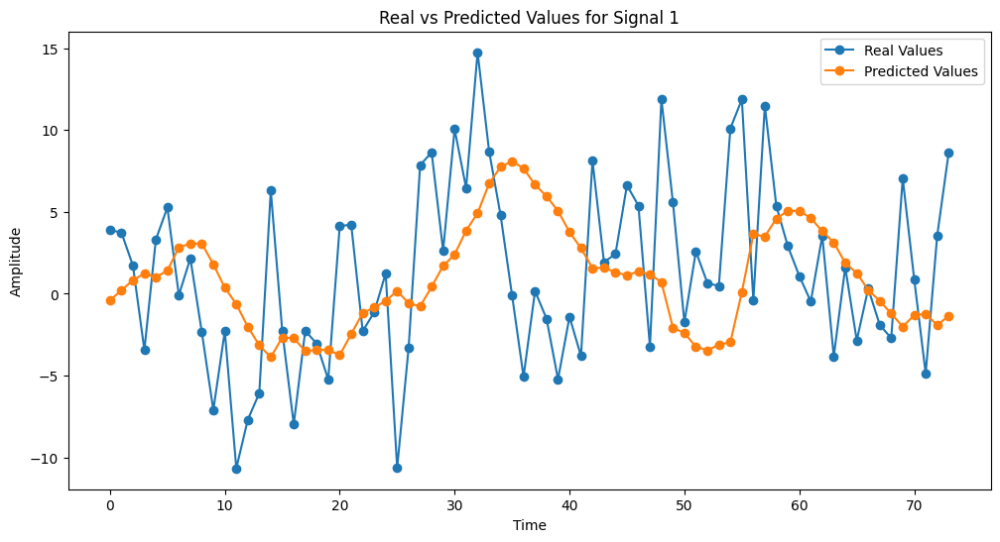


--- Prediction for Signal 2 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
MSE for Signal 2: 2.5064632892608643


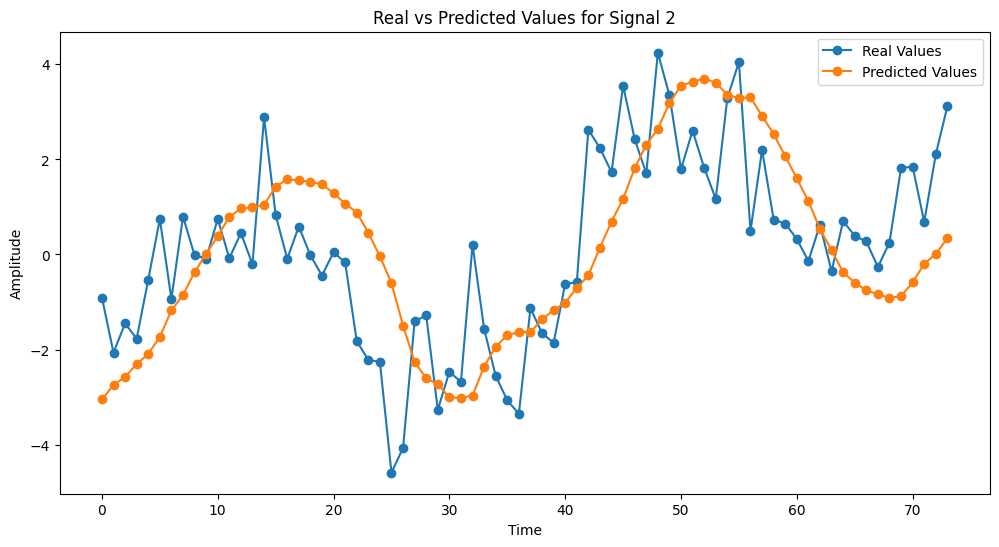


--- Prediction for Signal 3 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
MSE for Signal 3: 7.060226917266846


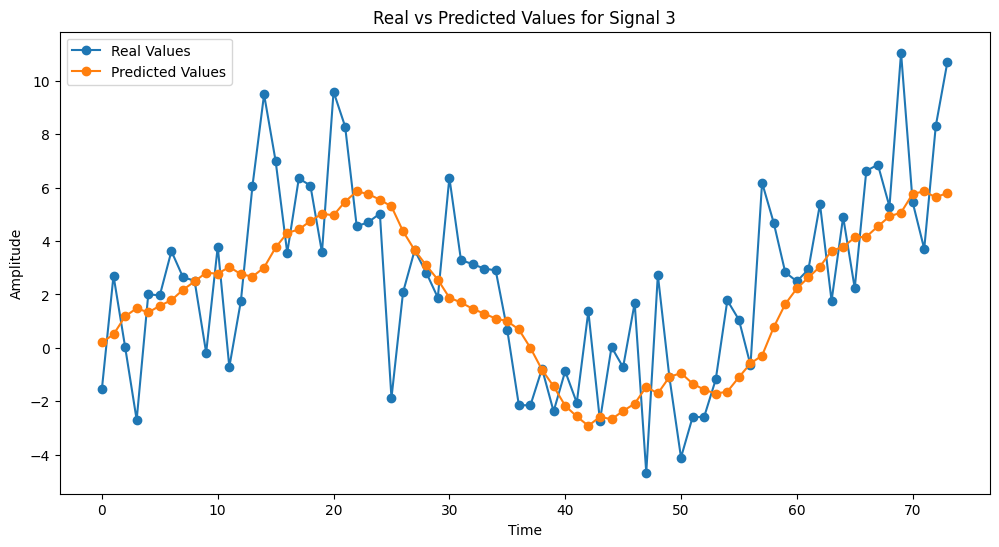

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dropout, Lambda, Dense, Flatten, Multiply, Reshape, Activation, Concatenate
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.losses import MeanSquaredError

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

# Imposta i segnali in una lista
signals = [signal_1, signal_2, signal_3]
X_test_list = []
y_test_list = []
sequence_length = 30

path_multiple_bilstm_30 = '/content/drive/MyDrive/Tirocinio/LstmFourier/Improving/Multiple/BiLSTM_30.keras'

# BiLSTM with frequency attention
input_sales = Input(shape=(sequence_length, 1))

# Temporal branch
x_time = Bidirectional(LSTM(128, activation='relu', return_sequences=False))(input_sales)
x_time = Dropout(0.1)(x_time)

# Frequency branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_scores = Flatten()(attention_scores)
attention_weights = Activation('sigmoid')(attention_scores)
attention_weights = Reshape((-1, 1))(attention_weights)

x_freq_attended = Multiply()([x_freq, attention_weights])
x_freq_flat = Flatten()(x_freq_attended)
x_freq_flat = Dropout(0.1)(x_freq_flat)
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)
x_freq_dense = Dropout(0.1)(x_freq_dense)

# Combine the two branches
x_combined = Concatenate()([x_time, x_freq_dense])

# Output levels
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dropout(0.1)(x_output)
x_output = Dense(1)(x_output)

model = Model(inputs=input_sales, outputs=x_output)
model.compile(optimizer='rmsprop', loss='mse')

# Early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)

# Loop training for the model on different signals
for i, signal in enumerate(signals):
    print(f"\n--- Training on Signal {i+1} ---")

    # Dataset creation for currently signal
    X, y = create_dataset(signal, sequence_length)
    X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

    # Save data
    X_test_list.append(X_test)
    y_test_list.append(y_test)

    # Scale dataset
    scaler_X = MinMaxScaler(feature_range=(0, 1))
    scaler_y = MinMaxScaler(feature_range=(0, 1))

    X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, 1)).reshape(X_train.shape)
    X_validation_scaled = scaler_X.transform(X_validation.reshape(-1, 1)).reshape(X_validation.shape)
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)

    y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
    y_validation_scaled = scaler_y.transform(y_validation.reshape(-1, 1)).flatten()

    # Train the model
    model.fit(
        X_train_scaled, y_train_scaled,
        epochs=200,
        batch_size=64,
        validation_data=(X_validation_scaled, y_validation_scaled),
        callbacks=[early_stopping],
        verbose=1
    )

model.save(path_multiple_bilstm_30)

# Final prediction on all signals
predictions = []
mse = MeanSquaredError()
for i, X_test in enumerate(X_test_list):
    print(f"\n--- Prediction for Signal {i+1} ---")

    # Scale on current signal
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)
    y_test_scaled = scaler_y.transform(y_test_list[i].reshape(-1, 1)).flatten()

    # Model predict
    y_pred_scaled = model.predict(X_test_scaled)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_test_inv = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

    predictions.append(y_pred)  # Save the prediction

    # MSE actual signal
    test_mse = mse(y_test_inv, y_pred).numpy()
    print(f'MSE for Signal {i+1}: {test_mse}')

    # Resulting plot
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_inv, label='Real Values', marker='o')
    plt.plot(y_pred, label='Predicted Values', marker='o')
    plt.title(f'Real vs Predicted Values for Signal {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()


### Multiple BiLSTM - lenght 60


--- Training on Signal 1 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 350ms/step - loss: 0.2942 - val_loss: 0.0807
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 275ms/step - loss: 0.0829 - val_loss: 0.0384
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0876 - val_loss: 0.0290
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0902 - val_loss: 0.1322
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0970 - val_loss: 0.0358
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0590 - val_loss: 0.0308
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0608 - val_loss: 0.0390
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step - loss: 0.0573 - val_loss: 0.0497
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - loss: 0.0550 - val_loss: 0.0301
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 372ms/step - loss: 0.0495 - val_loss: 0.0294
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 374ms/step - loss: 0.0468 - val_loss: 0.0303
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━

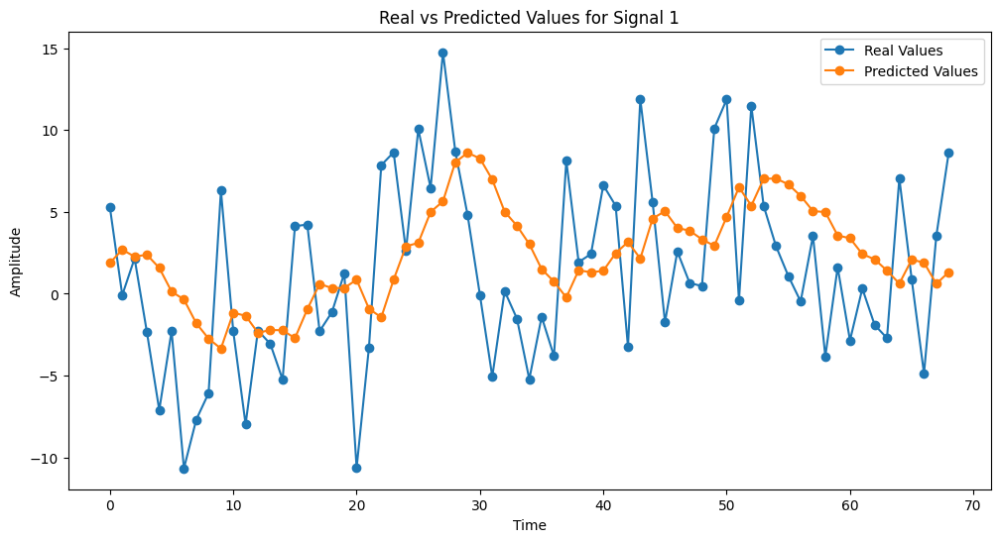


--- Prediction for Signal 2 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
MSE for Signal 2: 2.9872796535491943


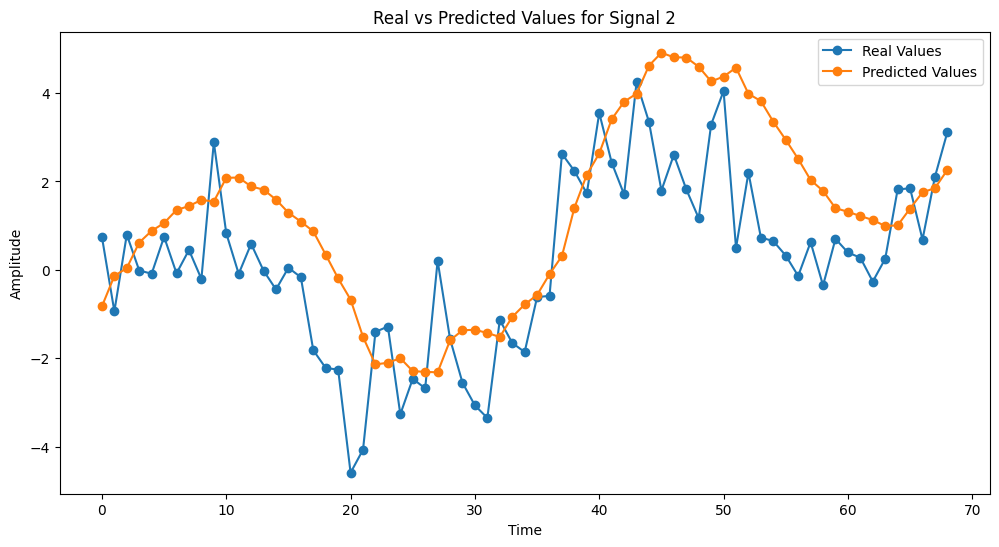


--- Prediction for Signal 3 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
MSE for Signal 3: 9.077631950378418


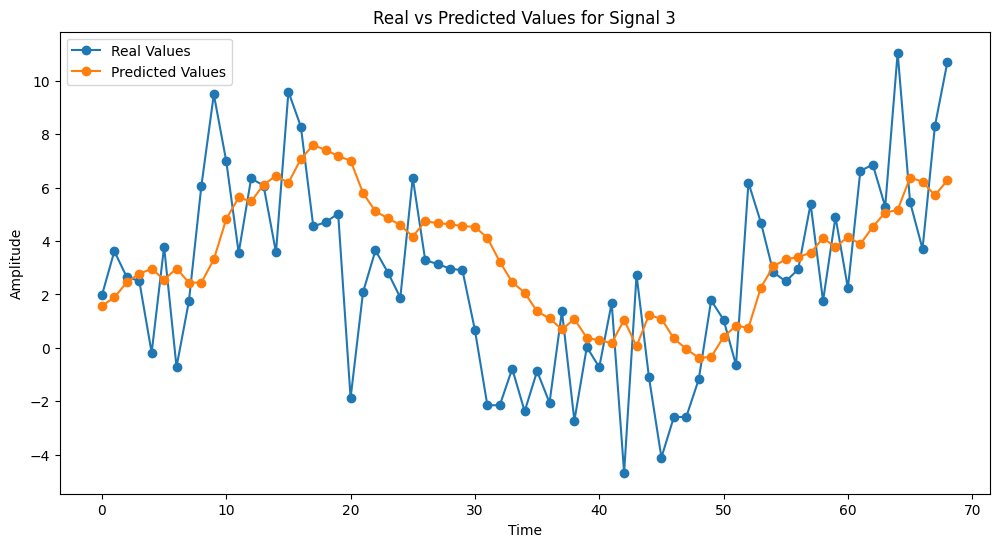

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dropout, Lambda, Dense, Flatten, Multiply, Reshape, Activation, Concatenate
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.losses import MeanSquaredError

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

signals = [signal_1, signal_2, signal_3]
X_test_list = []
y_test_list = []
sequence_length = 60

path_multiple_bilstm_60 = '/content/drive/MyDrive/Tirocinio/LstmFourier/Improving/Multiple/BiLSTM_60.keras'

# BiLSTM with frequency attention
input_sales = Input(shape=(sequence_length, 1))

# Temporal branch
x_time = Bidirectional(LSTM(128, activation='relu', return_sequences=False))(input_sales)
x_time = Dropout(0.1)(x_time)

# Frequency branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_scores = Flatten()(attention_scores)
attention_weights = Activation('sigmoid')(attention_scores)
attention_weights = Reshape((-1, 1))(attention_weights)

x_freq_attended = Multiply()([x_freq, attention_weights])
x_freq_flat = Flatten()(x_freq_attended)
x_freq_flat = Dropout(0.1)(x_freq_flat)
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)
x_freq_dense = Dropout(0.1)(x_freq_dense)

# Combine the two branches
x_combined = Concatenate()([x_time, x_freq_dense])

# Output levels
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dropout(0.1)(x_output)
x_output = Dense(1)(x_output)

model = Model(inputs=input_sales, outputs=x_output)
model.compile(optimizer='rmsprop', loss='mse')

# Early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)

# Loop on signals to train the model
for i, signal in enumerate(signals):
    print(f"\n--- Training on Signal {i+1} ---")

    # Dataset creation on currently signal
    X, y = create_dataset(signal, sequence_length)
    X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

    # Save
    X_test_list.append(X_test)
    y_test_list.append(y_test)

    # Scaling dataset
    scaler_X = MinMaxScaler(feature_range=(0, 1))
    scaler_y = MinMaxScaler(feature_range=(0, 1))

    X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, 1)).reshape(X_train.shape)
    X_validation_scaled = scaler_X.transform(X_validation.reshape(-1, 1)).reshape(X_validation.shape)
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)

    y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
    y_validation_scaled = scaler_y.transform(y_validation.reshape(-1, 1)).flatten()

    # Model training
    model.fit(
        X_train_scaled, y_train_scaled,
        epochs=200,
        batch_size=64,
        validation_data=(X_validation_scaled, y_validation_scaled),
        callbacks=[early_stopping],
        verbose=1
    )

model.save(path_multiple_bilstm_60)

# Final prediction on signals
predictions = []
mse = MeanSquaredError()
for i, X_test in enumerate(X_test_list):
    print(f"\n--- Prediction for Signal {i+1} ---")

    # Rescaling
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)
    y_test_scaled = scaler_y.transform(y_test_list[i].reshape(-1, 1)).flatten()

    # Prediction on current signal
    y_pred_scaled = model.predict(X_test_scaled)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_test_inv = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

    predictions.append(y_pred)  # Save the predictions

    # MSE on current signal
    test_mse = mse(y_test_inv, y_pred).numpy()
    print(f'MSE for Signal {i+1}: {test_mse}')

    # Results plot
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_inv, label='Real Values', marker='o')
    plt.plot(y_pred, label='Predicted Values', marker='o')
    plt.title(f'Real vs Predicted Values for Signal {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()


## Multiple sequence = 10

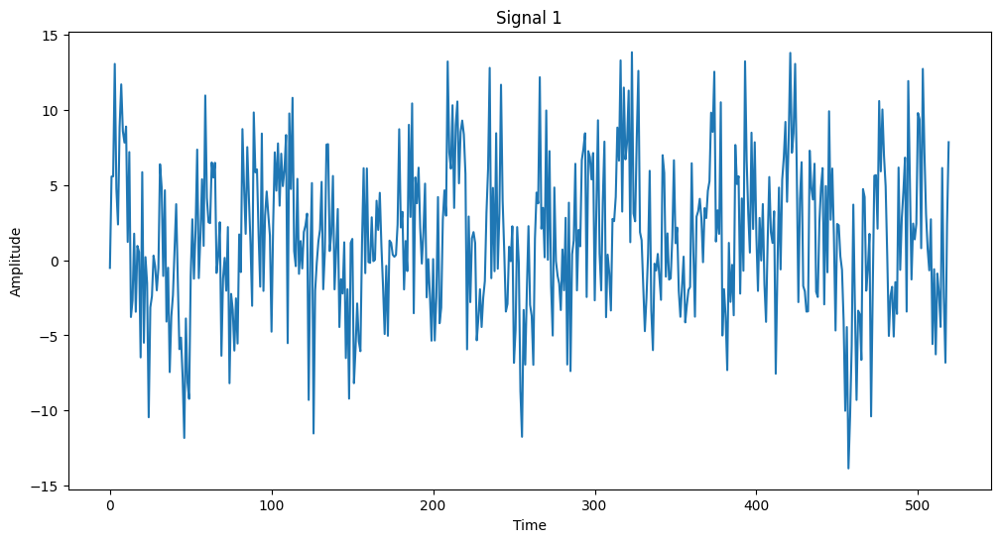

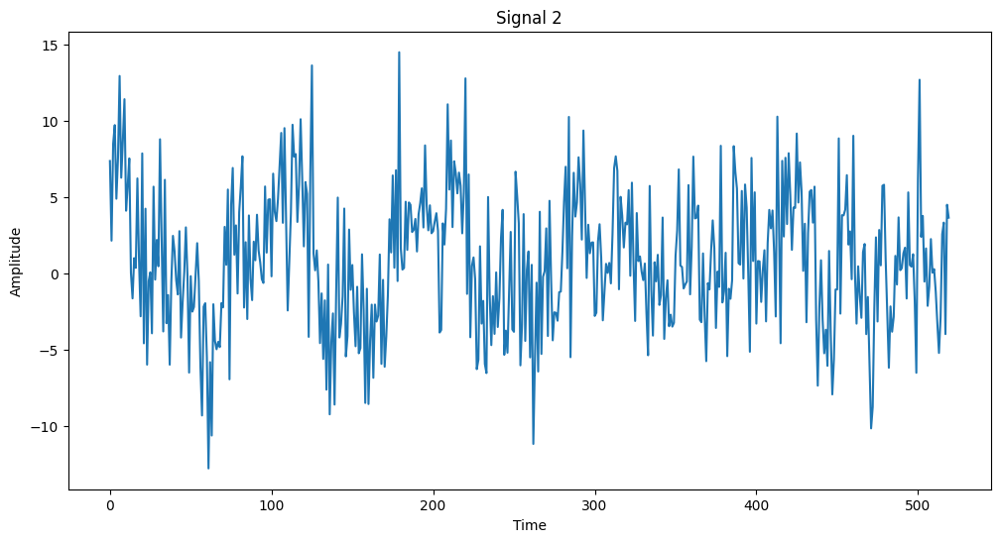

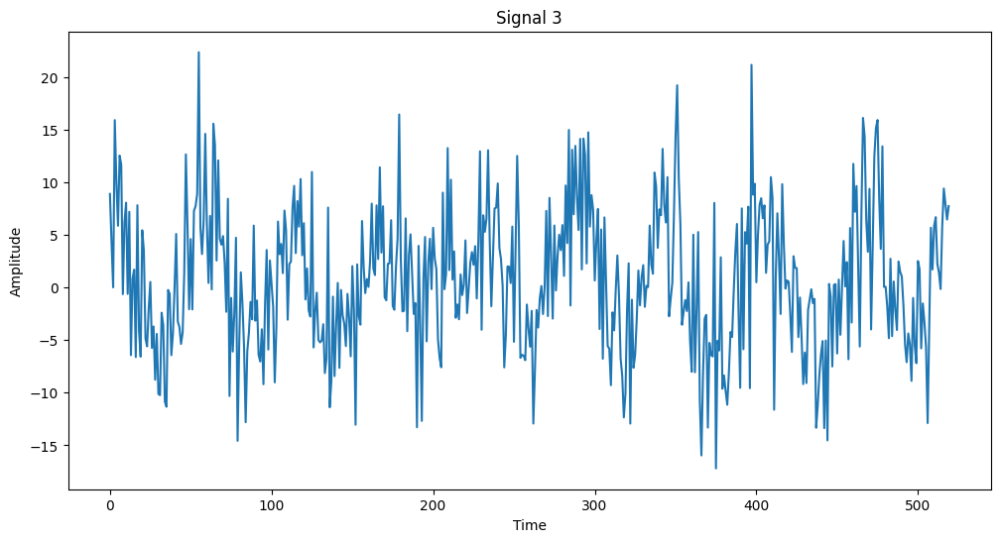

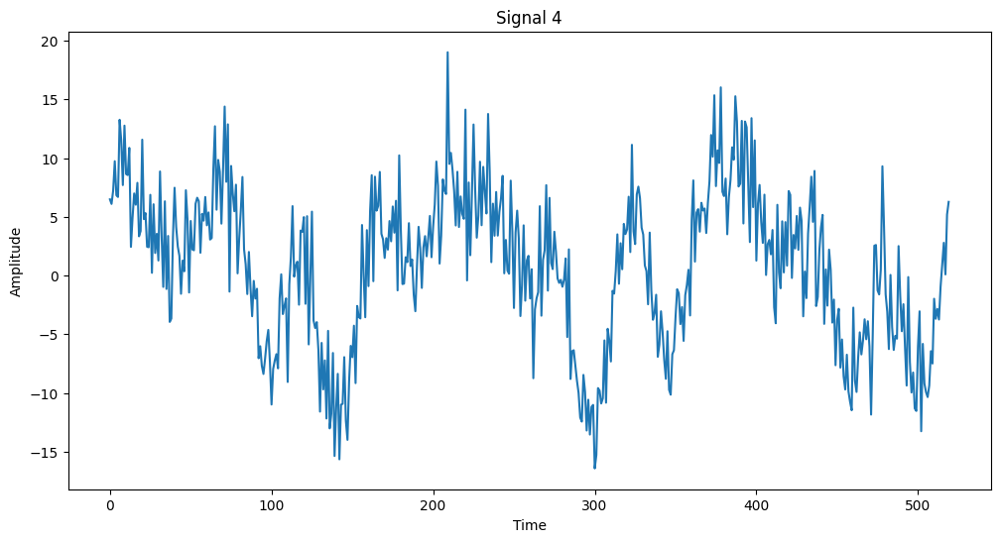

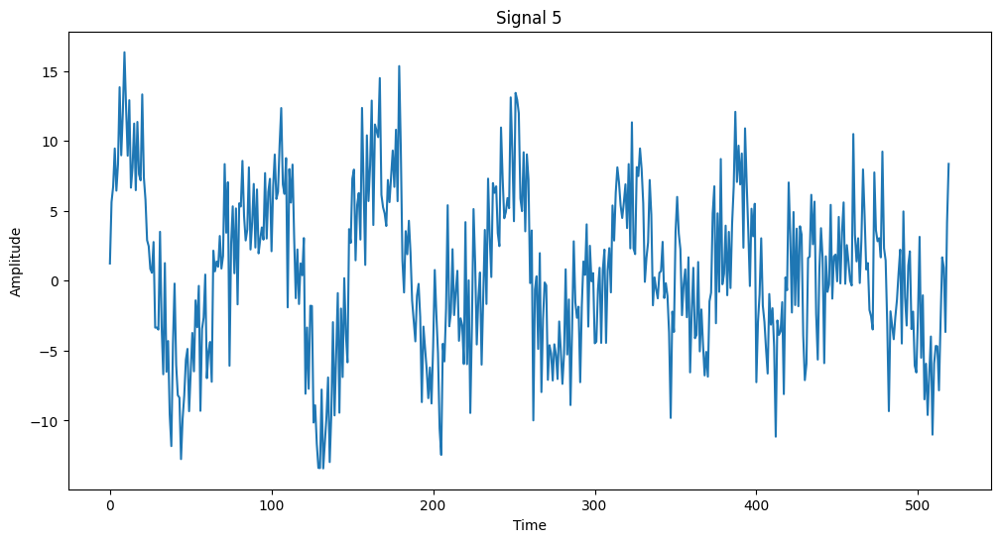

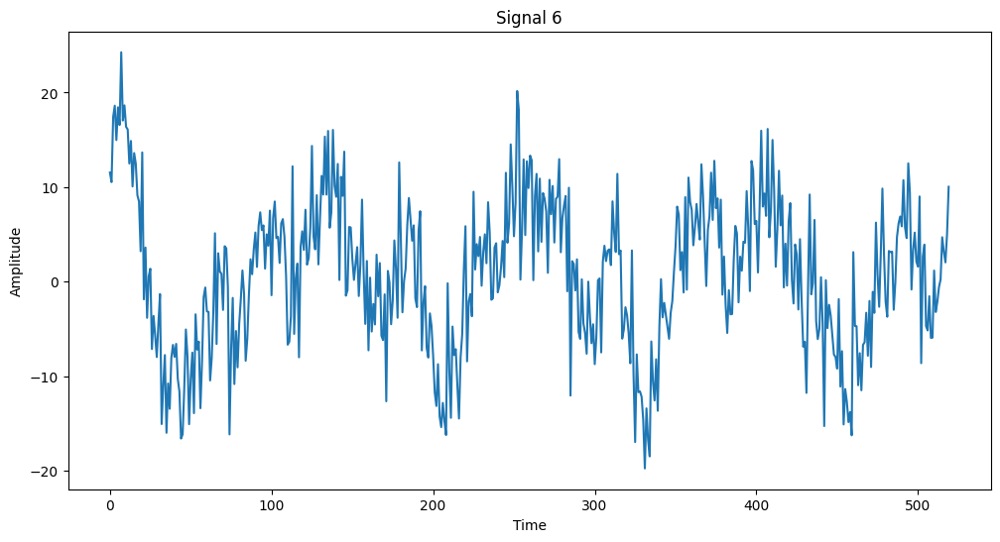

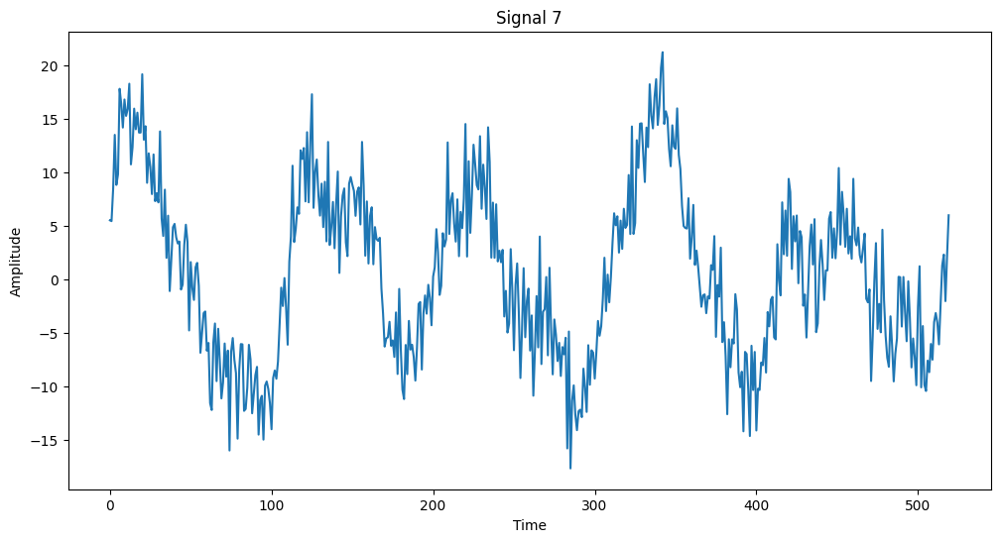

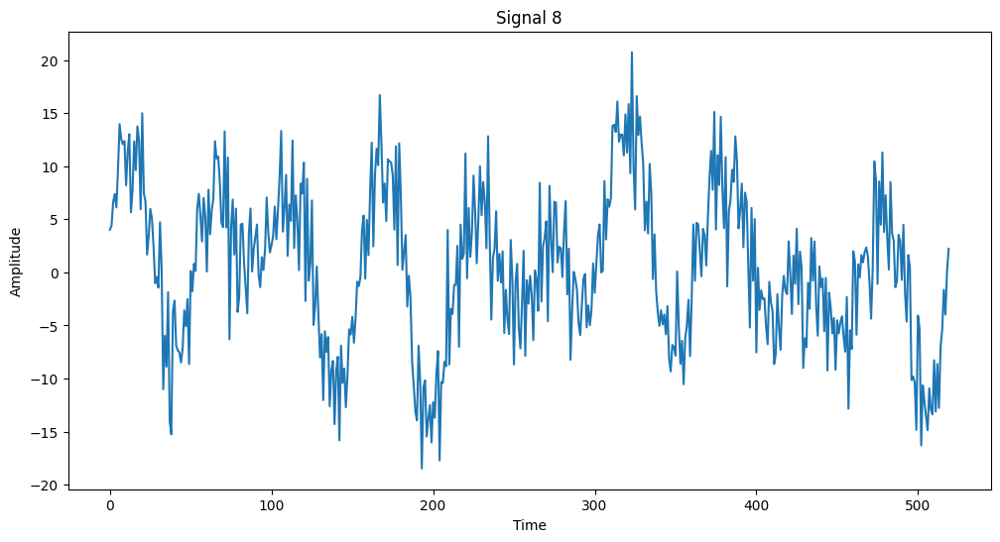

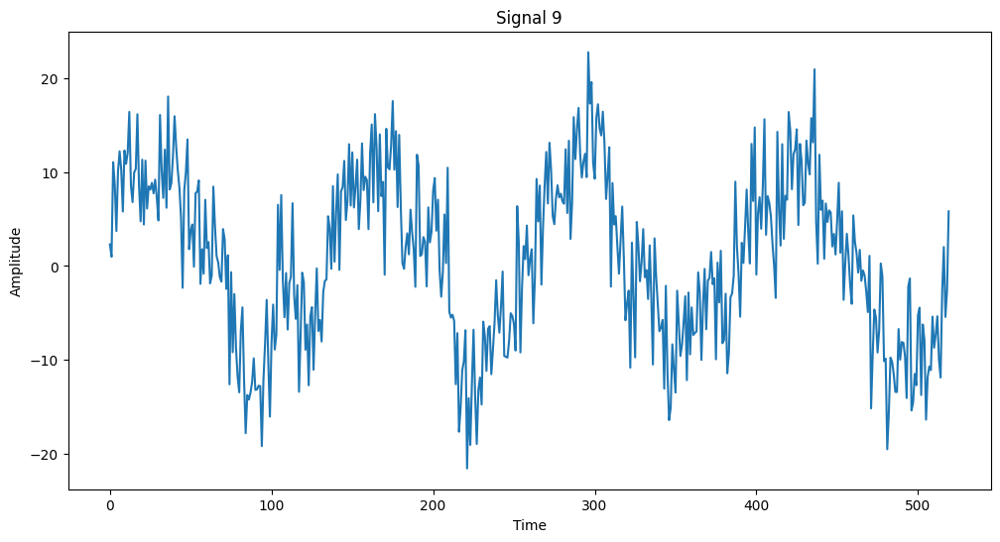

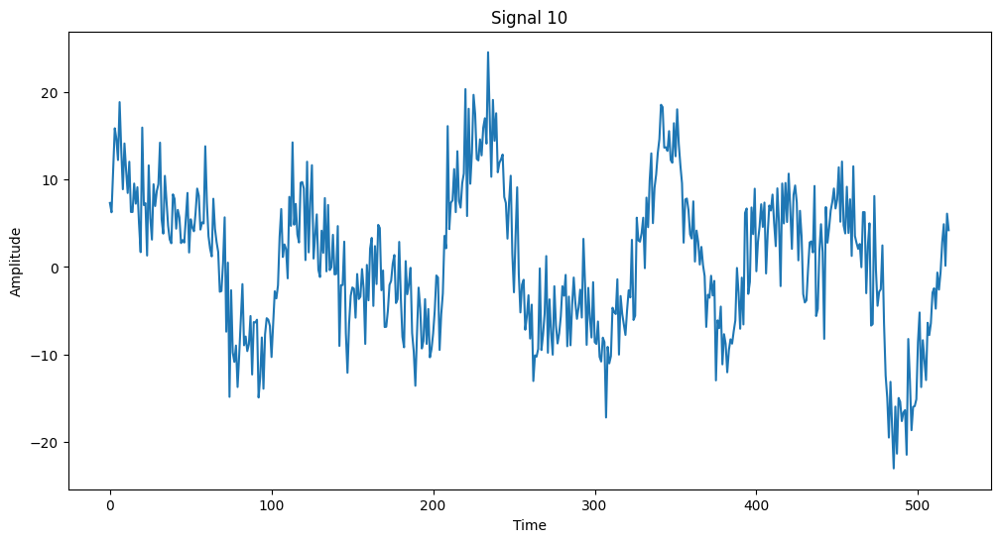

In [ ]:
common_noise = noise(resolution, 3)

signal_1 = (wave(10, resolution, 1) + wave(20, resolution, 3) +
            wave(5, resolution, 2, np.cos) + fading_wave(12, resolution, 2) +
            noise(resolution, 3) + trend(resolution) + wave(18, resolution, 1) +
            trend(resolution, c1=1.2) + common_noise)

signal_2 = (wave(15, resolution, 2) + wave(5, resolution, 2, np.cos) +
            fading_wave(6, resolution, 3, np.sin) + noise(resolution, 2) +
            trend(resolution, c1=0.8) + wave(22, resolution, 1.5) +
            common_noise)

signal_3 = (wave(9, resolution, 5, np.cos) + wave(2, resolution, 2, np.cos) +
            fading_wave(8, resolution, 3, np.sin, reverse=False) +
            noise(resolution, 4) + trend(resolution, c1=1.5) +
            wave(11, resolution, 1.5) + common_noise)

signal_4 = (wave(10, resolution, 4) + wave(3, resolution, 6, np.sin) +
            wave(8, resolution, 2, np.cos) + fading_wave(7, resolution, 3) +
            noise(resolution, 1) + trend(resolution, c1=1.1) +
            wave(13, resolution, 2.5, np.cos) + common_noise)

signal_5 = (wave(6, resolution, 3, np.cos) + wave(11, resolution, 2) +
            wave(7, resolution, 5) + fading_wave(10, resolution, 2.5) +
            noise(resolution, 2) + trend(resolution, c1=1.5) +
            wave(15, resolution, 1.8, np.sin) + common_noise)

signal_6 = (wave(12, resolution, 4) + wave(4, resolution, 7, np.cos) +
            wave(9, resolution, 3) + fading_wave(6, resolution, 4, np.cos) +
            noise(resolution, 3) + trend(resolution, c1=1) +
            wave(17, resolution, 2) + common_noise)

signal_7 = (wave(8, resolution, 2) + wave(5, resolution, 9, np.sin) +
            wave(3, resolution, 4, np.cos) + fading_wave(10, resolution, 3) +
            noise(resolution, 1) + trend(resolution, c1=1.3) +
            wave(14, resolution, 2.5) + common_noise)

signal_8 = (wave(10, resolution, 6) + wave(2, resolution, 3, np.sin) +
            wave(7, resolution, 5) + fading_wave(9, resolution, 2, np.cos) +
            noise(resolution, 2) + trend(resolution, c1=1.8) +
            wave(12, resolution, 1.2) + common_noise)

signal_9 = (wave(14, resolution, 1, np.cos) + wave(4, resolution, 10) +
            wave(6, resolution, 2) + fading_wave(11, resolution, 4, np.sin) +
            noise(resolution, 3) + trend(resolution, c1=2.2) +
            wave(16, resolution, 2.5) + common_noise)

signal_10 = (wave(5, resolution, 8) + wave(3, resolution, 4, np.sin) +
             wave(9, resolution, 6, np.cos) + fading_wave(8, resolution, 2.5) +
             noise(resolution, 2) + trend(resolution, c1=1.3) +
             wave(20, resolution, 1.5) + common_noise)


# rumore_test = noise(resolution, 0.5)

# signal = wave(15, resolution, 5) + rumore_test
# signal_2 = wave(5, resolution, 2, np.cos) + rumore_test
# signal_3 = wave(7, resolution, 3, np.cos) + rumore_test
# signal_4 = wave(6, resolution, 4) + rumore_test
# signal_5 = wave(10, resolution, 6) + rumore_test

signals = [signal_1, signal_2, signal_3, signal_4, signal_5, signal_6, signal_7, signal_8, signal_9, signal_10]

# Create a plot for each signal
for i, signal in enumerate(signals):
    plt.figure(figsize=(12, 6))
    plt.plot(signal)
    plt.title(f'Signal {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.show()

### Multiple LSTM baseline


--- Training on Signal 1 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 187ms/step - loss: 0.2125 - val_loss: 0.0383
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0339 - val_loss: 0.0385
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0327 - val_loss: 0.0394
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0324 - val_loss: 0.0400
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0323 - val_loss: 0.0389
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0321 - val_loss: 0.0385
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0319 - val_loss: 0.0381
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0318 - val_loss: 0.0376
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0317 - val_loss: 0.0373
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0316 - val_loss: 0.0370
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0316 - val_loss: 0.0367
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65

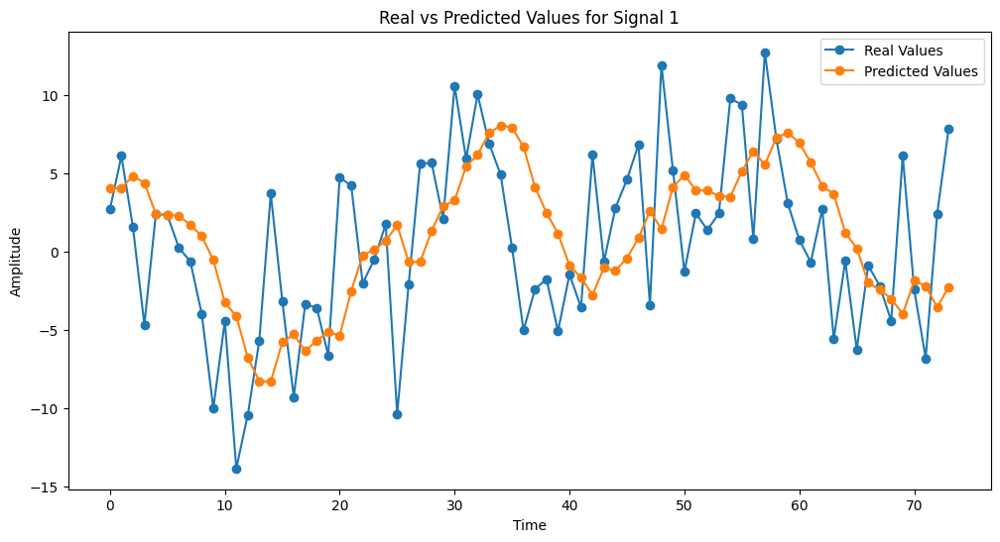


--- Prediction for Signal 2 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
MSE for Signal 2: 19.714095596961425


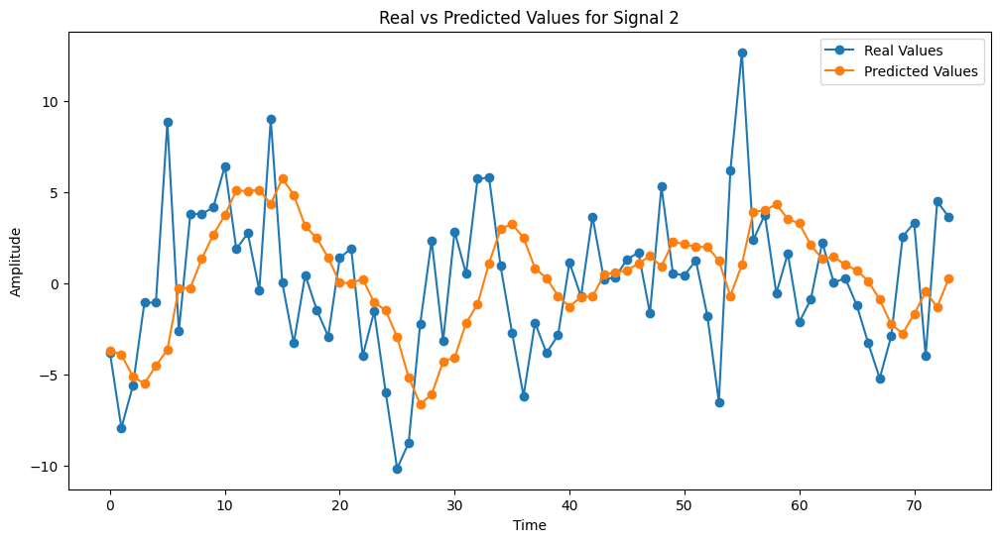


--- Prediction for Signal 3 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
MSE for Signal 3: 29.360223819387908


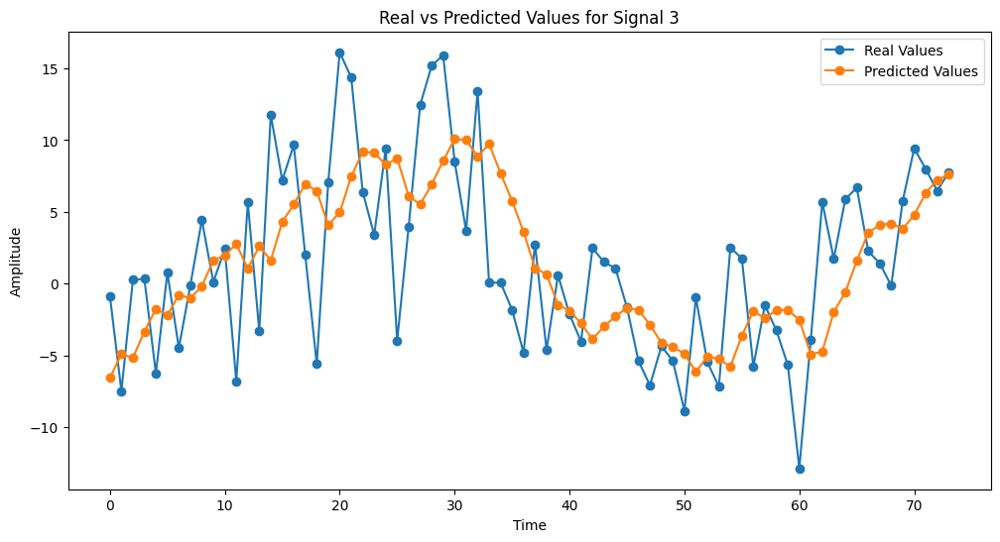


--- Prediction for Signal 4 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
MSE for Signal 4: 13.525493680369081


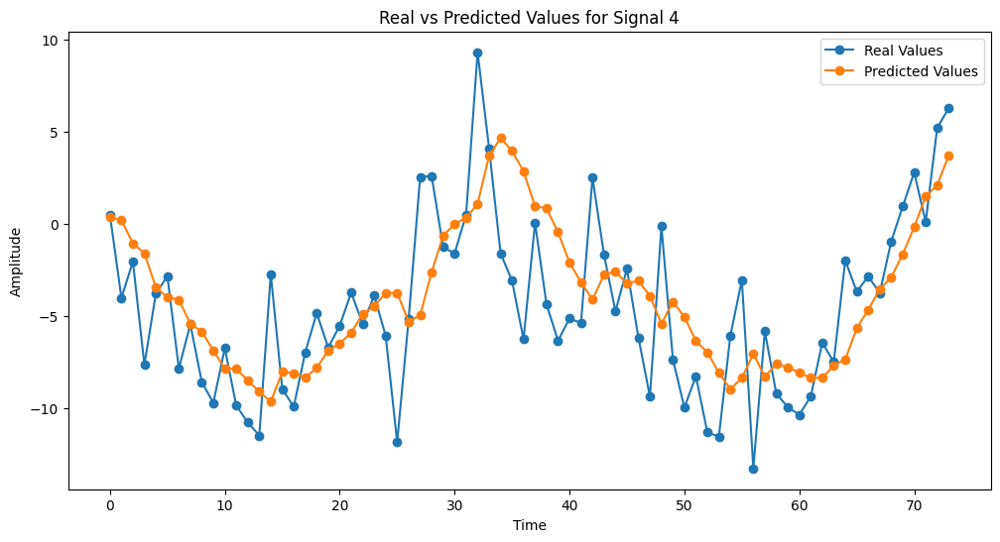


--- Prediction for Signal 5 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
MSE for Signal 5: 15.991350363606772


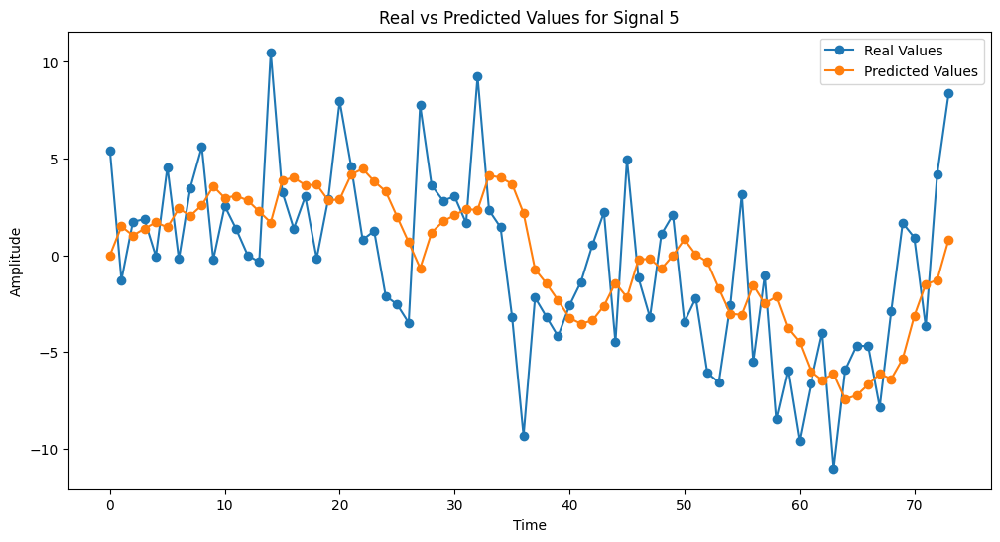


--- Prediction for Signal 6 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
MSE for Signal 6: 22.2064298017204


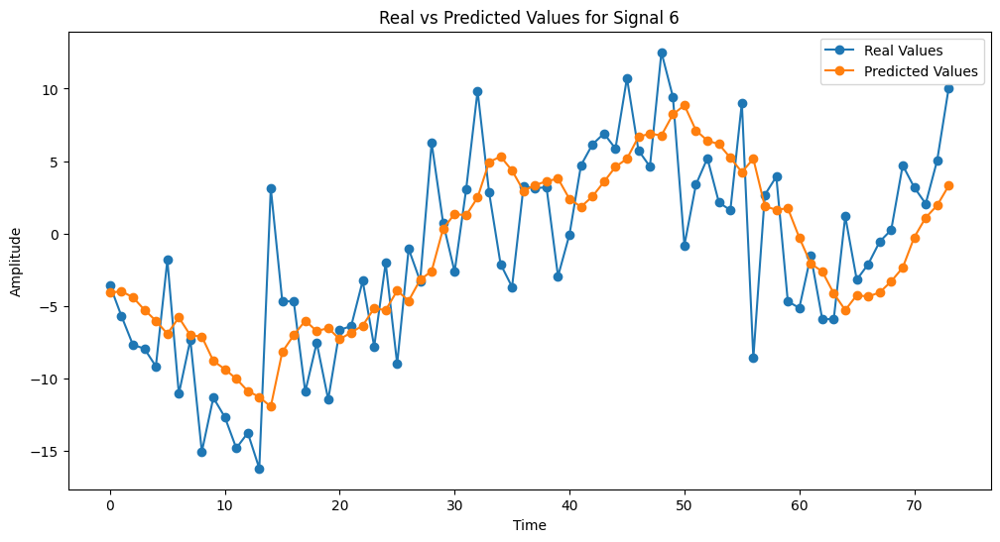


--- Prediction for Signal 7 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
MSE for Signal 7: 13.294700345266278


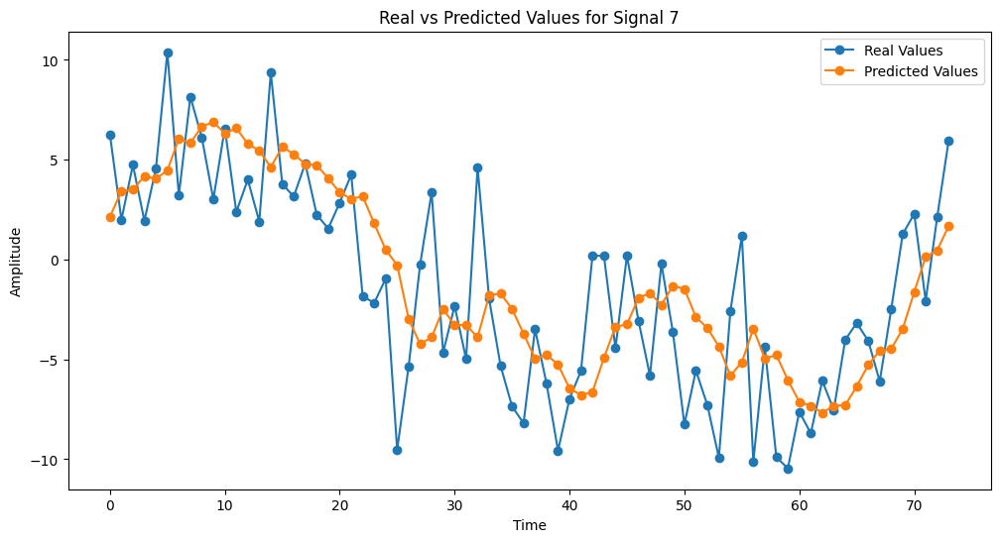


--- Prediction for Signal 8 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
MSE for Signal 8: 16.602763131720952


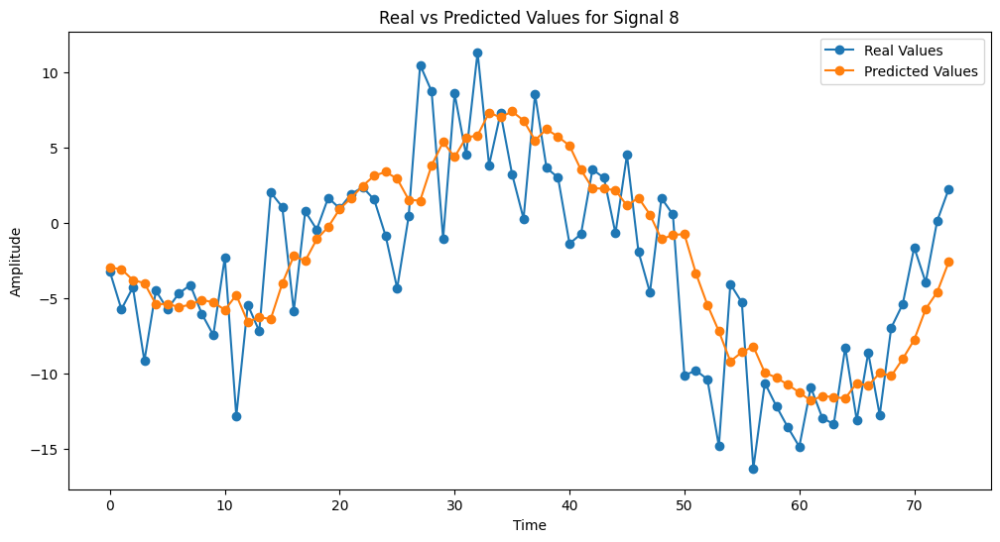


--- Prediction for Signal 9 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
MSE for Signal 9: 20.960721221175387


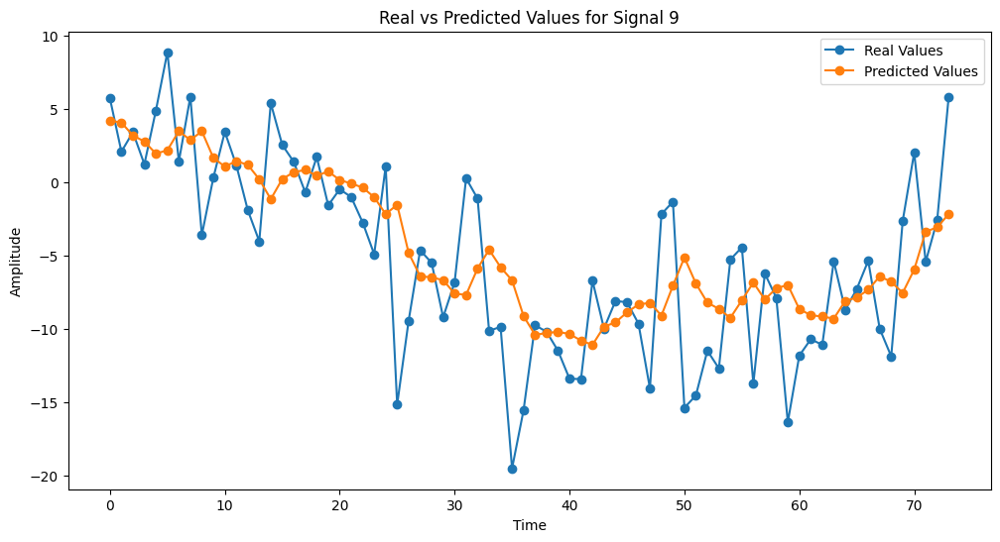


--- Prediction for Signal 10 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
MSE for Signal 10: 20.63815423177481


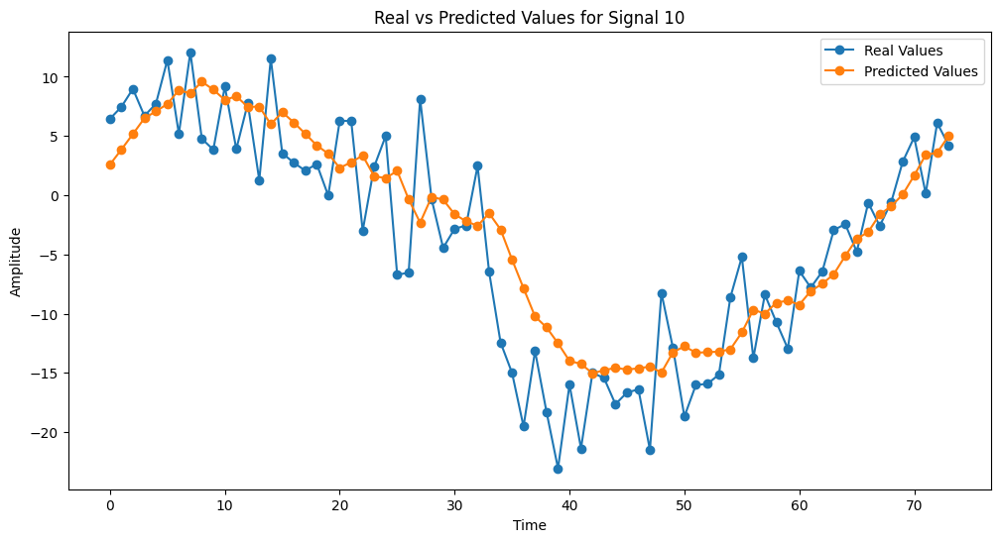

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.losses import MeanSquaredError
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

path_multiple_lstm_10 = '/content/drive/MyDrive/Tirocinio/LstmFourier/Improving/Multiple/SimpleLSTM_10.keras'

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

# Set signals as a list
X_test_list = []
y_test_list = []
sequence_length = 30

# Model creation
input_sales = Input(shape=(sequence_length, 1))
x_time = LSTM(128, activation='relu', return_sequences=False)(input_sales)
x_output = Dense(64, activation='relu')(x_time)
x_output = Dense(1)(x_output)
model = Model(inputs=input_sales, outputs=x_output)
model.compile(optimizer='rmsprop', loss='mse')

# Training loop on each signal
for i, signal in enumerate(signals):
    print(f"\n--- Training on Signal {i+1} ---")

    # Dataset creation per il segnale attuale
    X, y = create_dataset(signal, sequence_length)
    X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

    # Save data test for final prediction
    X_test_list.append(X_test)
    y_test_list.append(y_test)

    # Scaling del dataset
    scaler_X = MinMaxScaler(feature_range=(0, 1))
    scaler_y = MinMaxScaler(feature_range=(0, 1))

    X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, 1)).reshape(X_train.shape)
    X_validation_scaled = scaler_X.transform(X_validation.reshape(-1, 1)).reshape(X_validation.shape)
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)

    y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
    y_validation_scaled = scaler_y.transform(y_validation.reshape(-1, 1)).flatten()

    # Early stopping
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Fit
    model.fit(
        X_train_scaled, y_train_scaled,
        epochs=200,
        batch_size=64,
        validation_data=(X_validation_scaled, y_validation_scaled),
        callbacks=[early_stopping],
        verbose=1
    )

# Save the model
model.save(path_multiple_lstm_10)

# Final prediction
predictions = []
for i, X_test in enumerate(X_test_list):
    print(f"\n--- Prediction for Signal {i+1} ---")

    # Scaling on data
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)
    y_test_scaled = scaler_y.transform(y_test_list[i].reshape(-1, 1)).flatten()

    # Model prediction
    y_pred_scaled = model.predict(X_test_scaled)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_test_inv = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

    predictions.append(y_pred)  # Save the predictions of the current signal

    # MSE for current signal
    mse = mean_squared_error(y_test_inv, y_pred)
    print(f'MSE for Signal {i+1}: {mse}')

    # Plot of the graphs
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_inv, label='Real Values', marker='o')
    plt.plot(y_pred, label='Predicted Values', marker='o')
    plt.title(f'Real vs Predicted Values for Signal {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()


### Multiple BiLSTM - lenght 30


--- Training on Signal 1 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 184ms/step - loss: 0.3153 - val_loss: 0.0451
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0796 - val_loss: 0.0567
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0589 - val_loss: 0.0554
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0608 - val_loss: 0.0502
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.0469 - val_loss: 0.0437
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0452 - val_loss: 0.0391
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0433 - val_loss: 0.0371
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0423 - val_loss: 0.0390
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0440 - val_loss: 0.0413
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0394 - val_loss: 0.0386
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0349 - val_loss: 0.0360
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1

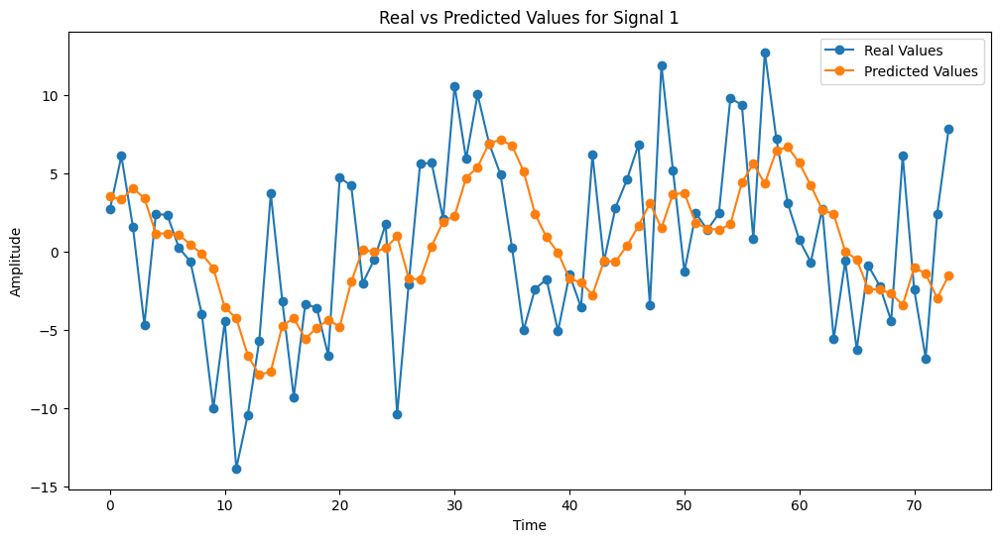


--- Prediction for Signal 2 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
MSE for Signal 2: 17.782442092895508


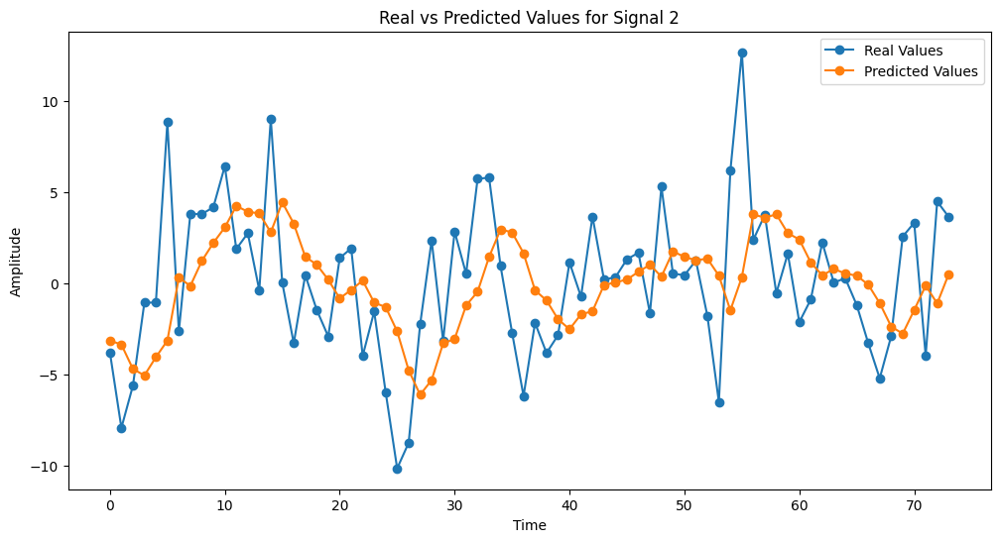


--- Prediction for Signal 3 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
MSE for Signal 3: 29.242511749267578


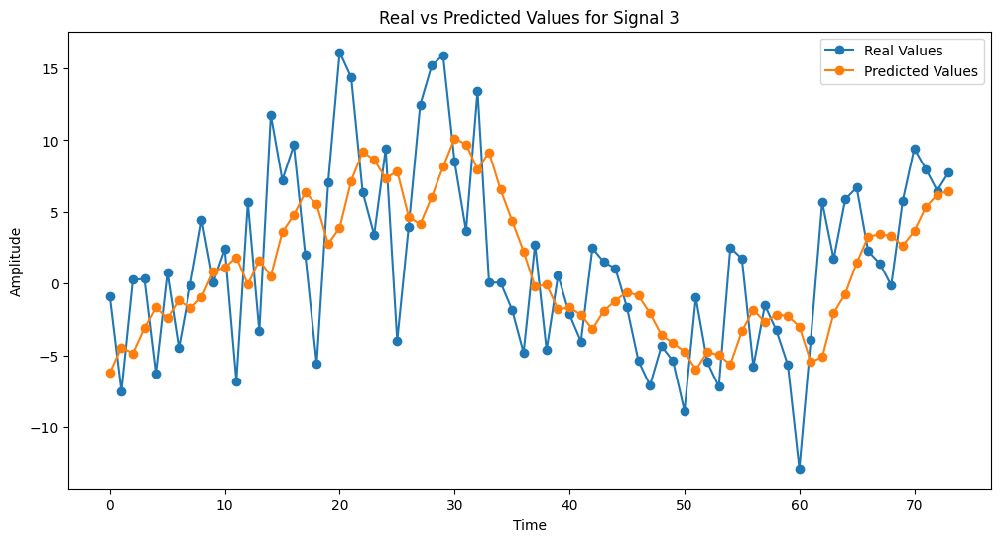


--- Prediction for Signal 4 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
MSE for Signal 4: 13.479537963867188


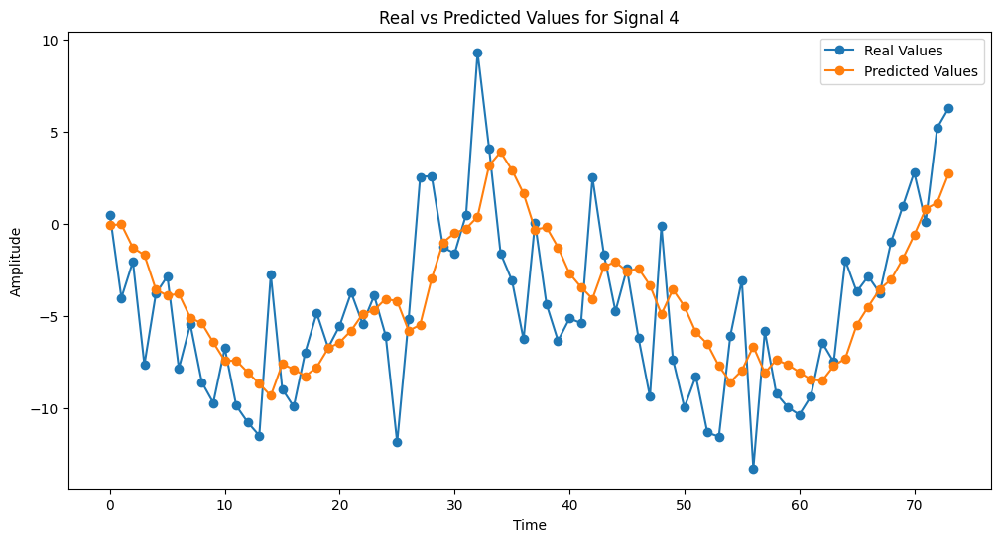


--- Prediction for Signal 5 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
MSE for Signal 5: 15.127965927124023


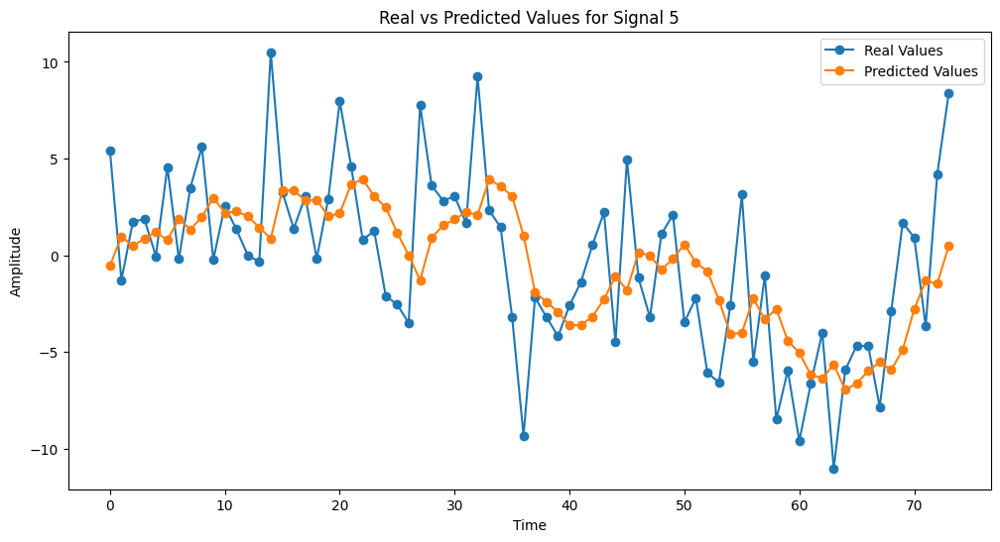


--- Prediction for Signal 6 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
MSE for Signal 6: 21.189350128173828


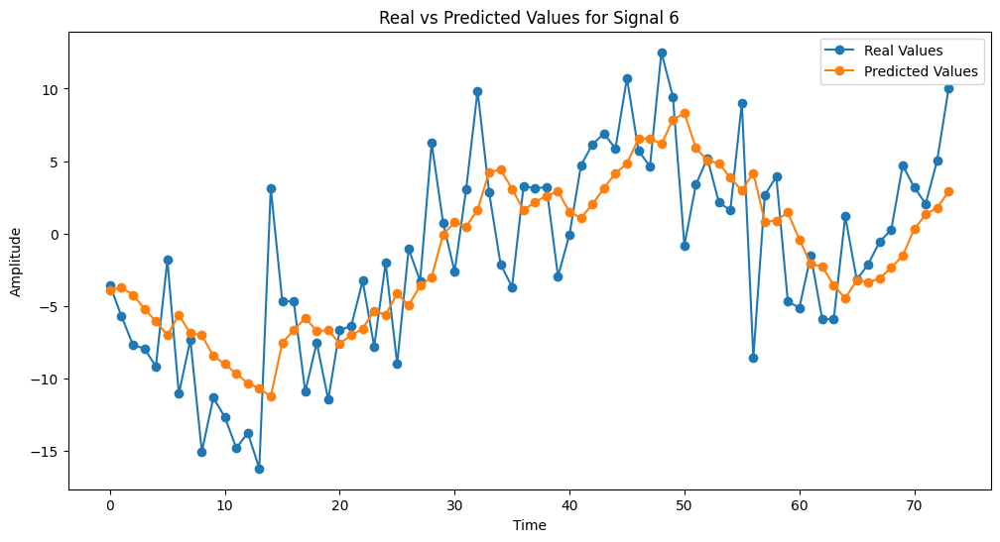


--- Prediction for Signal 7 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
MSE for Signal 7: 12.96065616607666


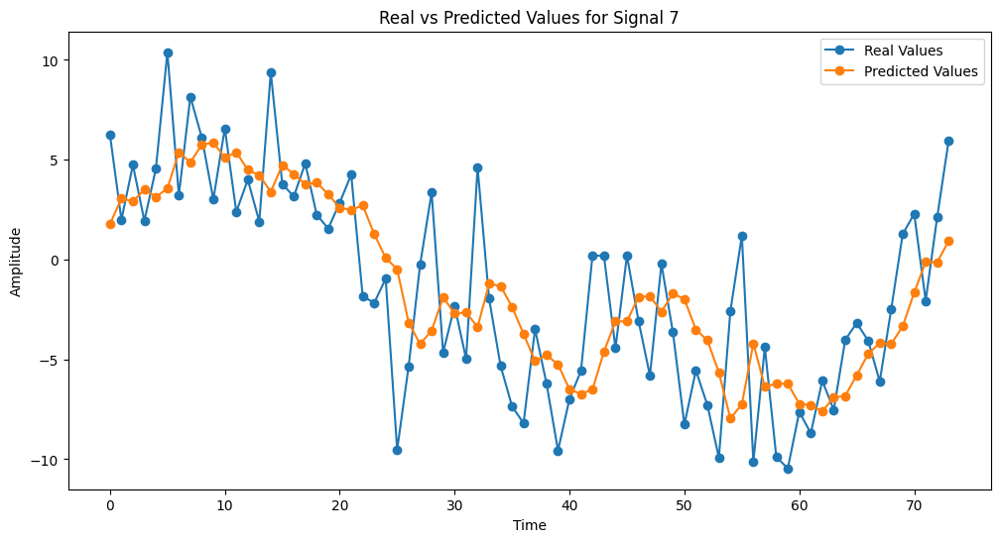


--- Prediction for Signal 8 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
MSE for Signal 8: 16.820148468017578


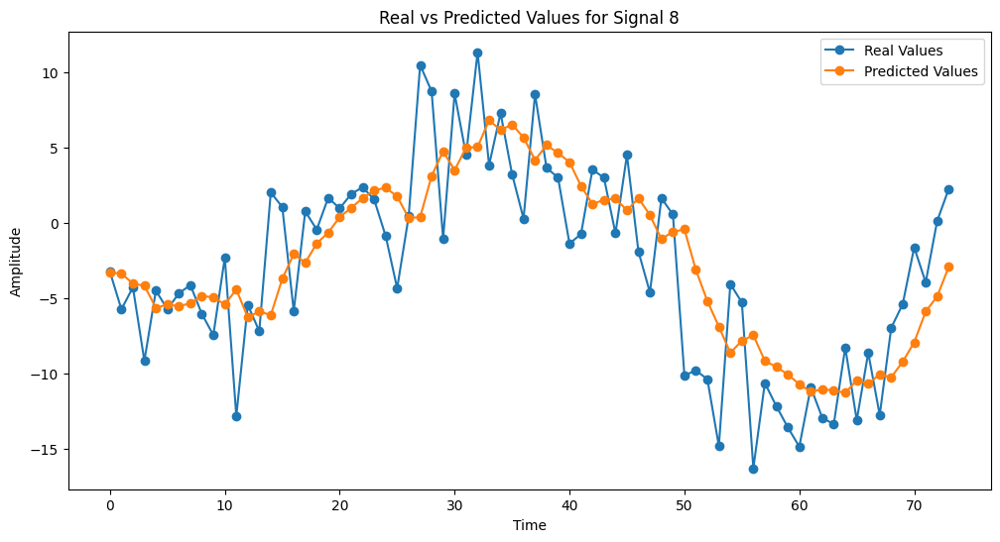


--- Prediction for Signal 9 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
MSE for Signal 9: 21.258481979370117


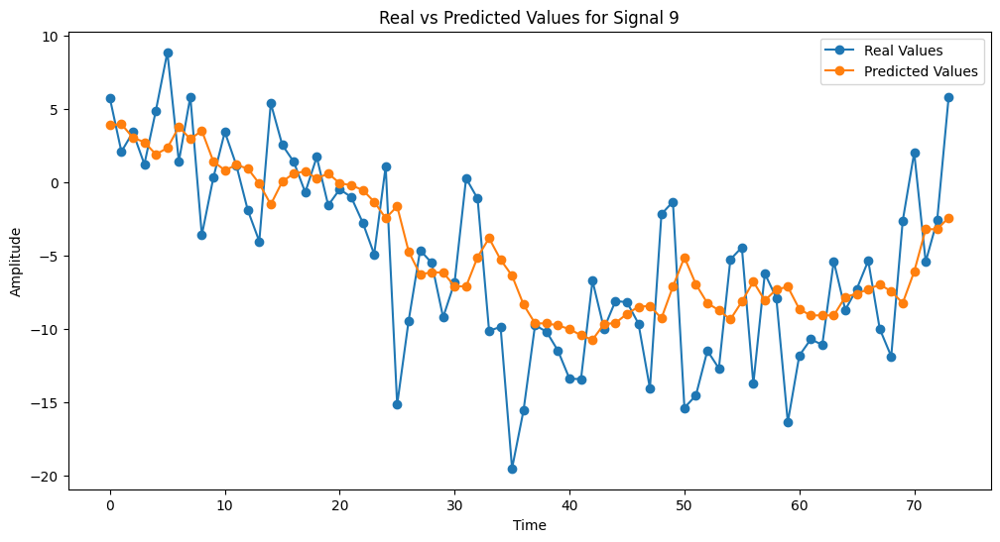


--- Prediction for Signal 10 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
MSE for Signal 10: 23.315898895263672


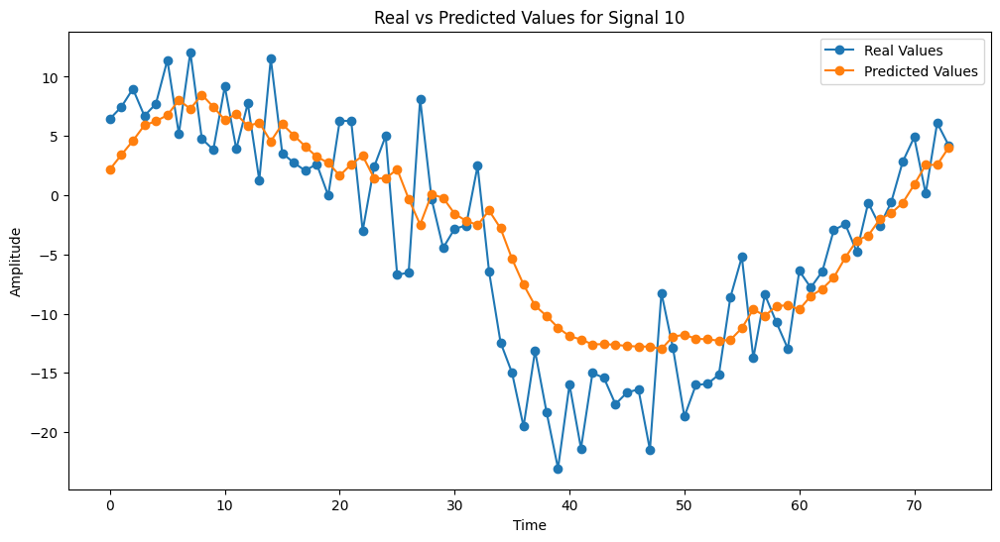

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dropout, Lambda, Dense, Flatten, Multiply, Reshape, Activation, Concatenate
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.losses import MeanSquaredError

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Define the Fourier Transform Layer with peak detection and filtering
def fourier_transform_layer_v4(x):
    x = tf.squeeze(x, axis=-1)  # Remove last dimension if it's 1
    x_fft = tf.signal.rfft(x)  # Shape: (batch_size, fft_length)
    magnitude = tf.abs(x_fft)  # Amplitude spectrum
    # Exclude zero frequency
    magnitude_nonzero = magnitude[:, 1:]  # Shape: (batch_size, fft_length - 1)
    # Gather valid frequencies based on period range
    magnitude_filtered = tf.gather(magnitude_nonzero, valid_indices, axis=1)
    return magnitude_filtered  # Shape: (batch_size, num_valid_freqs)

# Call the seed function before model training
set_seed(42)

path_multiple_bilstm_30 = '/content/drive/MyDrive/Tirocinio/LstmFourier/Improving/Multiple/BiLSTM_30_10.keras'

X_test_list = []
y_test_list = []
sequence_length = 30

# BiLSTM with frequency attention
input_sales = Input(shape=(sequence_length, 1))

# Temporal branch
x_time = Bidirectional(LSTM(128, activation='relu', return_sequences=False))(input_sales)
x_time = Dropout(0.1)(x_time)

# Frequency branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_scores = Flatten()(attention_scores)
attention_weights = Activation('sigmoid')(attention_scores)
attention_weights = Reshape((-1, 1))(attention_weights)

x_freq_attended = Multiply()([x_freq, attention_weights])
x_freq_flat = Flatten()(x_freq_attended)
x_freq_flat = Dropout(0.1)(x_freq_flat)
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)
x_freq_dense = Dropout(0.1)(x_freq_dense)

# Combine the two branches
x_combined = Concatenate()([x_time, x_freq_dense])

# Output levels
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dropout(0.1)(x_output)
x_output = Dense(1)(x_output)

model = Model(inputs=input_sales, outputs=x_output)
model.compile(optimizer='rmsprop', loss='mse')

# Early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)

# Loop training on signals
for i, signal in enumerate(signals):
    print(f"\n--- Training on Signal {i+1} ---")

    # Dataset creation
    X, y = create_dataset(signal, sequence_length)
    X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

    X_test_list.append(X_test)
    y_test_list.append(y_test)

    # Scaling of the dataset
    scaler_X = MinMaxScaler(feature_range=(0, 1))
    scaler_y = MinMaxScaler(feature_range=(0, 1))

    X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, 1)).reshape(X_train.shape)
    X_validation_scaled = scaler_X.transform(X_validation.reshape(-1, 1)).reshape(X_validation.shape)
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)

    y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
    y_validation_scaled = scaler_y.transform(y_validation.reshape(-1, 1)).flatten()

    # Model training
    model.fit(
        X_train_scaled, y_train_scaled,
        epochs=200,
        batch_size=64,
        validation_data=(X_validation_scaled, y_validation_scaled),
        callbacks=[early_stopping],
        verbose=1
    )

model.save(path_multiple_bilstm_30)

# Final predictions
predictions = []
mse = MeanSquaredError()
for i, X_test in enumerate(X_test_list):
    print(f"\n--- Prediction for Signal {i+1} ---")

    # Data scaling
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)
    y_test_scaled = scaler_y.transform(y_test_list[i].reshape(-1, 1)).flatten()

    # Model prediction
    y_pred_scaled = model.predict(X_test_scaled)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_test_inv = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

    predictions.append(y_pred)  # Save the prediction

    # MSE
    test_mse = mse(y_test_inv, y_pred).numpy()
    print(f'MSE for Signal {i+1}: {test_mse}')

    # Plotting on the result
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_inv, label='Real Values', marker='o')
    plt.plot(y_pred, label='Predicted Values', marker='o')
    plt.title(f'Real vs Predicted Values for Signal {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()


### Multiple BiLSTM - lenght 60


--- Training on Signal 1 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.6010 - val_loss: 0.0533
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1705 - val_loss: 0.0861
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.1297 - val_loss: 0.1871
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 290ms/step - loss: 0.1454 - val_loss: 0.0530
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 298ms/step - loss: 0.0869 - val_loss: 0.0367
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0889 - val_loss: 0.0730
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0821 - val_loss: 0.1045
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0757 - val_loss: 0.0413
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0589 - val_loss: 0.0552
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0678 - val_loss: 0.0810
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0715 - val_loss: 0.0432
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━

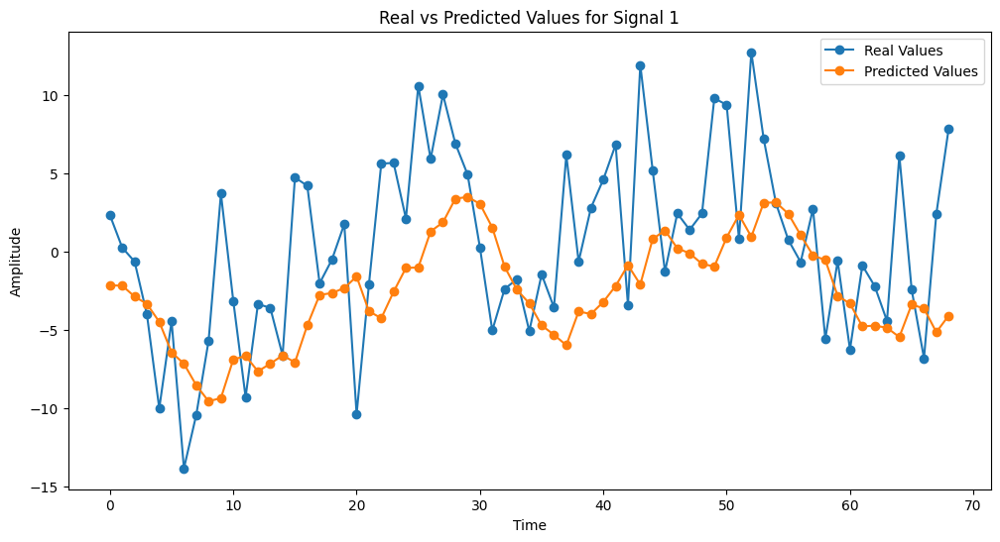


--- Prediction for Signal 2 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
MSE for Signal 2: 26.935897827148438


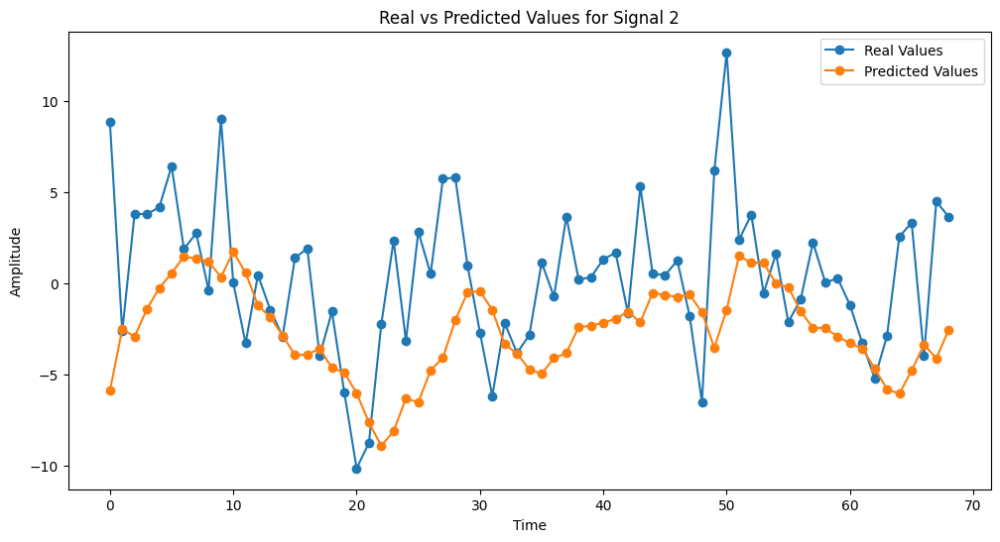


--- Prediction for Signal 3 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
MSE for Signal 3: 39.69137954711914


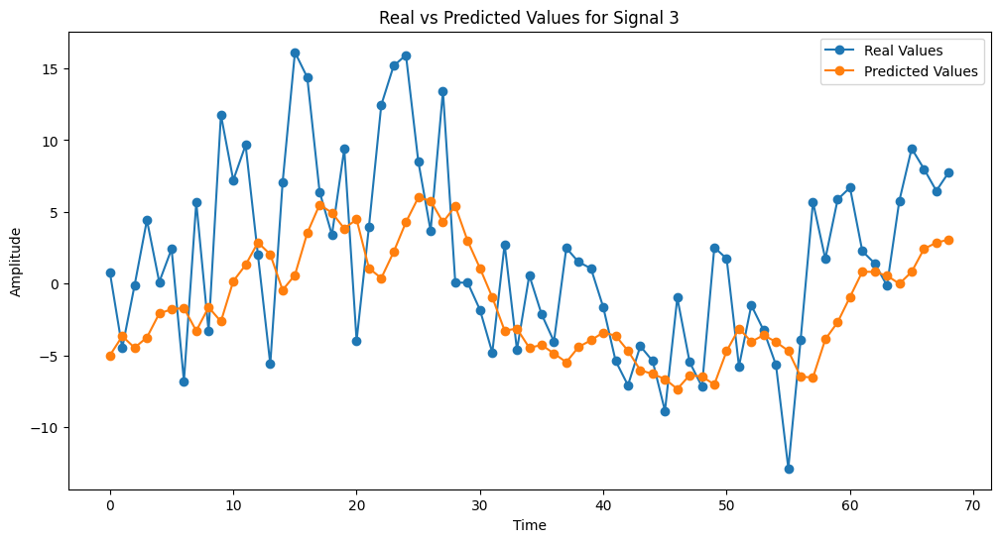


--- Prediction for Signal 4 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
MSE for Signal 4: 15.430709838867188


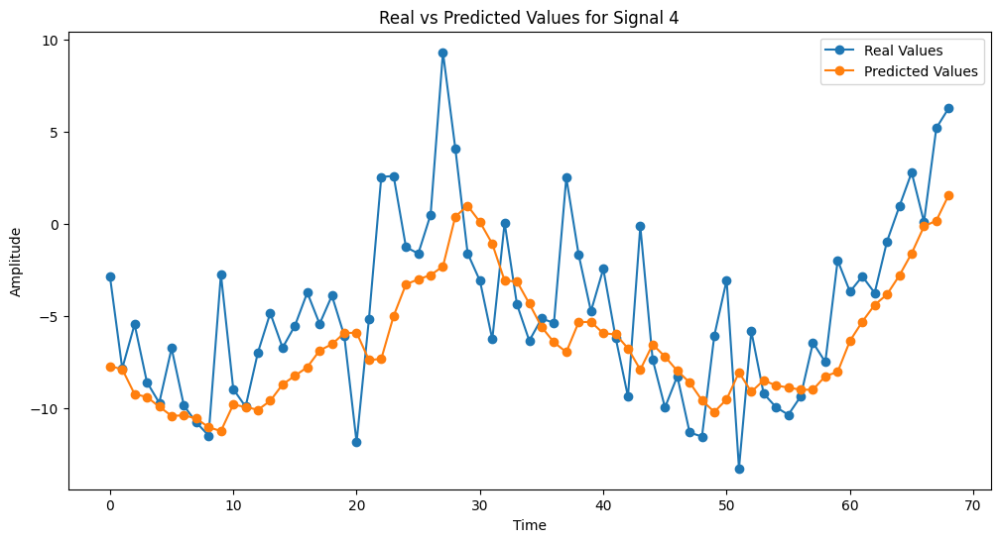


--- Prediction for Signal 5 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
MSE for Signal 5: 23.486953735351562


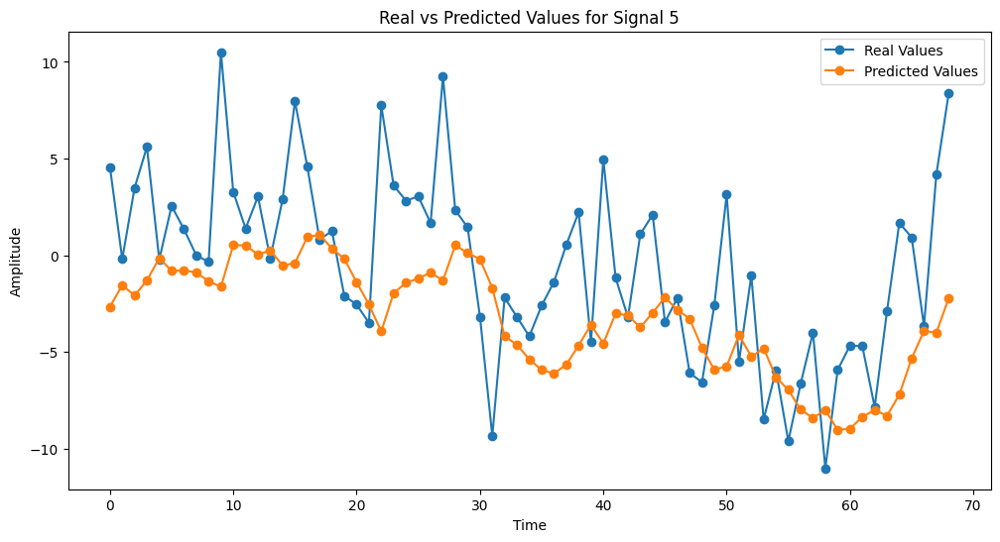


--- Prediction for Signal 6 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
MSE for Signal 6: 27.957117080688477


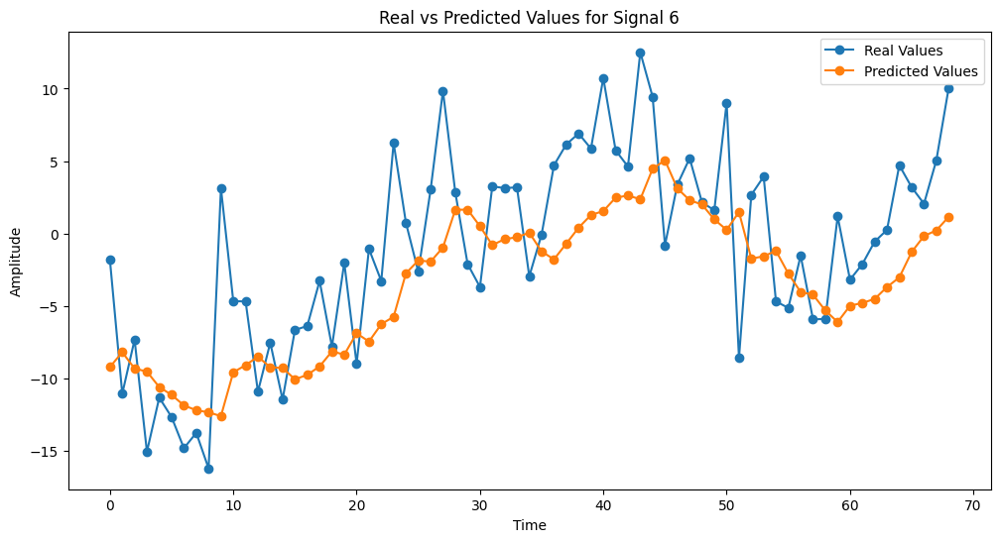


--- Prediction for Signal 7 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
MSE for Signal 7: 18.223674774169922


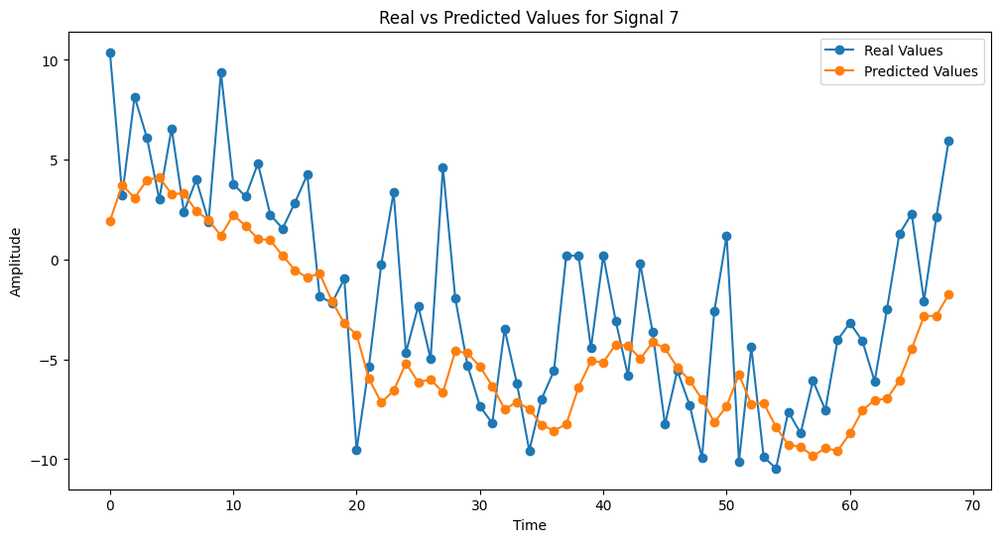


--- Prediction for Signal 8 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
MSE for Signal 8: 20.459028244018555


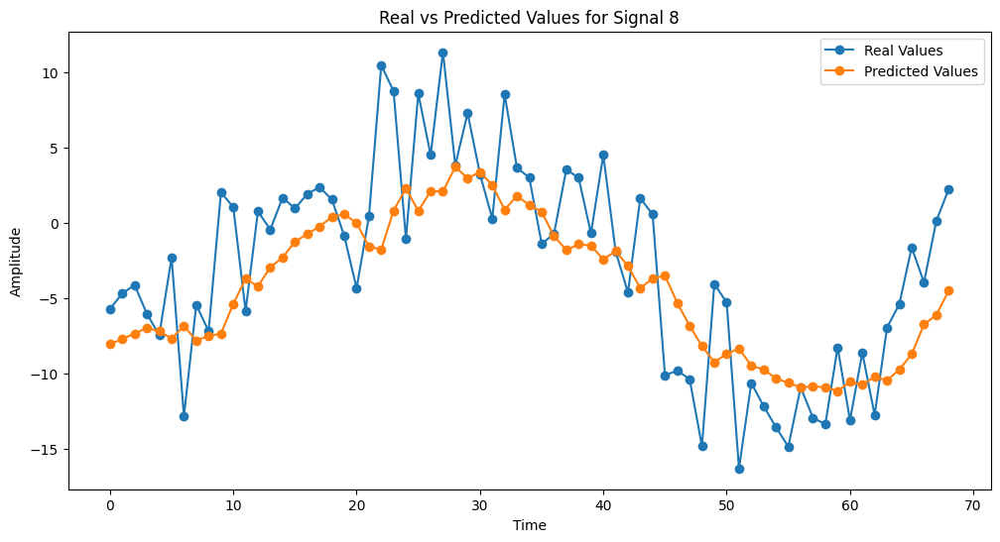


--- Prediction for Signal 9 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
MSE for Signal 9: 25.762327194213867


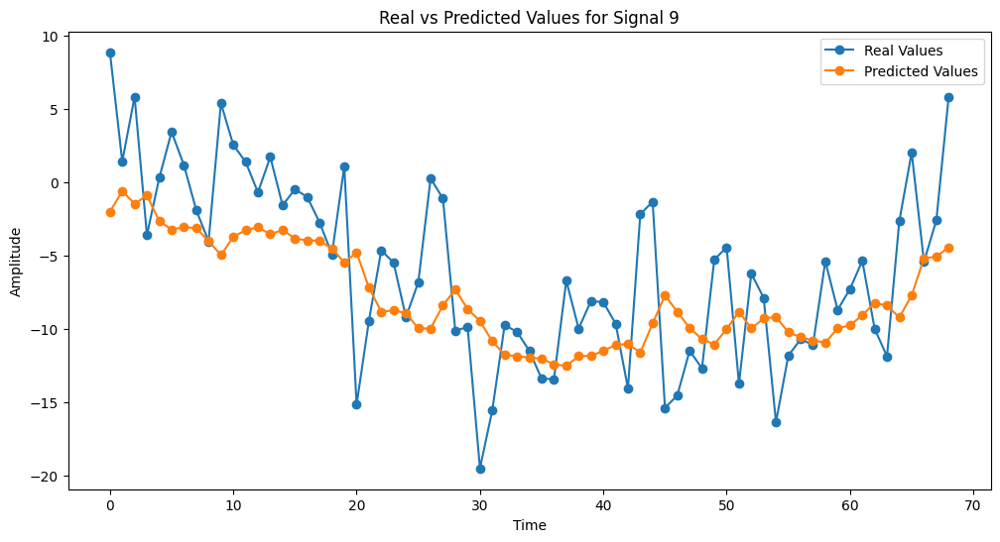


--- Prediction for Signal 10 ---
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
MSE for Signal 10: 30.280994415283203


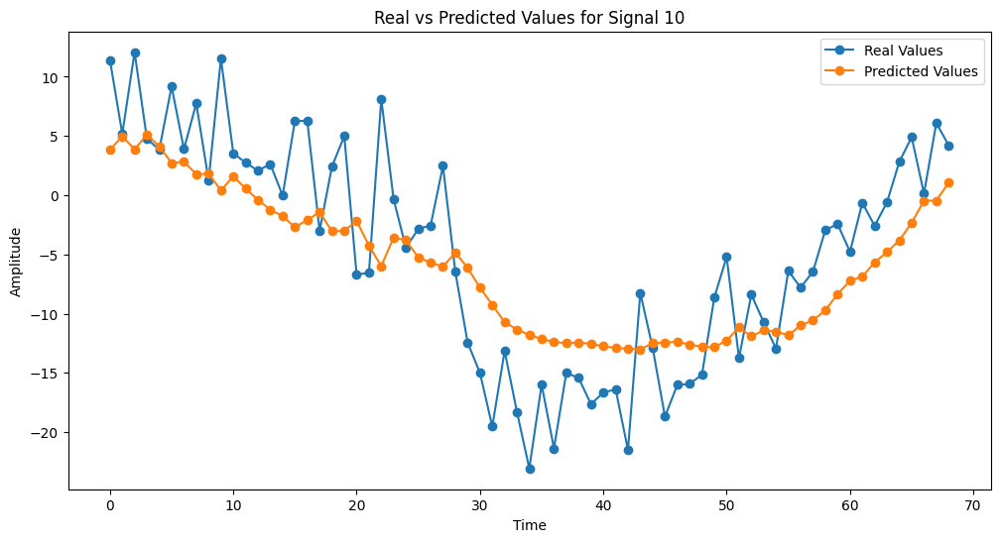

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dropout, Lambda, Dense, Flatten, Multiply, Reshape, Activation, Concatenate
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.losses import MeanSquaredError

# Enable deterministic operations in TensorFlow (if applicable)
tf.config.experimental.enable_op_determinism()

# Define the Fourier Transform Layer with peak detection and filtering
def fourier_transform_layer_v4(x):
    x = tf.squeeze(x, axis=-1)  # Remove last dimension if it's 1
    x_fft = tf.signal.rfft(x)  # Shape: (batch_size, fft_length)
    magnitude = tf.abs(x_fft)  # Amplitude spectrum
    # Exclude zero frequency
    magnitude_nonzero = magnitude[:, 1:]  # Shape: (batch_size, fft_length - 1)
    # Gather valid frequencies based on period range
    magnitude_filtered = tf.gather(magnitude_nonzero, valid_indices, axis=1)
    return magnitude_filtered  # Shape: (batch_size, num_valid_freqs)

# Set seeds for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

# Call the seed function before model training
set_seed(42)

path_multiple_bilstm_60_10 = '/content/drive/MyDrive/Tirocinio/LstmFourier/Improving/Multiple/BiLSTM_60_10.keras'

# Imposta i segnali in una lista
X_test_list = []
y_test_list = []
sequence_length = 60

# BiLSTM with frequency attention
input_sales = Input(shape=(sequence_length, 1))

# Temporal branch
x_time = Bidirectional(LSTM(128, activation='relu', return_sequences=False))(input_sales)
x_time = Dropout(0.1)(x_time)

# Frequency branch
x_freq = Lambda(fourier_transform_layer_v4)(input_sales)
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_scores = Flatten()(attention_scores)
attention_weights = Activation('sigmoid')(attention_scores)
attention_weights = Reshape((-1, 1))(attention_weights)

x_freq_attended = Multiply()([x_freq, attention_weights])
x_freq_flat = Flatten()(x_freq_attended)
x_freq_flat = Dropout(0.1)(x_freq_flat)
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)
x_freq_dense = Dropout(0.1)(x_freq_dense)

# Combine the two branches
x_combined = Concatenate()([x_time, x_freq_dense])

# Output levels
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dropout(0.1)(x_output)
x_output = Dense(1)(x_output)

model = Model(inputs=input_sales, outputs=x_output)
model.compile(optimizer='rmsprop', loss='mse')

# Early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True)

# Loop on training
for i, signal in enumerate(signals):
    print(f"\n--- Training on Signal {i+1} ---")

    # Dataset creation
    X, y = create_dataset(signal, sequence_length)
    X_train, y_train, X_validation, y_validation, X_test, y_test = divide_dataset_validation(X, y)

    # Saving the data
    X_test_list.append(X_test)
    y_test_list.append(y_test)

    # Scaling of the dataset
    scaler_X = MinMaxScaler(feature_range=(0, 1))
    scaler_y = MinMaxScaler(feature_range=(0, 1))

    X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, 1)).reshape(X_train.shape)
    X_validation_scaled = scaler_X.transform(X_validation.reshape(-1, 1)).reshape(X_validation.shape)
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)

    y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
    y_validation_scaled = scaler_y.transform(y_validation.reshape(-1, 1)).flatten()

    # Model fit
    model.fit(
        X_train_scaled, y_train_scaled,
        epochs=200,
        batch_size=64,
        validation_data=(X_validation_scaled, y_validation_scaled),
        callbacks=[early_stopping],
        verbose=1
    )

model.save(path_multiple_bilstm_60_10)

# Final prediction
predictions = []
mse = MeanSquaredError()
for i, X_test in enumerate(X_test_list):
    print(f"\n--- Prediction for Signal {i+1} ---")

    # Scaling of the data
    X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)
    y_test_scaled = scaler_y.transform(y_test_list[i].reshape(-1, 1)).flatten()

    # Model predictions
    y_pred_scaled = model.predict(X_test_scaled)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_test_inv = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

    predictions.append(y_pred)  # Save the predictions

    # MSE
    test_mse = mse(y_test_inv, y_pred).numpy()
    print(f'MSE for Signal {i+1}: {test_mse}')

    # Plot the graph
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_inv, label='Real Values', marker='o')
    plt.plot(y_pred, label='Predicted Values', marker='o')
    plt.title(f'Real vs Predicted Values for Signal {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()


# Average section

In [ ]:
import numpy as np
import pandas as pd

def create_dataset_with_baseline(series, sequence_length):

    # Step 1: Generate lag features for the series
    lags = [series.shift(i) for i in range(1, sequence_length + 1)]
    lag_df = pd.concat(lags, axis=1)
    lag_df.columns = [f'y-{i}' for i in range(1, sequence_length + 1)]

    # Drop initial rows with NaN values due to shifting (first 'sequence_length' rows)
    lag_df = lag_df.dropna().reset_index(drop=True)

    # Step 2: Calculate rolling means for different window sizes
    week = series.rolling(window=7).mean()
    two_weeks = series.rolling(window=14).mean()
    month = series.rolling(window=30).mean()

    # Combine rolling means into a DataFrame
    rolling_features = pd.DataFrame({
        'week': week,
        'two_weeks': two_weeks,
        'month': month
    })

    # The rolling features table will naturally have NaNs at the beginning due to window sizes
    # Drop those rows with NaNs to create a clean rolling table
    rolling_features = rolling_features.dropna().reset_index(drop=True)

    # Target variable (aligned to the length of the original series minus the sequence_length)
    target = series.iloc[sequence_length:].reset_index(drop=True).values

    return lag_df, rolling_features, target

# Example usage
test_series = pd.Series(wave(5, 520, 10))
sequence_len = 2

# Create the dataset with the lag and rolling features
lag_table, rolling_table, y = create_dataset_with_baseline(test_series, sequence_len)

# Display the lag and rolling tables
print("Lag Table:")
print(lag_table)
print("\nRolling Table:")
print(rolling_table)

# Optionally print the shape of y
print(f"\ny shape: {y.shape}")

Lag Table:
          y-1       y-2
0    0.603785  0.000000
1    1.205367  0.603785
2    1.802550  1.205367
3    2.393157  1.802550
4    2.975031  2.393157
..        ...       ...
513 -3.546049 -4.104128
514 -2.975031 -3.546049
515 -2.393157 -2.975031
516 -1.802550 -2.393157
517 -1.205367 -1.802550

[518 rows x 2 columns]

Rolling Table:
         week  two_weeks     month
0    9.927155   9.489863  6.673861
1    9.909044   9.595548  6.997508
2    9.854775   9.666219  7.295623
3    9.764548   9.701619  7.567116
4    9.638690   9.701619  7.810997
..        ...        ...       ...
486 -4.613379  -6.213936 -8.026377
487 -4.074232  -5.752407 -7.810997
488 -3.520218  -5.269888 -7.567116
489 -2.953359  -4.768140 -7.295623
490 -2.375724  -4.248994 -6.997508

[491 rows x 3 columns]

y shape: (518,)


## Combination test

In [ ]:
def divide_set(series, ratio):
  index = int(len(series) * ratio)
  return series[:index], series[index:]

The three generated plots represent different aspects of the Fourier transformation on the composite signal, revealing key information about its structure in both the time and frequency domains.

Here’s a detailed explanation of each plot:

### 1. **Original Signal Plot (Signal in the Time Domain)**

   - **What it shows**: This plot displays the original signal in the time domain. It’s a direct representation of the signal as defined, combining waves of different frequencies.
   - **X-Axis (Time)**: Represents time, where each point corresponds to a sample of the signal. Time is calculated based on the number of samples and the specified `resolution`, treated as the number of samples per unit time.
   - **Y-Axis (Amplitude)**: Represents the amplitude of the signal at each moment in time. Higher amplitude indicates a stronger signal at that point.
   - **Interpretation**: The plot shows the waveform of the composite signal, consisting of oscillations corresponding to the specified frequencies and amplitudes. For instance, if you combined waves at 10 Hz and 20 Hz, you would observe variations in the waveform due to the superposition of these components.

### 2. **Fourier Magnitude Spectrum**

   - **What it shows**: This plot represents the **magnitude spectrum** of the signal’s frequency components. It’s the result of applying the Fourier transform to the signal, displaying the intensity of each frequency present in the signal.
   - **X-Axis (Frequency)**: Shows the frequencies, calculated based on the `resolution`. It typically displays frequencies up to half (N/2) because negative frequencies are symmetric.
   - **Y-Axis (Magnitude)**: Represents the amplitude of each frequency (spectral component). Higher values indicate more dominant frequencies in the original signal.
   - **Interpretation**: If you have a 10 Hz and a 20 Hz wave, you should see two distinct peaks at 10 and 20 Hz, with magnitudes roughly corresponding to the specified amplitudes in the signal definition (such as 3 and 2 in your example). This spectrum helps to identify which frequencies make up the signal and their intensities.

### 3. **Fourier Phase Spectrum**

   - **What it shows**: This plot visualizes the **phase** of each frequency component. The phase represents the shift or angular position of each frequency relative to the start of the signal.
   - **X-Axis (Frequency)**: Represents the same frequencies as in the magnitude plot.
   - **Y-Axis (Phase in radians)**: Indicates the phase angle in radians for each frequency. Phase measures how much each sinusoidal wave (at a given frequency) is shifted with respect to a reference point (typically the origin in time).
   - **Interpretation**: Phase becomes significant when reconstructing the original signal from its Fourier transform, as it, along with magnitude, determines the temporal position of each frequency component. In complex signals, phase can vary significantly; however, for signals like yours that are purely sinusoidal or cosinusoidal, the phase of each component should reflect the initial offset of the original waves (such as the use of `cos` instead of `sin`).

### Summary of the 3 Plots
- The first plot shows the **signal in the time domain**, with its waveform resulting from the combined frequencies.
- The second plot, the **magnitude spectrum**, highlights the frequencies present and their intensities.
- The third plot, the **phase spectrum**, provides information on the orientation of each frequency component in the signal.

Together, these plots allow for a more complete view of the signal: first in time and then in its frequency components.

--- Fourier Component on Signal 1 ---


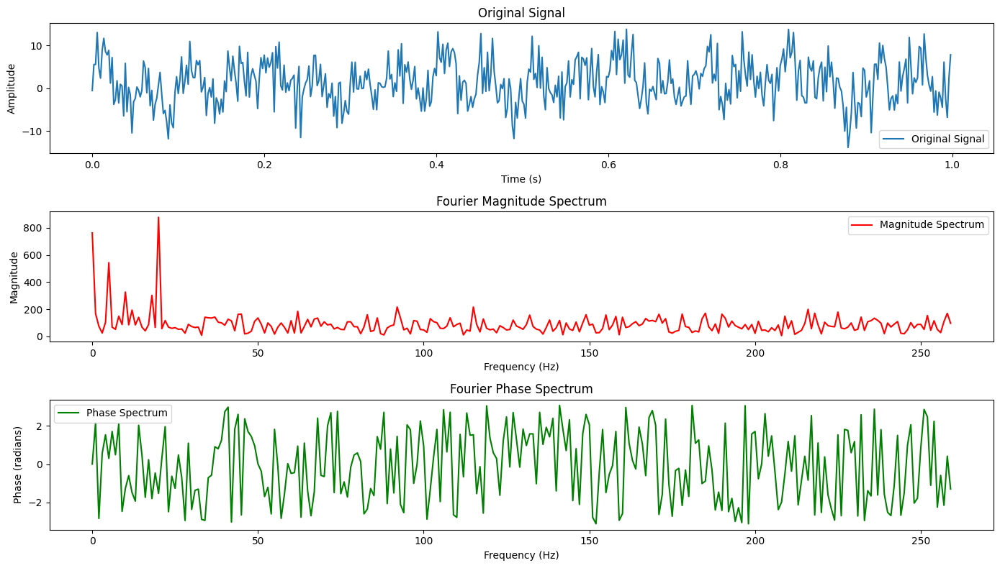


--- Training on Signal 1 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 1.0087
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - loss: 0.3484
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 140ms/step - loss: 0.3296
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - loss: 0.1962
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - loss: 0.4346
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.1905
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.1449
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step - loss: 0.2071
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 144ms/step - loss: 0.1679
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 140ms/step - loss: 0.1050
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 134ms/step - loss: 0.0887
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 140ms/step - loss: 0.0877
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.1455
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - loss: 0.0685
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

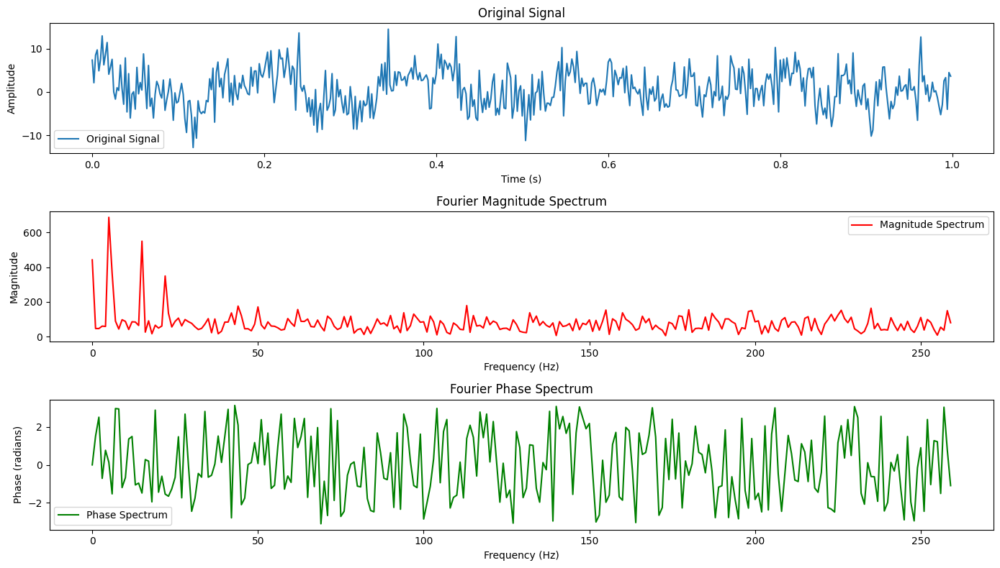


--- Training on Signal 2 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0375
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0370
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0304
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step - loss: 0.0338
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.0378
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 142ms/step - loss: 0.0376
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0293
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0279
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0293
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0274
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0264
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0317
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0324
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0238
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

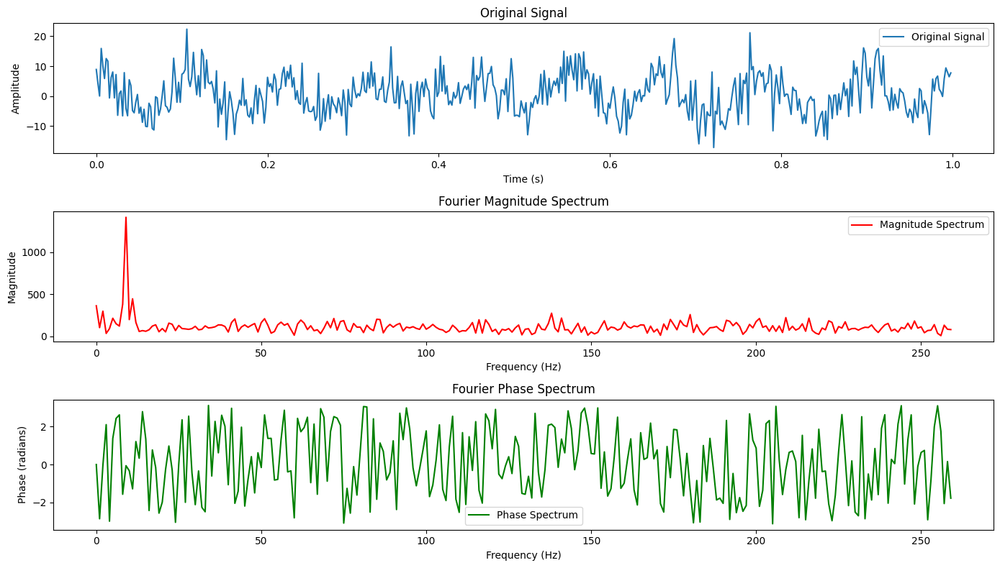


--- Training on Signal 3 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 263ms/step - loss: 0.0388
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 172ms/step - loss: 0.0317
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0294
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0294
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0258
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0254
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0250
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0238
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0220
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0253
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0244
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - loss: 0.0244
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 269ms/step - loss: 0.0226
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0262
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

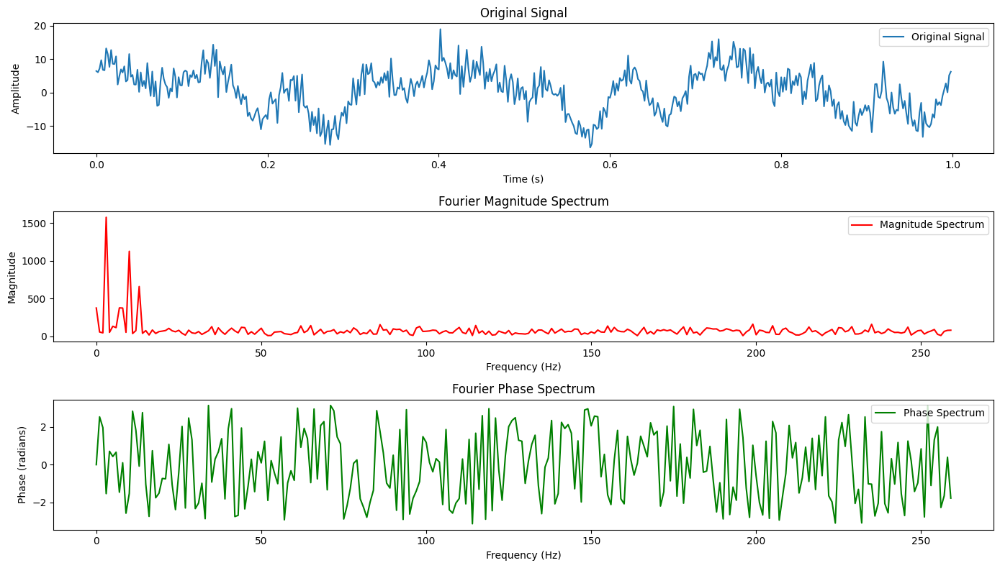


--- Training on Signal 4 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - loss: 0.0211
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 267ms/step - loss: 0.0245
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 268ms/step - loss: 0.0186
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0235
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0183
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - loss: 0.0159
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0152
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0209
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0144
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0137
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0126
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0160
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 255ms/step - loss: 0.0151
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - loss: 0.0143
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

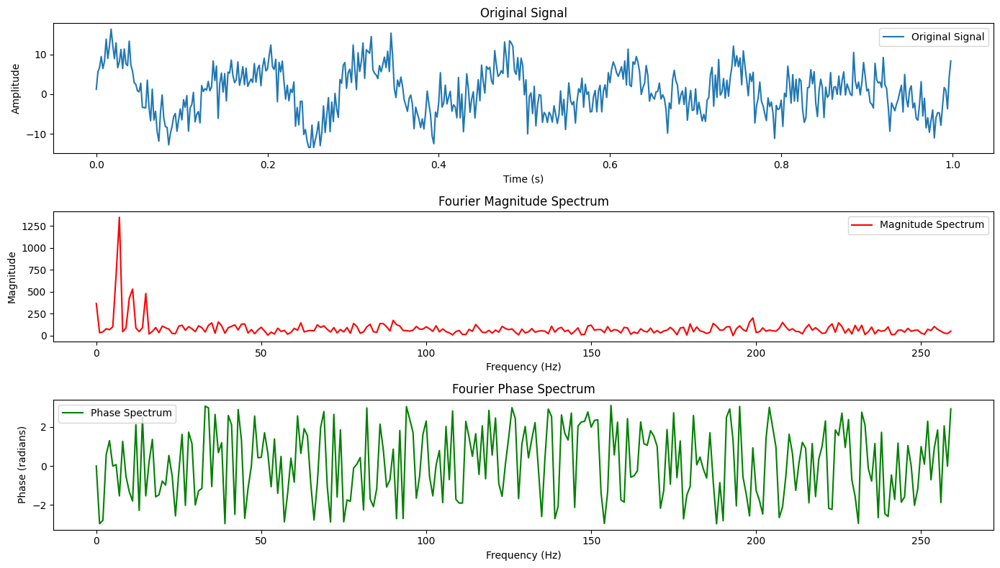


--- Training on Signal 5 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.0264
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0258
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0232
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0264
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0227
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0259
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0219
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0211
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step - loss: 0.0215
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 255ms/step - loss: 0.0265
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 276ms/step - loss: 0.0240
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0221
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0210
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0196
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

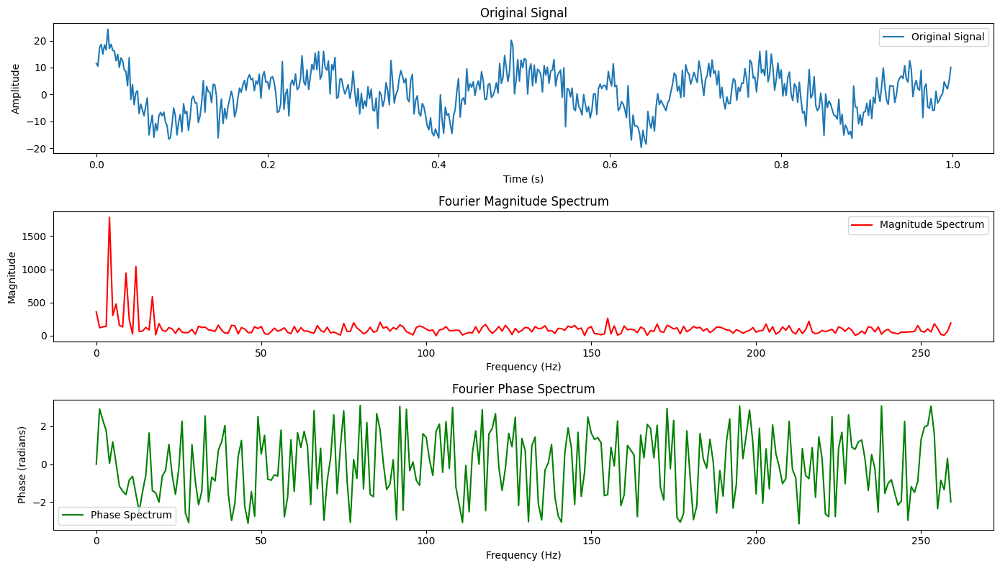


--- Training on Signal 6 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0204
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 284ms/step - loss: 0.0224
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0219
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0219
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0182
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0225
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0224
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0190
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0204
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0174
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0209
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step - loss: 0.0197
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0217
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0186
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

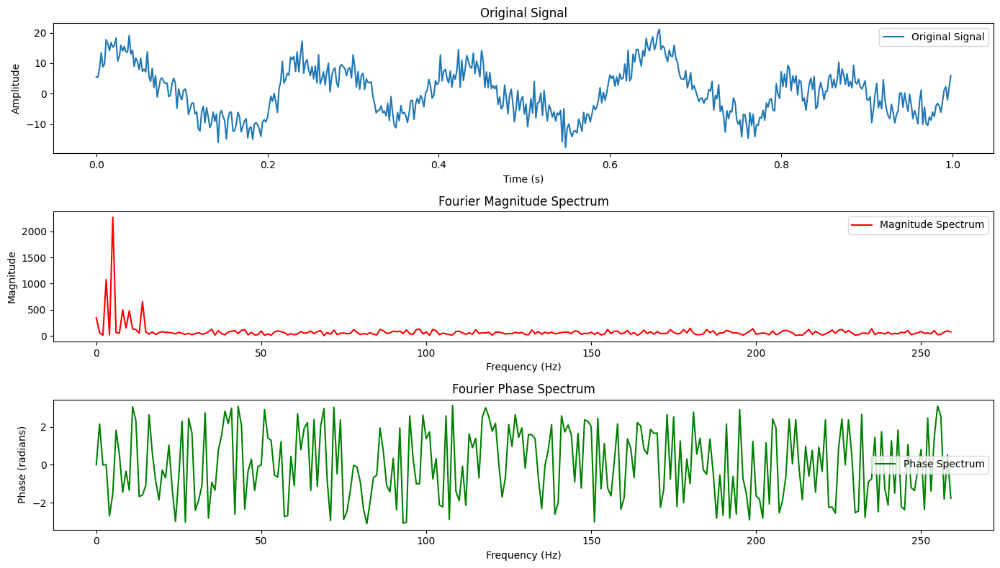


--- Training on Signal 7 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.0135
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.0118
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0119
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0116
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0133
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0156
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0101
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0144
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0117
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0122
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.0102
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 268ms/step - loss: 0.0102
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 274ms/step - loss: 0.0133
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0094
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

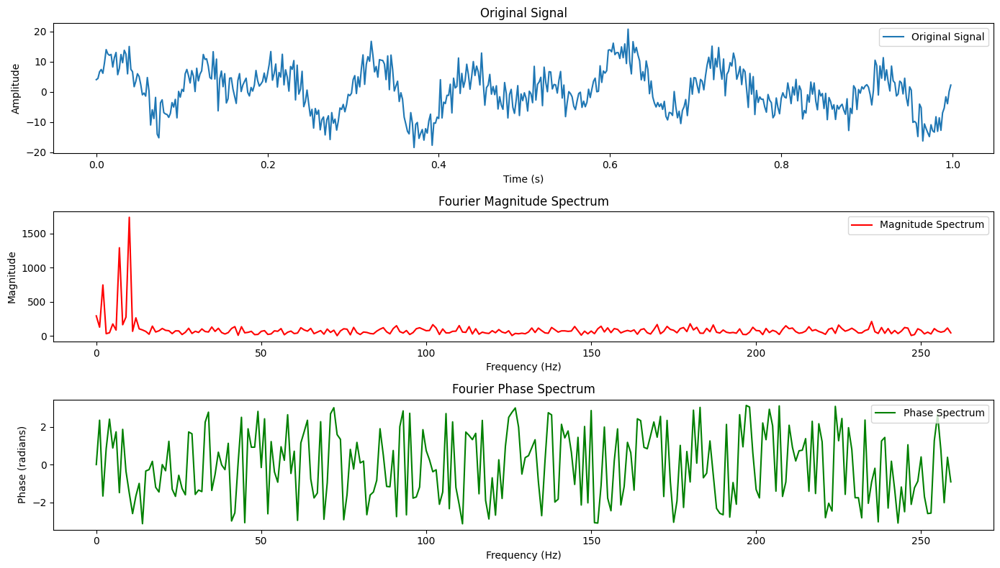


--- Training on Signal 8 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0162
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0194
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0145
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0182
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0115
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0134
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0204
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 277ms/step - loss: 0.0135
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 282ms/step - loss: 0.0182
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - loss: 0.0148
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0146
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0125
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0170
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0155
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

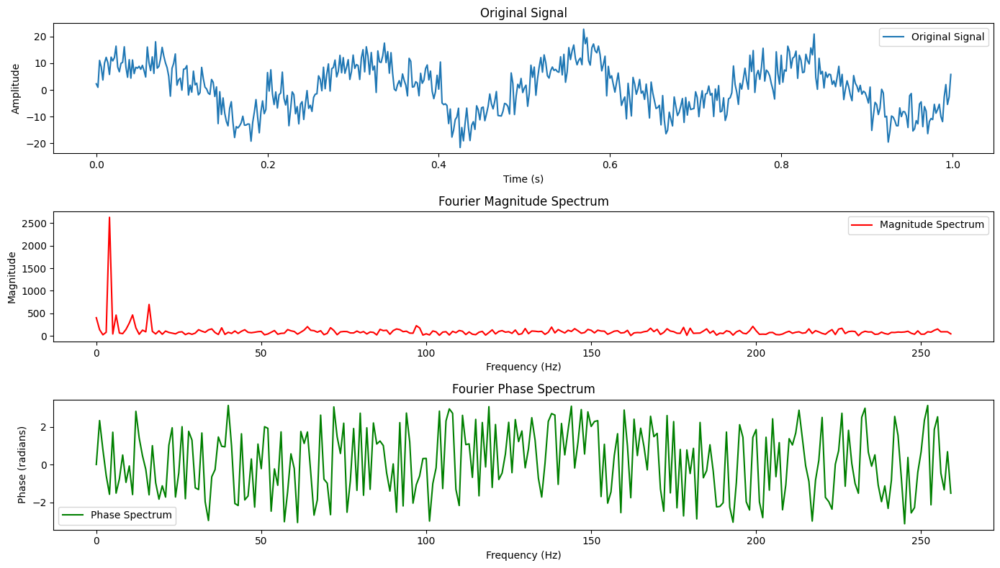


--- Training on Signal 9 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0175
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0198
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0161
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0162
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0139
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0154
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.0151
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 278ms/step - loss: 0.0137
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - loss: 0.0188
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 167ms/step - loss: 0.0148
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0135
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0150
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0148
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0212
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

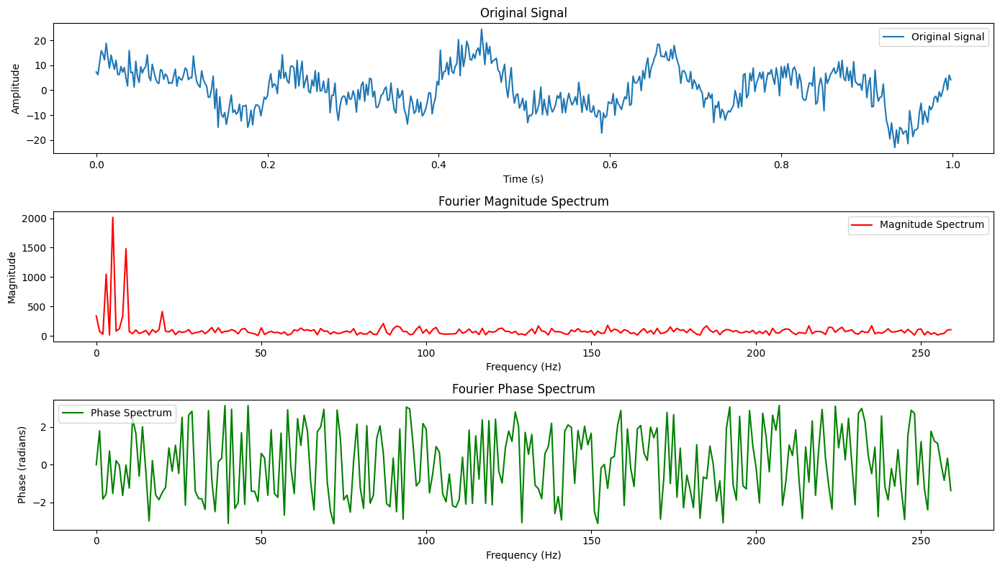


--- Training on Signal 10 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0163
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0117
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0109
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0117
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0119
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0127
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0108
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 276ms/step - loss: 0.0135
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 274ms/step - loss: 0.0123
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.0123
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0103
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0105
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0132
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step - loss: 0.0113
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s

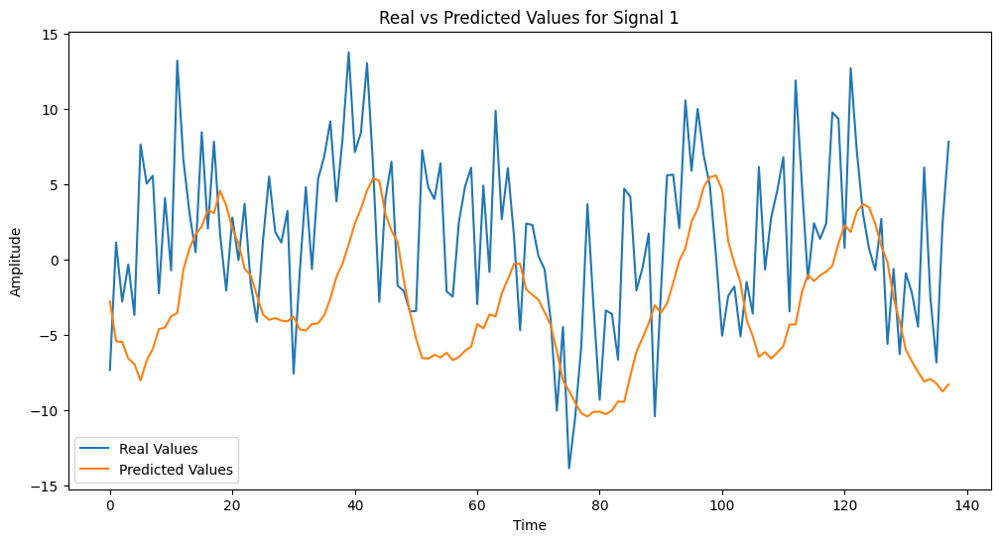


--- Prediction for Signal 2 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
MSE for Signal 2: 27.789772033691406


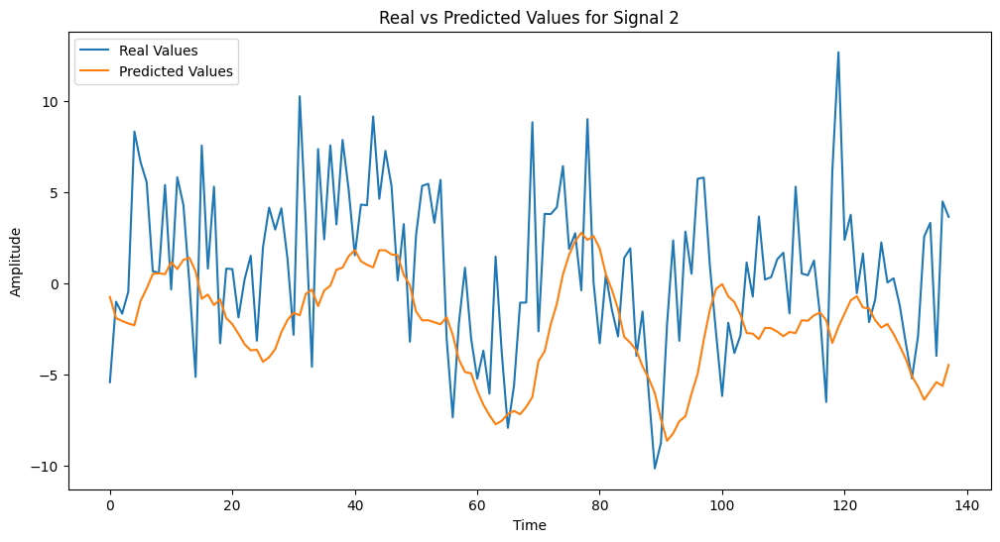


--- Prediction for Signal 3 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
MSE for Signal 3: 40.59822082519531


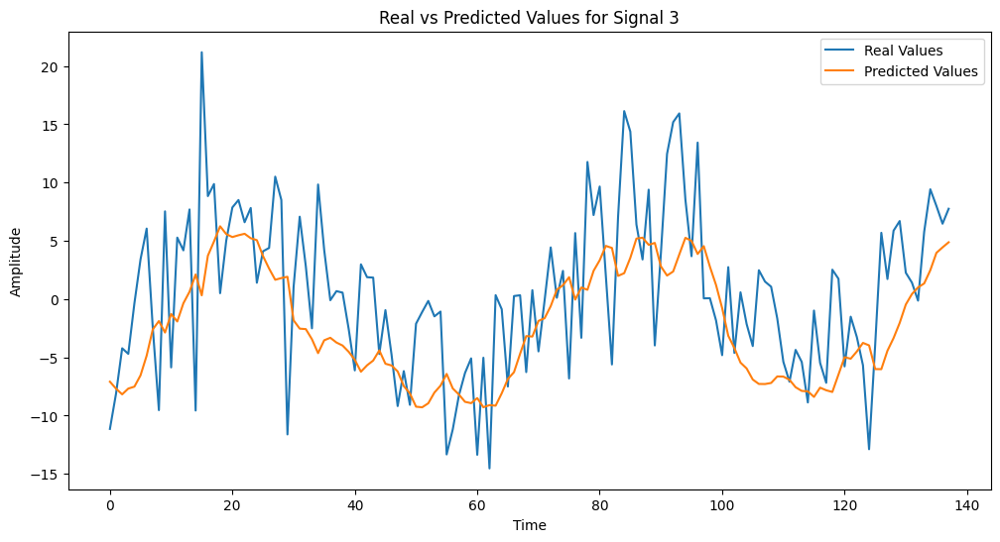


--- Prediction for Signal 4 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
MSE for Signal 4: 29.004375457763672


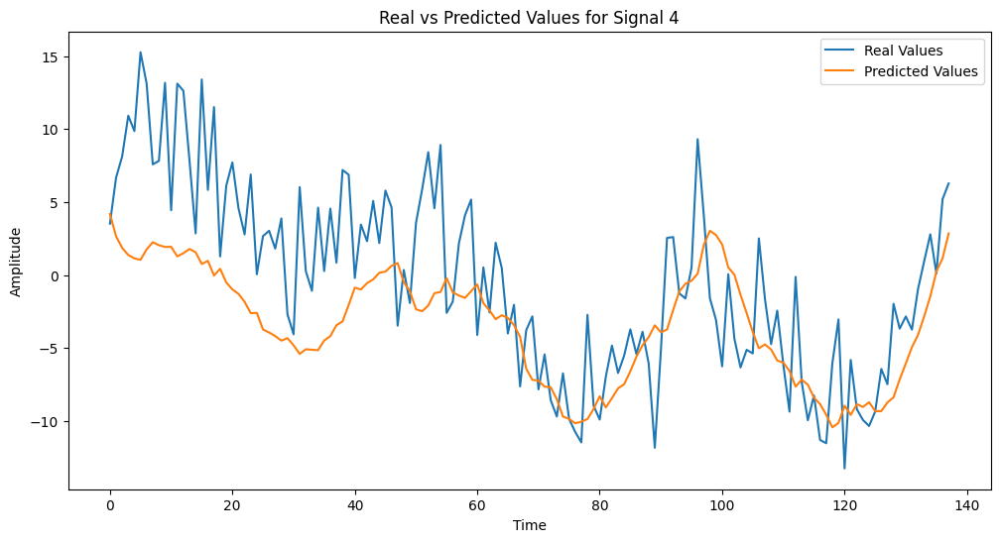


--- Prediction for Signal 5 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
MSE for Signal 5: 23.687448501586914


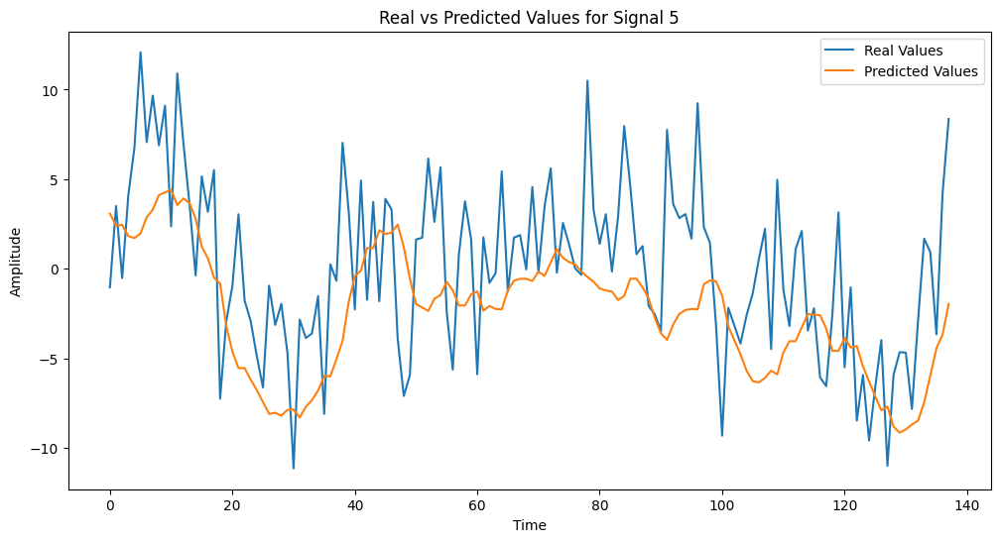


--- Prediction for Signal 6 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
MSE for Signal 6: 41.23037338256836


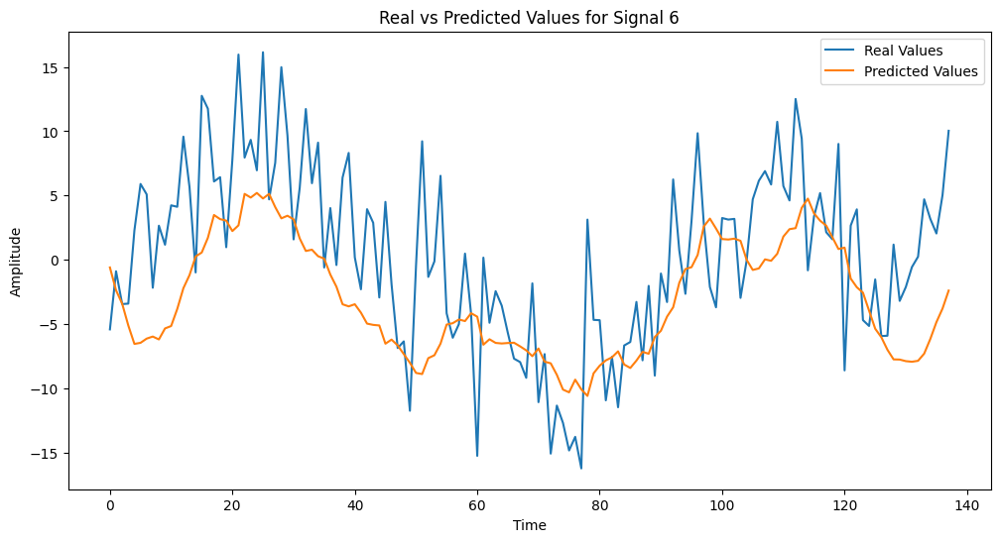


--- Prediction for Signal 7 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
MSE for Signal 7: 18.71414566040039


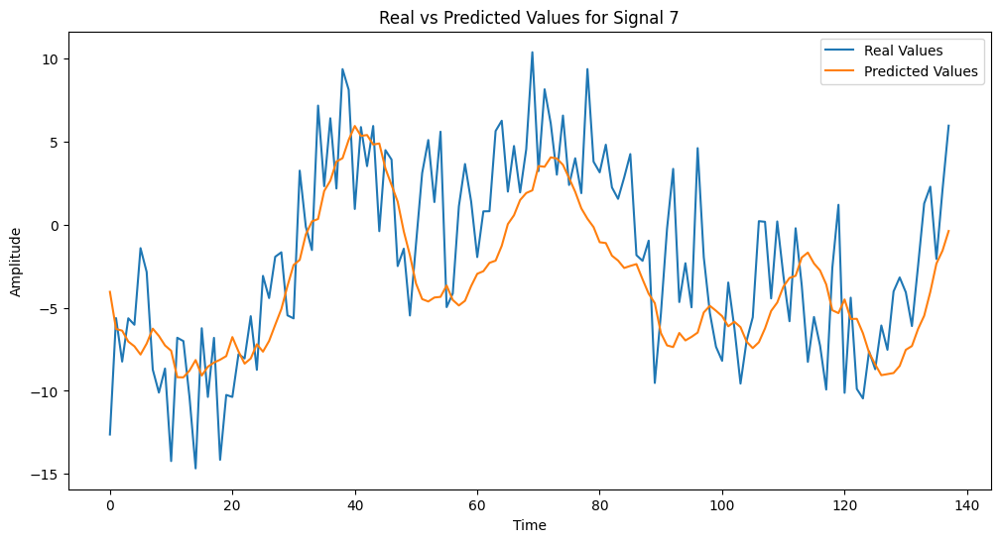


--- Prediction for Signal 8 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
MSE for Signal 8: 21.913219451904297


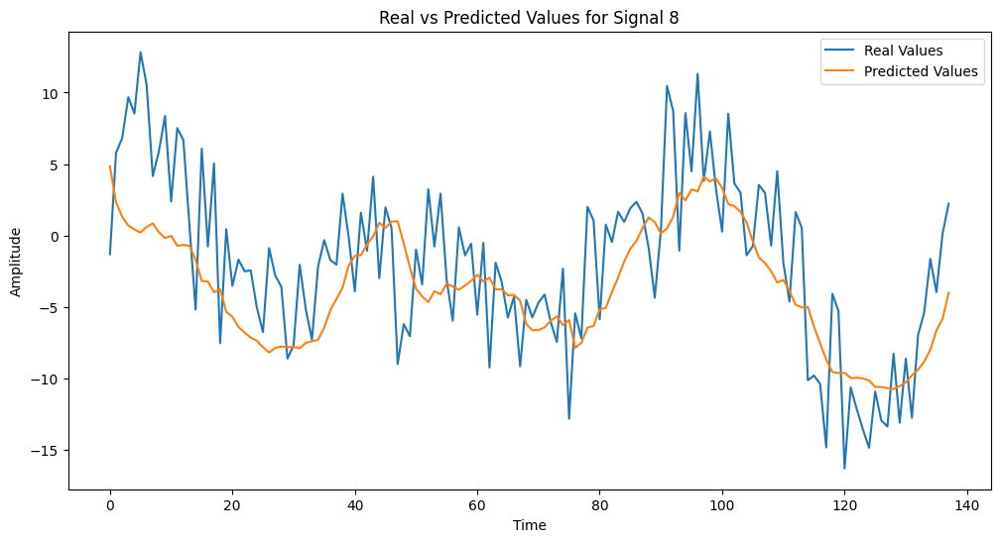


--- Prediction for Signal 9 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
MSE for Signal 9: 43.76994323730469


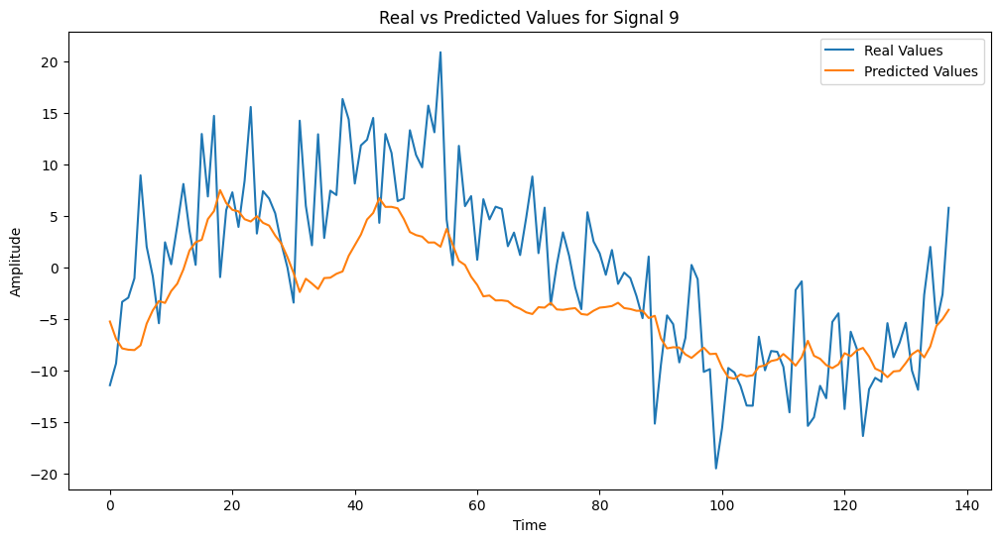


--- Prediction for Signal 10 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
MSE for Signal 10: 33.74966812133789


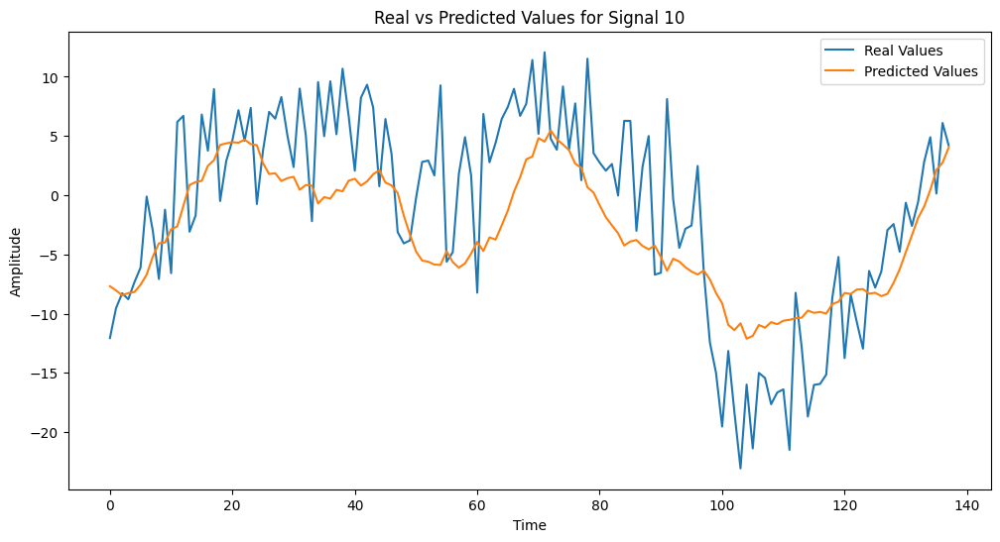

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dropout, Lambda, Dense, Flatten, Multiply, Reshape, Activation, Concatenate, LeakyReLU
from tensorflow.keras.models import Model
import numpy as np
import random
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

# Function to set random seed for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

def fourier_analysis(signal, resolution):

    # Number of samples in the signal
    N = len(signal)

    # Compute the Fourier Transform of the signal
    fourier_transform = np.fft.fft(signal)

    # Frequency bins based on resolution as the sampling rate
    freqs = np.fft.fftfreq(N, d=1/resolution)

    # Magnitude and phase of the Fourier components
    magnitude = np.abs(fourier_transform)
    phase = np.angle(fourier_transform)

    # Plot the original signal
    plt.figure(figsize=(14, 8))

    plt.subplot(3, 1, 1)
    time = np.arange(N) / resolution
    plt.plot(time, signal, label="Original Signal")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title("Original Signal")
    plt.legend()

    # Plot the magnitude spectrum
    plt.subplot(3, 1, 2)
    plt.plot(freqs[:N // 2], magnitude[:N // 2], color='r', label="Magnitude Spectrum")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude")
    plt.title("Fourier Magnitude Spectrum")
    plt.legend()

    # Plot the phase spectrum
    plt.subplot(3, 1, 3)
    plt.plot(freqs[:N // 2], phase[:N // 2], color='g', label="Phase Spectrum")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Phase (radians)")
    plt.title("Fourier Phase Spectrum")
    plt.legend()

    plt.tight_layout()
    plt.show()

set_seed(42)

# Define the Fourier Transform Layer without filtering or peak selection
def fourier_transform_layer_all_frequencies(x):
    x_fft = tf.signal.rfft(x)
    return tf.abs(x_fft)  # Return the full magnitude spectrum

# Compiling the model with three branches
sequence_len = 60  # Define the sequence length (changeable)
fft_length = sequence_len // 2 + 1  # Length of the FFT output

input_sales = Input(shape=(sequence_len, 1))  # Input for the sales (signals)
input_mean = Input(shape=(3, 1))  # Input for the moving averages

# Temporal Branch
x_time = Bidirectional(LSTM(128, activation='relu', return_sequences=False))(input_sales)
x_time = Dropout(0.1)(x_time)

# Frequency Branch (Fourier Transform using all frequencies)
reshaped_input_sales = Reshape((sequence_len,))(input_sales)
x_freq = Lambda(fourier_transform_layer_all_frequencies, output_shape=(fft_length,))(reshaped_input_sales)

# Attention mechanism on the Fourier-transformed data
attention_scores = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_scores = Flatten()(attention_scores)
attention_weights = Activation('sigmoid')(attention_scores)
attention_weights = Reshape((fft_length,))(attention_weights)

# Apply attention weights to the Fourier-transformed data
x_freq_attended = Multiply()([x_freq, attention_weights])
x_freq_flat = Flatten()(x_freq_attended)
x_freq_flat = Dropout(0.1)(x_freq_flat)
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)
x_freq_dense = Dropout(0.1)(x_freq_dense)

# Moving Averages Branch
x_mean = Dense(64, activation='relu')(input_mean)
x_mean = Flatten()(x_mean)
x_mean = Dropout(0.1)(x_mean)

# Combine the three branches
x_combined = Concatenate()([x_time, x_freq_dense, x_mean])

# Output Layers
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dropout(0.1)(x_output)
x_output = Dense(1)(x_output)

# Create the final model
model = Model(inputs=[input_sales, input_mean], outputs=x_output)
model.compile(optimizer='rmsprop', loss='mse')

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='loss', patience=20, restore_best_weights=True)

# Path to save the trained model
path_combination_bilstm = '/content/drive/MyDrive/Tirocinio/LstmFourier/Improving/Combination/BiLSTM_avg3_all_frequencies.keras'

# Lists to save test data and predictions
X_test_lag_list = []
X_test_rolling_list = []
y_test_list = []
predictions = []

# Train/Test split ratio
ratio = 0.7

# Loop to train the model on each signal
for i, signal in enumerate(signals):
    signal = pd.Series(signal)

    print(f'--- Fourier Component on Signal {i+1} ---')
    fourier_analysis(signal, 520)

    print(f"\n--- Training on Signal {i+1} ---")
    # Create dataset for the current signal
    lag_table, rolling_table, y = create_dataset_with_baseline(signal, sequence_len)
    lag_table_train, lag_table_test = divide_set(lag_table, ratio)
    rolling_table_train, rolling_table_test = divide_set(rolling_table, ratio)
    y_train, y_test = divide_set(y, ratio)

    # Save the test data for later prediction
    X_test_lag_list.append(lag_table_test)
    X_test_rolling_list.append(rolling_table_test)
    y_test_list.append(y_test)

    # Scaling the data
    scaler_lag = MinMaxScaler(feature_range=(0, 1))
    scaler_rolling = MinMaxScaler(feature_range=(0, 1))
    scaler_y = MinMaxScaler(feature_range=(0, 1))

    lag_table_train_scaled = scaler_lag.fit_transform(lag_table_train)
    lag_table_test_scaled = scaler_lag.transform(lag_table_test)

    rolling_table_train_scaled = scaler_rolling.fit_transform(rolling_table_train)
    rolling_table_test_scaled = scaler_rolling.transform(rolling_table_test)

    y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
    y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

    # Align the length of the inputs to match
    min_samples_train = min(len(lag_table_train_scaled), len(rolling_table_train_scaled), len(y_train_scaled))

    # Trim all arrays to the minimum length
    lag_table_train_scaled = lag_table_train_scaled[:min_samples_train]
    rolling_table_train_scaled = rolling_table_train_scaled[:min_samples_train]
    y_train_scaled = y_train_scaled[:min_samples_train]

    # Train the model
    model.fit(
        [lag_table_train_scaled, rolling_table_train_scaled],
        y_train_scaled,
        epochs=200,
        batch_size=64,
        callbacks=[early_stopping],
        verbose=1
    )

# Save the trained model
model.save(path_combination_bilstm)

# Final predictions and visualization
for i, (X_test_lag, X_test_rolling) in enumerate(zip(X_test_lag_list, X_test_rolling_list)):
    print(f"\n--- Prediction for Signal {i+1} ---")

    # Scale the test data for the current signal
    X_test_lag_scaled = scaler_lag.transform(X_test_lag)
    X_test_rolling_scaled = scaler_rolling.transform(X_test_rolling)
    y_test_scaled = scaler_y.transform(y_test_list[i].reshape(-1, 1)).flatten()

    # Align the length of the inputs to match
    min_samples = min(len(X_test_lag_scaled), len(X_test_rolling_scaled))

    X_test_lag_scaled = X_test_lag_scaled[:min_samples]
    X_test_rolling_scaled = X_test_rolling_scaled[:min_samples]
    y_test_scaled = y_test_scaled[:min_samples]

    # Make predictions with the model
    y_pred_scaled = model.predict([X_test_lag_scaled, X_test_rolling_scaled])
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_test_inv = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

    predictions.append(y_pred)

    # Calculate MSE for the current signal
    test_mse = MeanSquaredError()(y_test_inv, y_pred).numpy()
    print(f'MSE for Signal {i+1}: {test_mse}')

    # Plot the results
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_inv, label='Real Values')
    plt.plot(y_pred, label='Predicted Values')
    plt.title(f'Real vs Predicted Values for Signal {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()


## Attention

Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_45            │ (None, 60, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_40 (Reshape)      │ (None, 60)             │              0 │ input_layer_45[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_46            │ (None, 3, 1)           │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_27 (Lambda)        │ (None, 31)             │              0 │ reshape_40[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_42 (Reshape)      │ (None, 3)              │              0 │ input_layer_46[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_117 (Dense)         │ (None, 31)             │            992 │ lambda_27[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_119 (Dense)         │ (None, 3)              │             12 │ reshape_42[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_57 (Flatten)      │ (None, 31)             │              0 │ dense_117[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_59 (Flatten)      │ (None, 3)              │              0 │ dense_119[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_29             │ (None, 31)             │              0 │ flatten_57[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_30             │ (None, 3)              │              0 │ flatten_59[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_41 (Reshape)      │ (None, 31)             │              0 │ activation_29[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_43 (Reshape)      │ (None, 3, 1)           │              0 │ activation_30[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_29 (Multiply)    │ (None, 31)             │              0 │ lambda_27[0][0],       │
│                           │                        │                │ reshape_41[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_30 (Multiply)    │ (None, 3, 1)           │              0 │ input_layer_46[0][0],  │
│                           │                        │                │ reshape_43[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_58 (Flatten)      │ (None, 31)             │              0 │ multiply_29[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_60 (Flatten) 

 Total params: 161,133 (629.43 KB)

 Trainable params: 161,133 (629.43 KB)

 Non-trainable params: 0 (0.00 B)

--- Fourier Component on Signal 1 ---


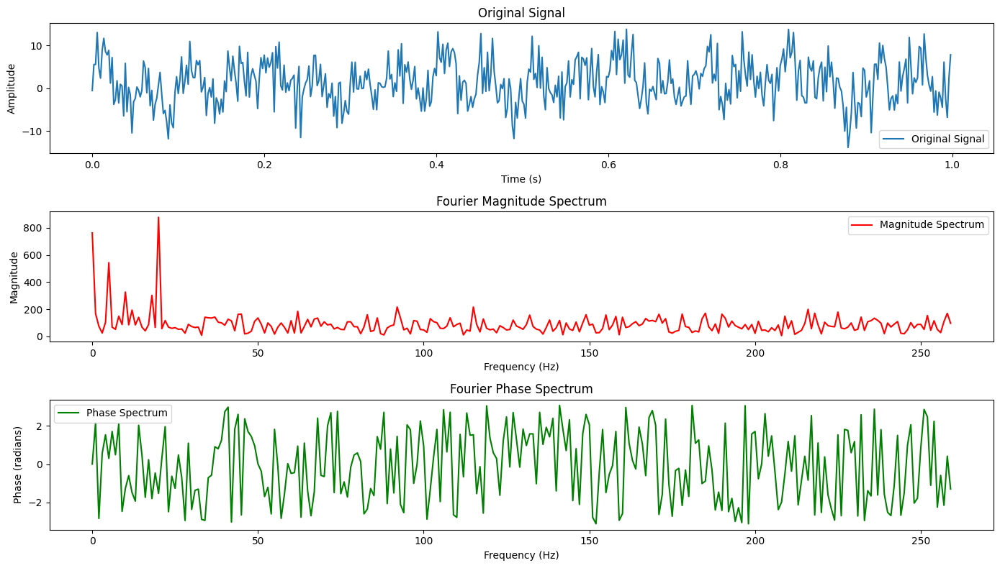


--- Training on Signal 1 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 2.3990
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 1.2608
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 1.0072
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - loss: 0.8770
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.9507
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.7590
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.4387
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step - loss: 1.9382
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 256ms/step - loss: 0.3549
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step - loss: 0.2949
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.3475
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.5998
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - loss: 0.2005
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - loss: 0.3600
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

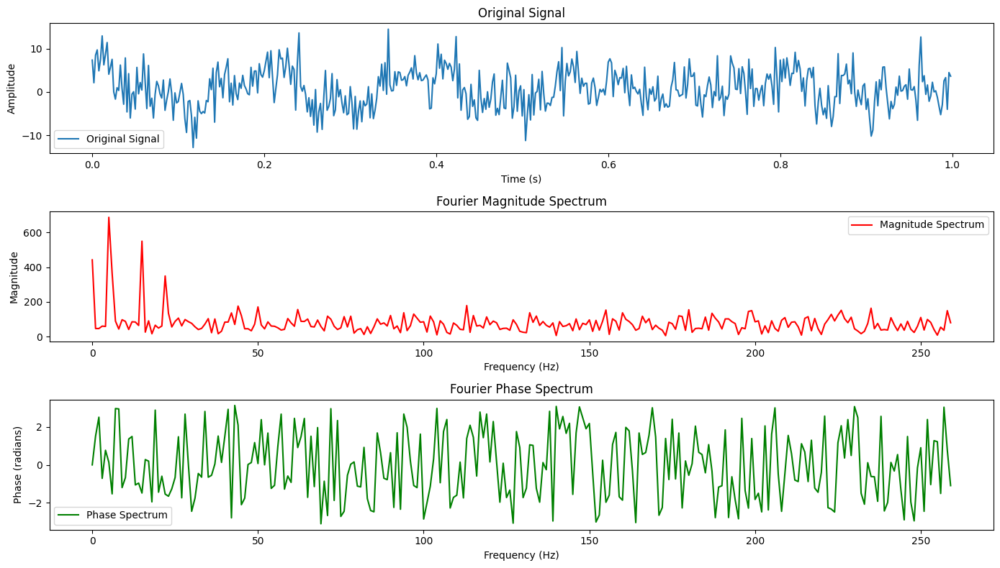


--- Training on Signal 2 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 268ms/step - loss: 0.0454
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 263ms/step - loss: 0.0437
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 144ms/step - loss: 0.0420
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - loss: 0.0331
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0315
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0304
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0350
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0291
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0376
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0284
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0326
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step - loss: 0.0301
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 270ms/step - loss: 0.0291
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0322
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

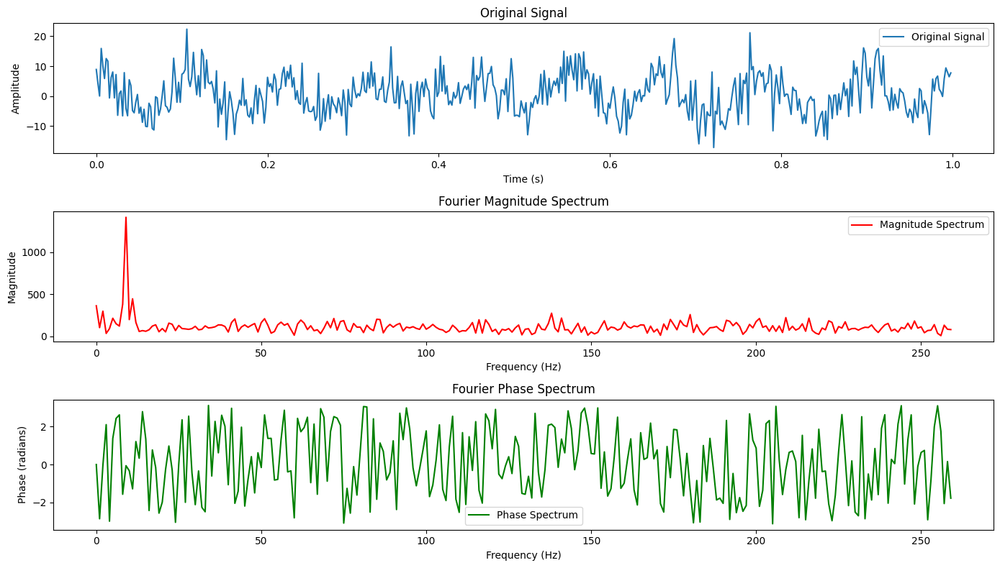


--- Training on Signal 3 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 273ms/step - loss: 0.0379
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0316
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0348
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0335
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0306
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0299
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0291
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0327
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0269
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0301
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 237ms/step - loss: 0.0275
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 267ms/step - loss: 0.0244
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 177ms/step - loss: 0.0262
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0253
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

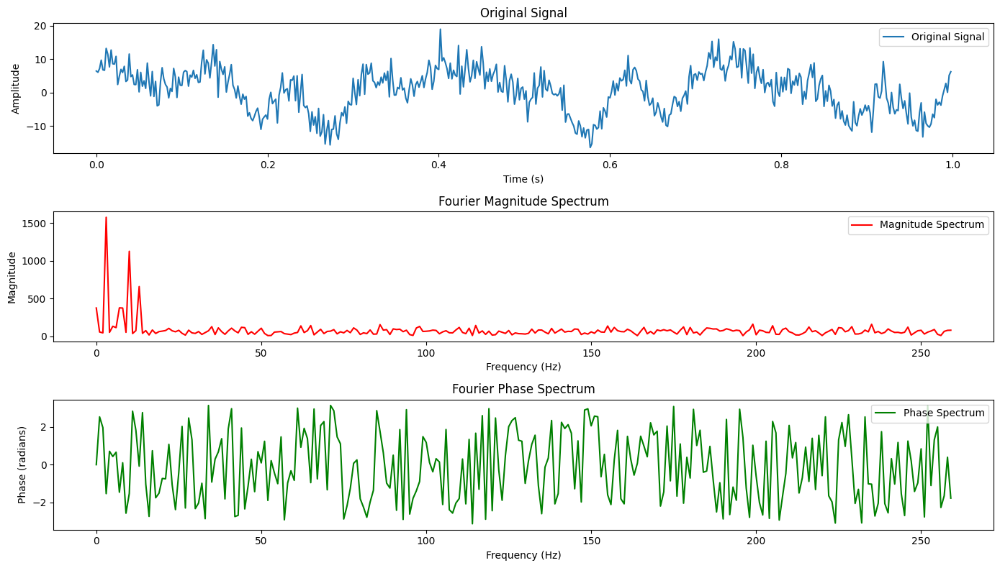


--- Training on Signal 4 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0320
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0348
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 274ms/step - loss: 0.0322
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0275
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0284
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0286
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0286
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0285
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0234
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0219
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0327
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 258ms/step - loss: 0.0232
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 263ms/step - loss: 0.0228
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - loss: 0.0233
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

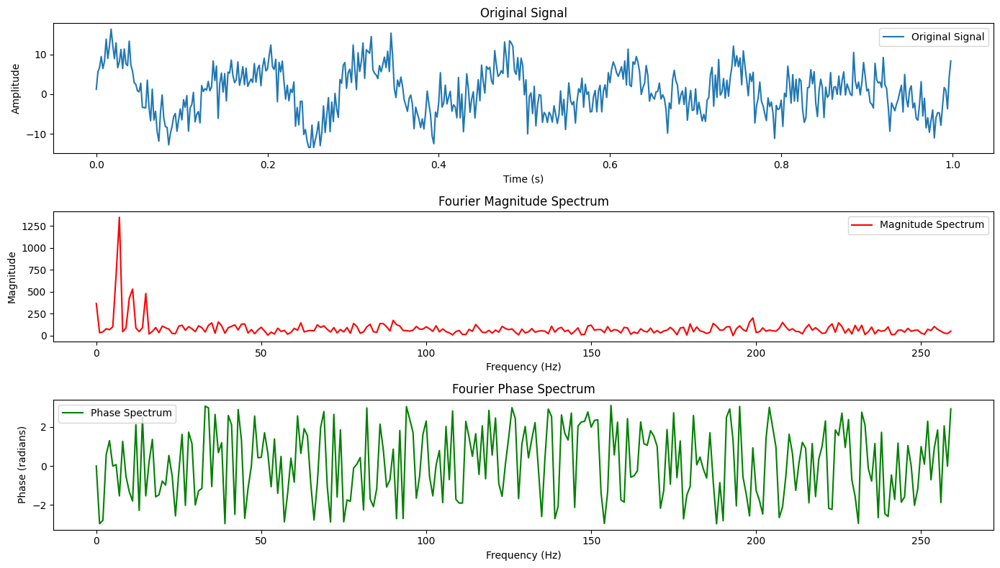


--- Training on Signal 5 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 273ms/step - loss: 0.0260
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0334
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0252
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0264
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0242
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0288
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0244
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0257
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0293
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.0242
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 285ms/step - loss: 0.0249
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 281ms/step - loss: 0.0252
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0240
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0236
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

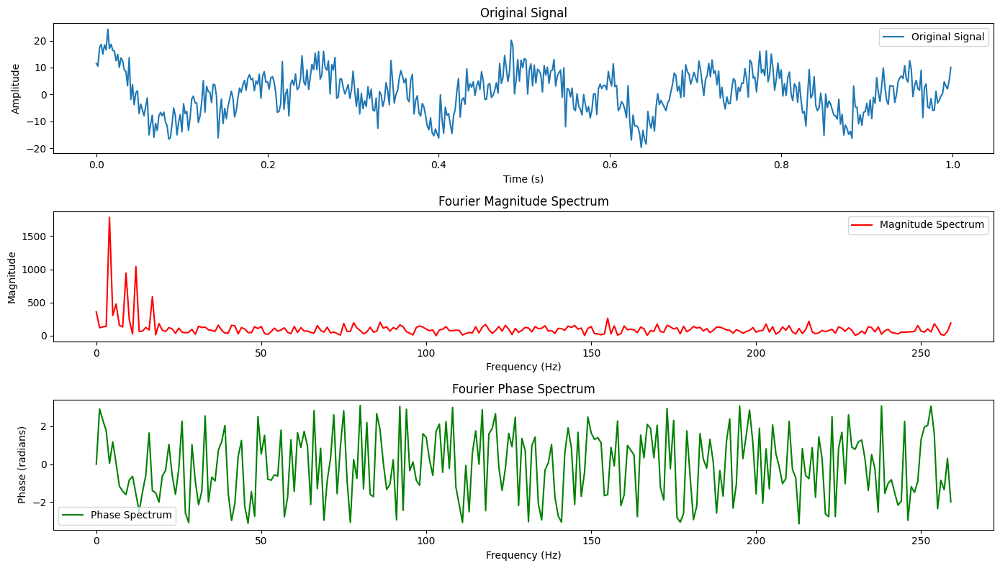


--- Training on Signal 6 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 282ms/step - loss: 0.0323
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0314
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0271
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0226
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0237
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0207
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0208
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0237
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0215
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - loss: 0.0234
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 277ms/step - loss: 0.0197
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0200
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0195
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0263
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

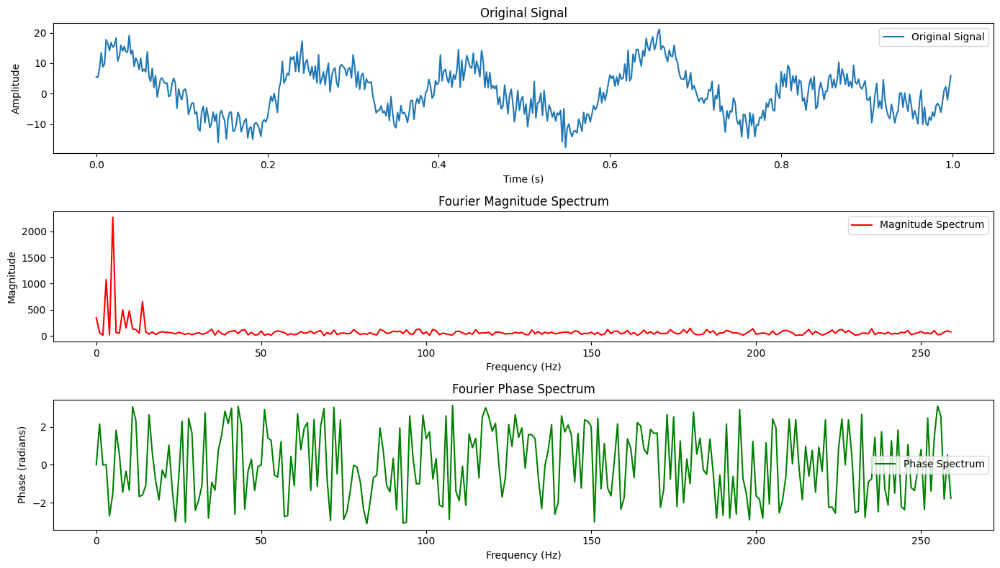


--- Training on Signal 7 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 289ms/step - loss: 0.0214
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.0128
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0126
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0113
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0135
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0121
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0114
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0164
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0112
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0168
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0097
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 271ms/step - loss: 0.0127
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 280ms/step - loss: 0.0148
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0122
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

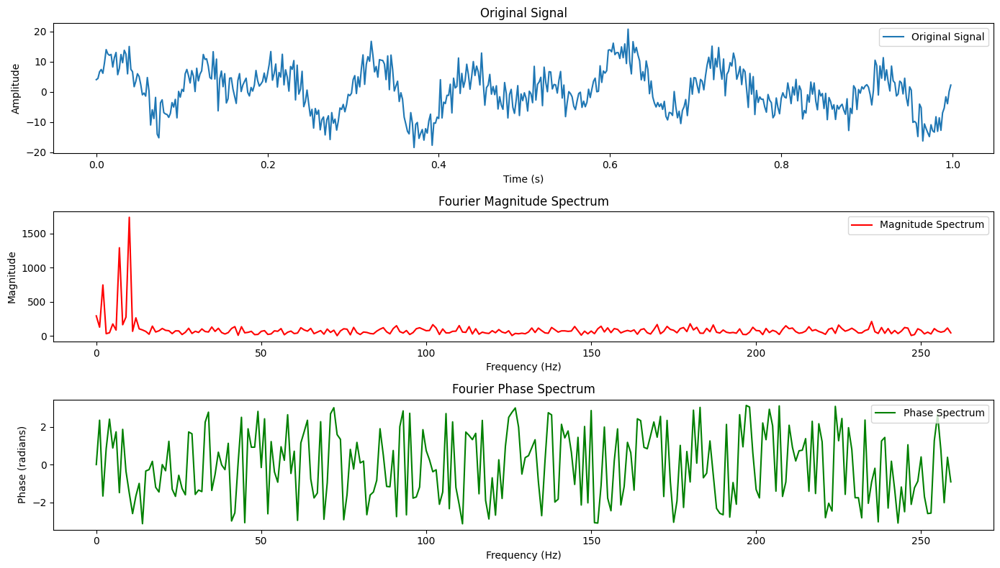


--- Training on Signal 8 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0201
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0249
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 295ms/step - loss: 0.0134
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 293ms/step - loss: 0.0230
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0237
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0126
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step - loss: 0.0252
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0159
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0159
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step - loss: 0.0164
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0127
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0157
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step - loss: 0.0148
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 277ms/step - loss: 0.0158
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 

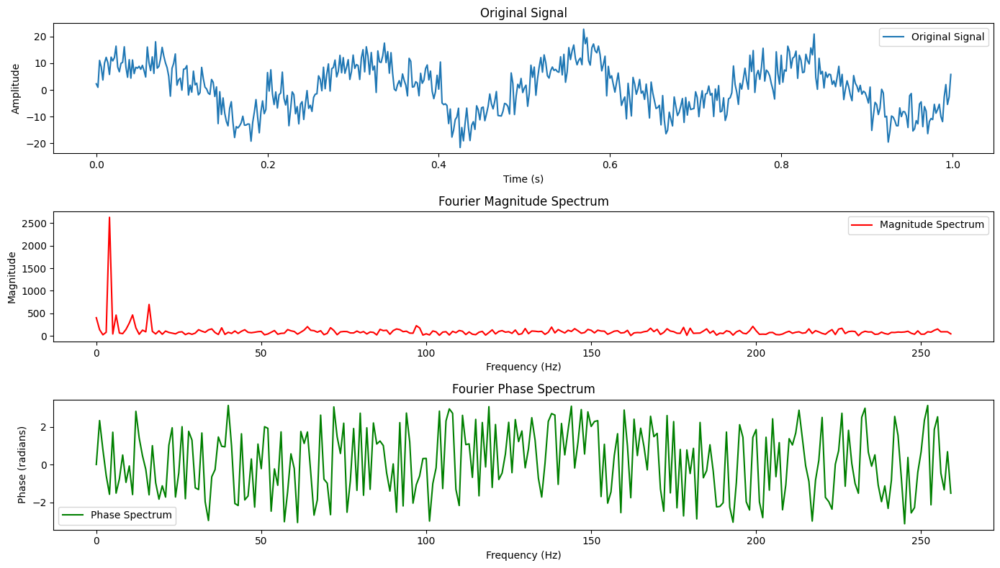


--- Training on Signal 9 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - loss: 0.0222
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - loss: 0.0285
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 281ms/step - loss: 0.0153
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.0221
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0201
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0201
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0168
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - loss: 0.0204
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0147
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0173
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - loss: 0.0193
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0146
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 278ms/step - loss: 0.0121
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 276ms/step - loss: 0.0175
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 

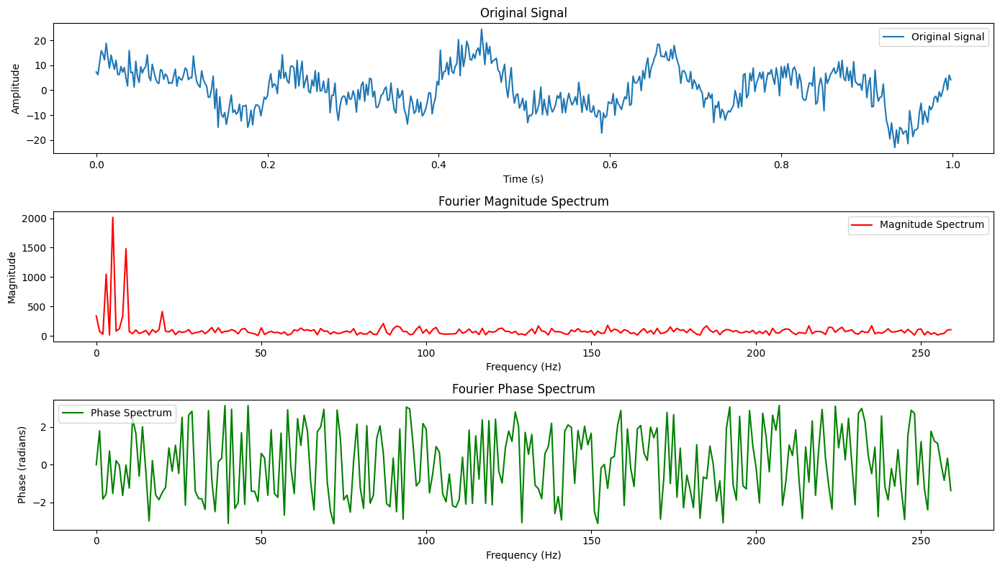


--- Training on Signal 10 ---
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0244
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0134
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 212ms/step - loss: 0.0123
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 277ms/step - loss: 0.0144
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 169ms/step - loss: 0.0158
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0133
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0150
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 173ms/step - loss: 0.0112
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0160
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0125
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0134
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0135
Epoch 13/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 285ms/step - loss: 0.0134
Epoch 14/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 276ms/step - loss: 0.0109
Epoch 15/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s

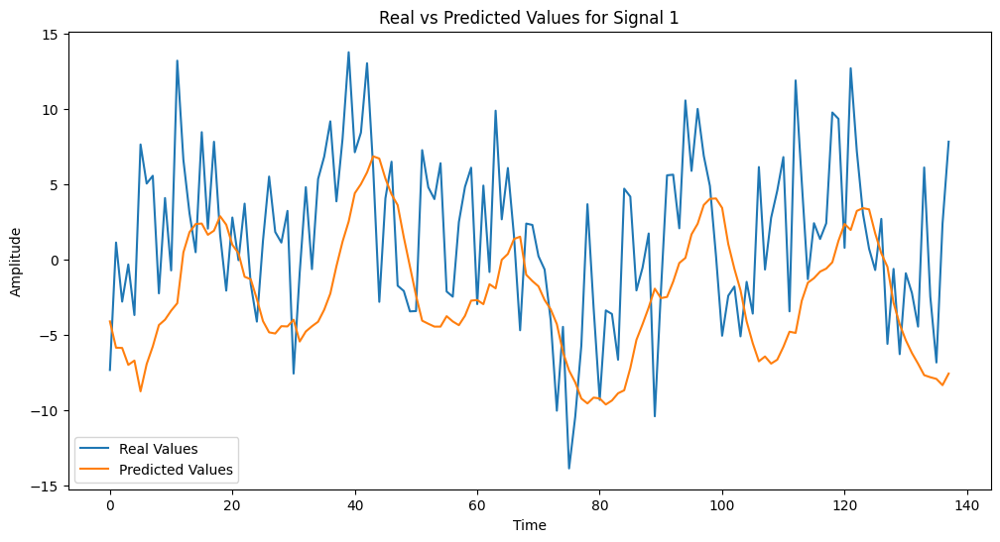


--- Prediction for Signal 2 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
MSE for Signal 2: 31.257614135742188


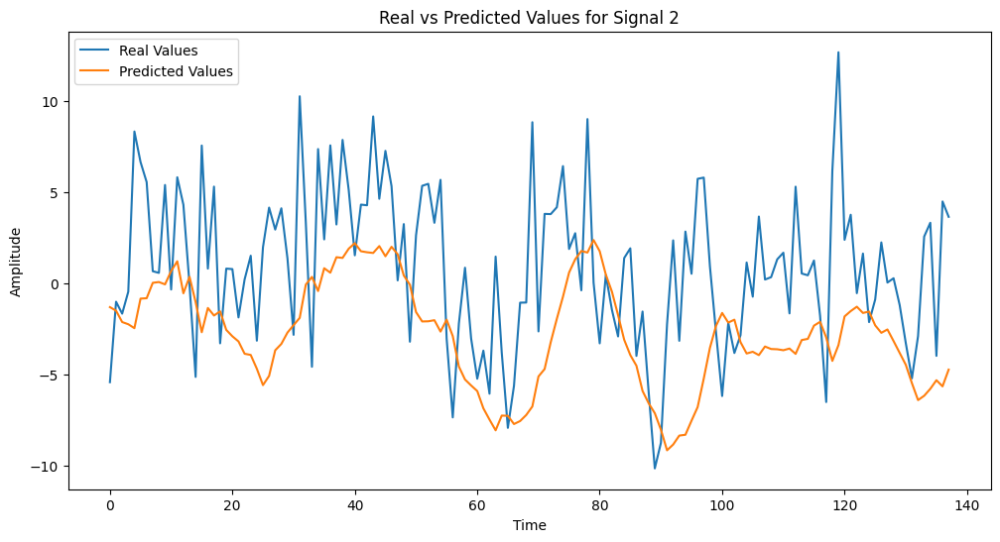


--- Prediction for Signal 3 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
MSE for Signal 3: 41.099853515625


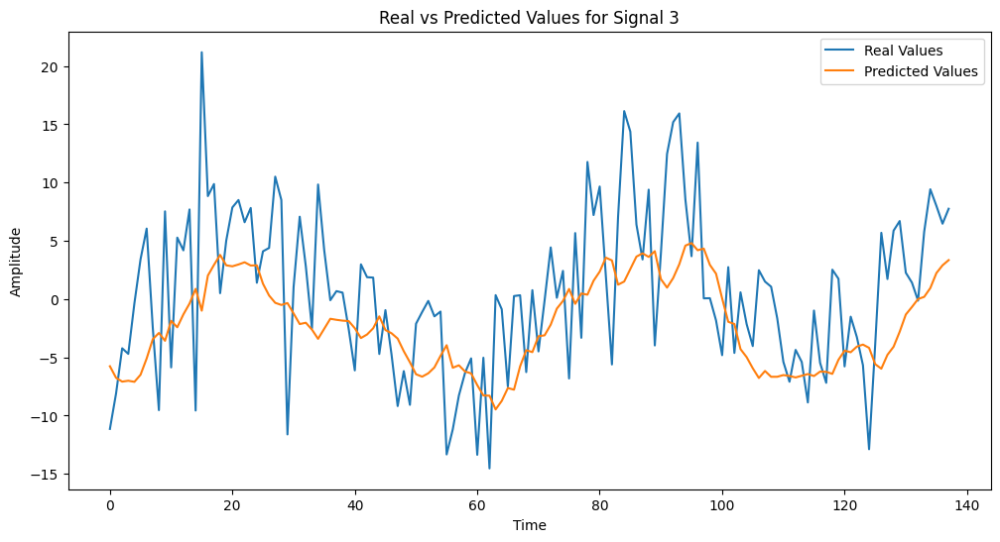


--- Prediction for Signal 4 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
MSE for Signal 4: 27.01221466064453


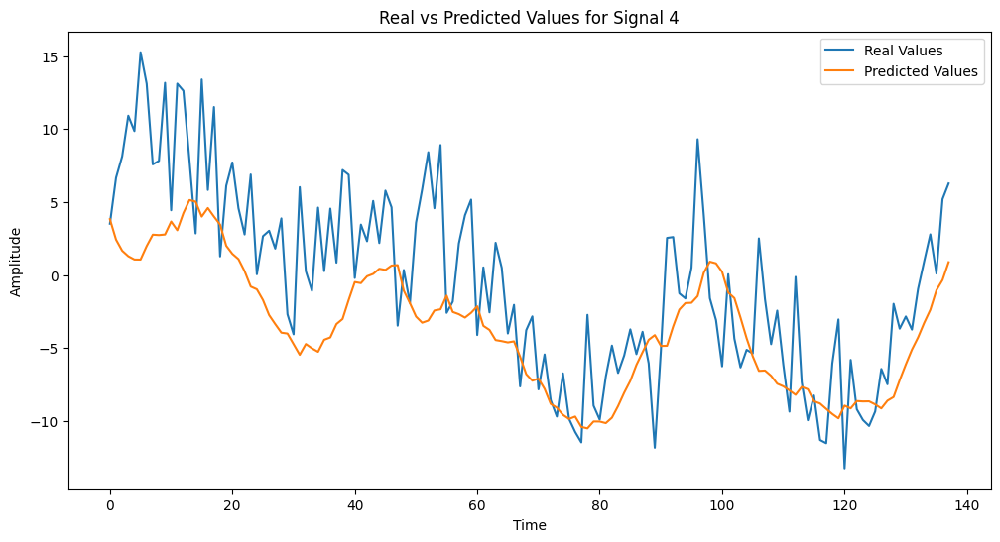


--- Prediction for Signal 5 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step
MSE for Signal 5: 28.791536331176758


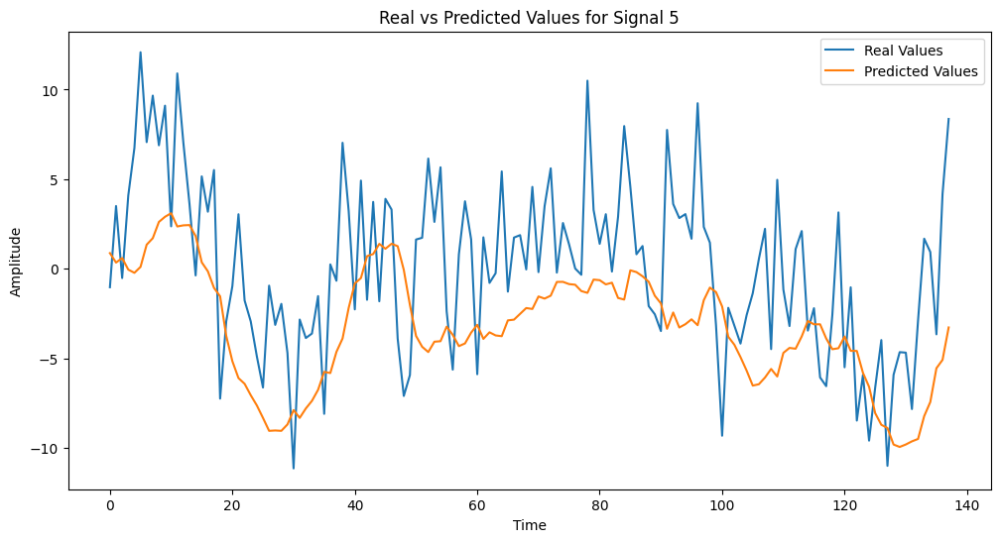


--- Prediction for Signal 6 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
MSE for Signal 6: 37.31355285644531


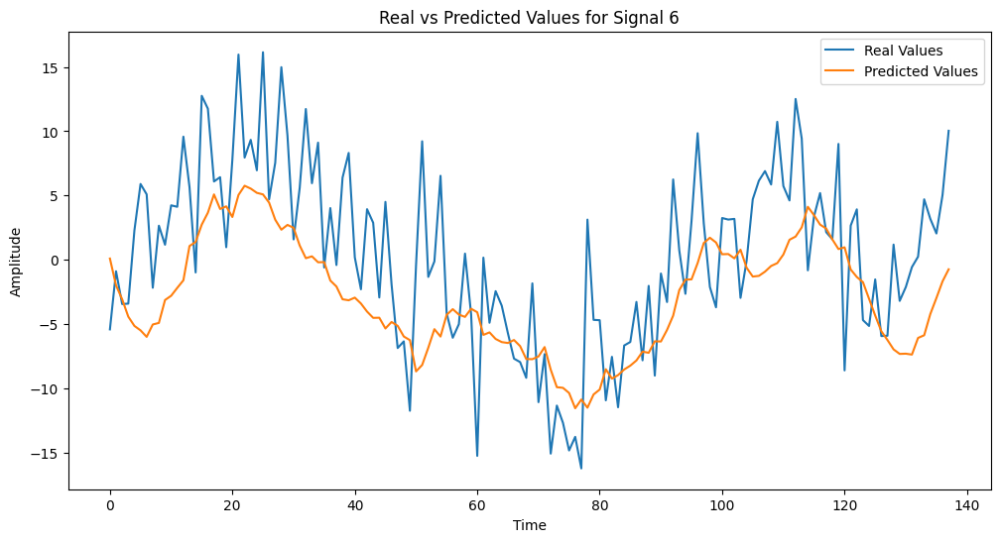


--- Prediction for Signal 7 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
MSE for Signal 7: 19.138723373413086


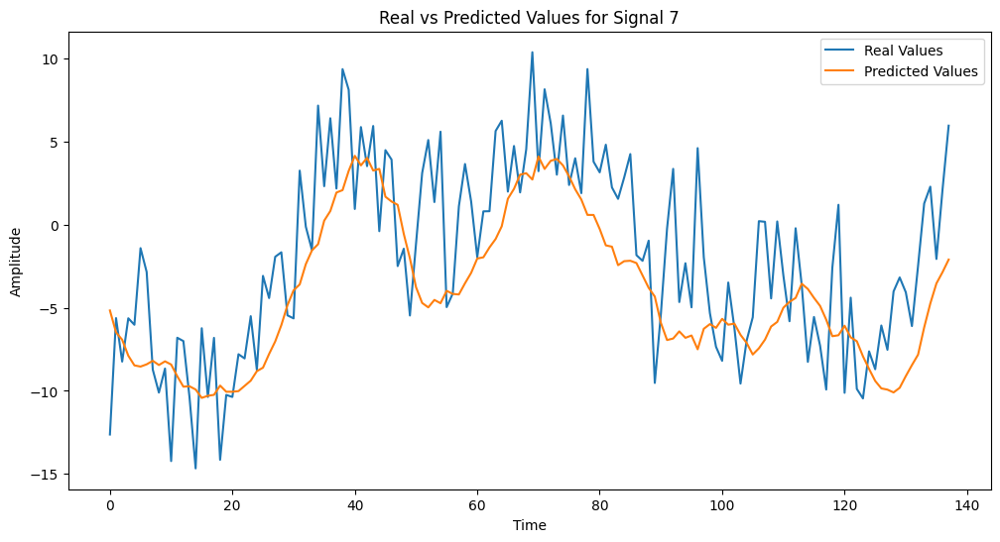


--- Prediction for Signal 8 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
MSE for Signal 8: 22.930782318115234


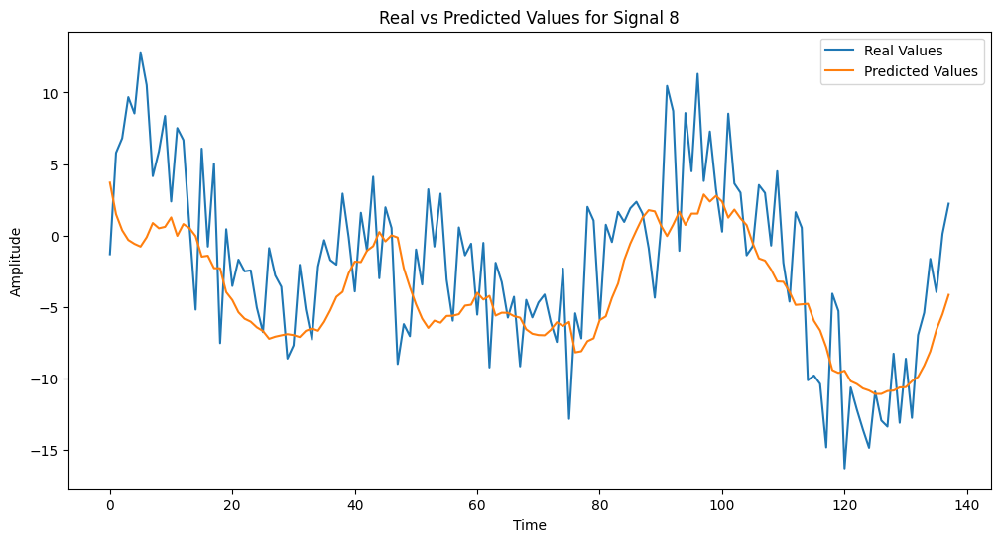


--- Prediction for Signal 9 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step
MSE for Signal 9: 38.721946716308594


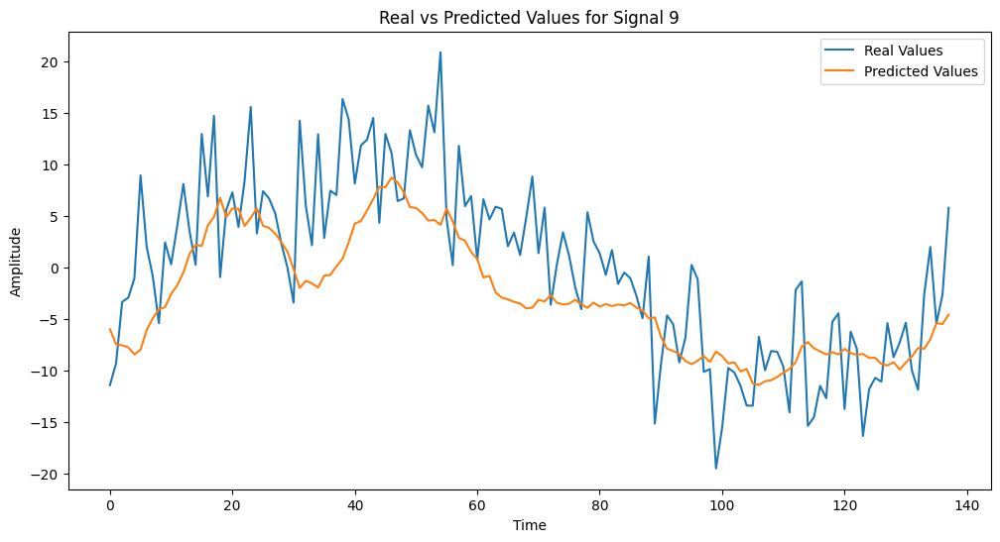


--- Prediction for Signal 10 ---
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
MSE for Signal 10: 34.57151794433594


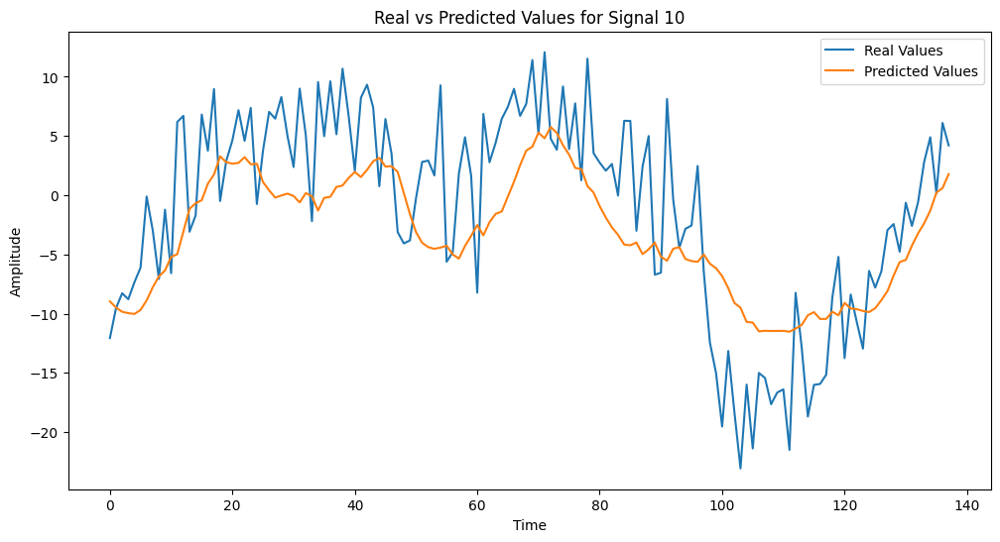

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dropout, Lambda, Dense, Flatten, Multiply, Reshape, Activation, Concatenate, LeakyReLU
from tensorflow.keras.models import Model
import numpy as np
import random
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to set random seed for reproducibility
def set_seed(seed_value=42):
    np.random.seed(seed_value)
    random.seed(seed_value)
    tf.random.set_seed(seed_value)

set_seed(42)

# Function to apply Fourier Transform
def fourier_transform_layer_v4(input_tensor):
    fft = tf.signal.rfft(input_tensor)
    return tf.abs(fft)

# Compiling the model with three branches
sequence_len = 60  # Define the sequence length
fft_length = sequence_len // 2 + 1  # Length of the FFT output

input_sales = Input(shape=(sequence_len, 1))  # Input for the sales (signals)
input_mean = Input(shape=(3, 1))  # Input for the moving averages

# Temporal Branch
x_time = Bidirectional(LSTM(128, activation='relu', return_sequences=False))(input_sales)
x_time = Dropout(0.1)(x_time)

# Frequency Branch (Fourier Transform)
reshaped_input_sales = Reshape((sequence_len,))(input_sales)
x_freq = Lambda(fourier_transform_layer_combined)(reshaped_input_sales)

# Attention mechanism on the Fourier-transformed data
attention_scores_freq = Dense(fft_length, activation=LeakyReLU(negative_slope=0.03))(x_freq)
attention_scores_freq = Flatten()(attention_scores_freq)
attention_weights_freq = Activation('sigmoid')(attention_scores_freq)
attention_weights_freq = Reshape((fft_length,))(attention_weights_freq)

# Apply attention weights to the Fourier-transformed data
x_freq_attended = Multiply()([x_freq, attention_weights_freq])
x_freq_flat = Flatten()(x_freq_attended)
x_freq_flat = Dropout(0.1)(x_freq_flat)
x_freq_dense = Dense(64, activation='relu')(x_freq_flat)
x_freq_dense = Dropout(0.1)(x_freq_dense)

# Moving Averages Branch with attention mechanism
reshaped_input_mean = Reshape((3,))(input_mean)
attention_scores_mean = Dense(3, activation=LeakyReLU(negative_slope=0.03))(reshaped_input_mean)
attention_scores_mean = Flatten()(attention_scores_mean)
attention_weights_mean = Activation('sigmoid')(attention_scores_mean)
attention_weights_mean = Reshape((3, 1))(attention_weights_mean)

# Apply attention weights to the moving averages
x_mean_attended = Multiply()([input_mean, attention_weights_mean])
x_mean_flat = Flatten()(x_mean_attended)
x_mean_flat = Dropout(0.1)(x_mean_flat)
x_mean_dense = Dense(64, activation='relu')(x_mean_flat)
x_mean_dense = Dropout(0.1)(x_mean_dense)

# Combine the three branches
x_combined = Concatenate()([x_time, x_freq_dense, x_mean_dense])

# Output Layers
x_output = Dense(64, activation='relu')(x_combined)
x_output = Dropout(0.1)(x_output)
x_output = Dense(1)(x_output)

# Create the final model
model = Model(inputs=[input_sales, input_mean], outputs=x_output)
model.compile(optimizer='rmsprop', loss='mse')

model.summary()

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='loss', patience=20, restore_best_weights=True)

# Path to save the trained model
path_combination_bilstm = '/content/drive/MyDrive/Tirocinio/LstmFourier/Improving/Combination/BiLSTM_avg3_attention.keras'

# Lists to save test data and predictions
X_test_lag_list = []
X_test_rolling_list = []
y_test_list = []
predictions = []

# Train/Test split ratio
ratio = 0.7

# Loop to train the model on each signal
for i, signal in enumerate(signals):
    print(f'--- Fourier Component on Signal {i+1} ---')
    fourier_analysis(signal, 520)

    print(f"\n--- Training on Signal {i+1} ---")
    signal = pd.Series(signal)

    # Create dataset for the current signal
    lag_table, rolling_table, y = create_dataset_with_baseline(signal, sequence_len)
    lag_table_train, lag_table_test = divide_set(lag_table, ratio)
    rolling_table_train, rolling_table_test = divide_set(rolling_table, ratio)
    y_train, y_test = divide_set(y, ratio)

    # Save the test data for later prediction
    X_test_lag_list.append(lag_table_test)
    X_test_rolling_list.append(rolling_table_test)
    y_test_list.append(y_test)

    # Scaling the data
    scaler_lag = MinMaxScaler(feature_range=(0, 1))
    scaler_rolling = MinMaxScaler(feature_range=(0, 1))
    scaler_y = MinMaxScaler(feature_range=(0, 1))

    lag_table_train_scaled = scaler_lag.fit_transform(lag_table_train)
    lag_table_test_scaled = scaler_lag.transform(lag_table_test)

    rolling_table_train_scaled = scaler_rolling.fit_transform(rolling_table_train)
    rolling_table_test_scaled = scaler_rolling.transform(rolling_table_test)

    y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
    y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

    # Align the length of the training inputs to match
    min_samples_train = min(len(lag_table_train_scaled), len(rolling_table_train_scaled), len(y_train_scaled))
    lag_table_train_scaled = lag_table_train_scaled[:min_samples_train]
    rolling_table_train_scaled = rolling_table_train_scaled[:min_samples_train]
    y_train_scaled = y_train_scaled[:min_samples_train]

    # Train the model
    model.fit(
        [lag_table_train_scaled, rolling_table_train_scaled],
        y_train_scaled,
        epochs=200,
        batch_size=64,
        callbacks=[early_stopping],
        verbose=1
    )

# Save the trained model
model.save(path_combination_bilstm)

# Final predictions and visualization
for i, (X_test_lag, X_test_rolling) in enumerate(zip(X_test_lag_list, X_test_rolling_list)):
    print(f"\n--- Prediction for Signal {i+1} ---")

    # Scale the test data for the current signal
    X_test_lag_scaled = scaler_lag.transform(X_test_lag)
    X_test_rolling_scaled = scaler_rolling.transform(X_test_rolling)
    y_test_scaled = scaler_y.transform(y_test_list[i].reshape(-1, 1)).flatten()

    # Align the length of the inputs to match for the test data
    min_samples_test = min(len(X_test_lag_scaled), len(X_test_rolling_scaled), len(y_test_scaled))
    X_test_lag_scaled = X_test_lag_scaled[:min_samples_test]
    X_test_rolling_scaled = X_test_rolling_scaled[:min_samples_test]
    y_test_scaled = y_test_scaled[:min_samples_test]

    # Make predictions with the model
    y_pred_scaled = model.predict([X_test_lag_scaled, X_test_rolling_scaled])
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_test_inv = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))

    predictions.append(y_pred)

    # Calculate MSE for the current signal
    test_mse = MeanSquaredError()(y_test_inv, y_pred).numpy()
    print(f'MSE for Signal {i+1}: {test_mse}')

    # Plot the results
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_inv, label='Real Values')
    plt.plot(y_pred, label='Predicted Values')
    plt.title(f'Real vs Predicted Values for Signal {i+1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()
